# Exploratory Data Analysis (EDA) 
### For Hierachical Multivariate Time Series User Arousal Level Classification
##### Using pupil diameter data and baseline

#### DEPENDENCIES AND METHODS

In [ ]:
!pip install --quiet pytorch-lightning
!pip install --quiet seaborn
!pip install pyyaml==5.4.1

# import os
# os.kill(os.getpid(), 9)
# That will kill the current Python run

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import json
import plotly.graph_objects as go
import pandas as pd
import torch
import pytorch_lightning as pl
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from tqdm import tqdm
from IPython.display import HTML
from sklearn.preprocessing import LabelEncoder
from os import cpu_count, environ

import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.modules import dropout

from multiprocessing import cpu_count
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torchmetrics.functional import accuracy
from sklearn.metrics import classification_report, confusion_matrix


pl.seed_everything(42)

float_formatter = "{:.8f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})


def print_yellow(text): print("\033[93m {}\033[00m".format(text))


def print_bold(text): print(f"\033[1m {text} \033[0m")


def read_json(path):
  with open(path, 'r') as file_in:
     return json.load(file_in)


def max_listoflists_lenght(l, verbose=False):
  """l is a list of lists"""
  max_lenght = 0
  for i in l:
    try:
      if max_lenght < len(i):
        max_lenght = len(i)
    except TypeError:
      print("element in list: ", i)
      return None
  if verbose:
    print("min_lenght: ", min_listoflists_lenght(l))
    print("max_lenght: ", max_lenght)
  return max_lenght


def min_listoflists_lenght(l):
  """l is a list of lists"""
  min_lenght = 999999
  for i in l:
    if min_lenght > len(i):
      min_lenght = len(i)
  return min_lenght


def normalize(l, verbose=False):
  l = (l - np.mean(l)) / np.std(l)
  l = [i.tolist() for i in l]
  if verbose:
    print("max: ", max(l))
    print("mean: ", np.mean(l))
    print("std: ", np.std(l))
  return l


def normalize_lenghts(l, verbose=False, max_lenght=0):
  """l is a list of lists"""
  if max_lenght==0:
    max_lenght = max_listoflists_lenght(l, verbose)
  print("max_lenght: ", max_lenght)
  new_l = [np.interp(np.linspace(0, 1, max_lenght).astype('float'), np.linspace(0, 1, len(l_i)).astype('float'), l_i) for l_i in l]
  if verbose:
    min_listoflists_lenght(l)
  return new_l


def normalize_single_lenght(l, max_lenght=0):
  """l is a list"""
  if max_lenght==0:
    max_lenght = max([len(i) for i in l])
  print("max_lenght: ", max_lenght)
  new_l = np.interp(np.linspace(0, 1, max_lenght).astype('float'), np.linspace(0, 1, len(l)).astype('float'), l)
  return new_l


def add_pattern_name_to_ts(distance_ts, pupil_ts):
  new_pupil_ts = []
  for distance, pupil in zip(distance_ts, pupil_ts):
    pattern_name, _ = distance
    new_pupil_ts.append([pattern_name, pupil])
  return new_pupil_ts


def get_distance_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  distance_collection = []
  
  for ix, sample in df.iterrows():
    # print(sample)
    try:
      distance_collection.append([sample['pattern_name'], sample['ts_distance'].tolist()])
    except AttributeError:
      distance_collection.append([sample['pattern_name'], sample['ts_distance']])
  return distance_collection


def get_pupil_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  pupil_collection = []

  for ix, sample in df.iterrows():
    try:
      pupil_collection.append([sample['pattern_name'], sample['ts_pupil'].tolist()])
    except AttributeError:
      pupil_collection.append([sample['pattern_name'], sample['ts_pupil']])
  return pupil_collection 
  

def get_xy_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  collection_x = []
  collection_y = []

  for ix, sample in df.iterrows():
    try:
      collection_x.append([sample['pattern_name'], sample['x_coord'].tolist()])
      collection_y.append([sample['pattern_name'], sample['y_coord'].tolist()])

    except AttributeError:  # when the dataframe is read from .csv
      collection_x.append([sample['pattern_name'], sample['x_coord']])
      collection_y.append([sample['pattern_name'], sample['y_coord']])

  return collection_x, collection_y


def remove_zeros_from_list(l):
    clean_indices = [ix for ix, v in enumerate(l) if v == 0]
    clean_series = [v for ix, v in enumerate(l) if v != 0]
    return clean_series, clean_indices


def build_dataframe(data_generator, verbose=False):
  # todo: generalize
  print("number of collections (participants): ", len(data_generator[0]), end="\n\n")

  df_concat = pd.DataFrame()

  for ix, (participant_data_distance, participant_name, participant_data_pupil, participant_xcoord, participant_ycoord, participant_speed) \
   in enumerate(zip(data_generator[0], data_generator[1], data_generator[2], data_generator[3], data_generator[4], data_generator[5])):

    df_distance = pd.DataFrame(participant_data_distance, columns=["pattern_name", "ts_distance"])
    df_pupil = pd.DataFrame(participant_data_pupil, columns=["pattern_name", "ts_pupil"])
    df_x = pd.DataFrame(participant_xcoord, columns=["pattern_name", "x_coord"])
    df_y = pd.DataFrame(participant_ycoord, columns=["pattern_name", "y_coord"])
    df_speed = pd.DataFrame(participant_speed, columns=["pattern_name", "speed"])

    if ix == 0 and verbose:
      print("cofirming pattern...")
      print(df_distance['pattern_name'].head())
      print(df_pupil['pattern_name'].head())
      print(df_x['pattern_name'].head())
      print(df_y['pattern_name'].head())
      print(df_speed['pattern_name'].head())
      print()

    # put everything in one dataframe: df_distance then concat
    df_distance["ts_pupil"] = df_pupil["ts_pupil"]
    df_distance["participant_name"] = participant_name
    df_distance["x_coord"] = df_x["x_coord"]
    df_distance["y_coord"] = df_y["y_coord"]
    df_distance["speed"] = df_speed["speed"]

    print(f"{len(participant_data_distance)} rows are being been added for {participant_name}...")
    df_concat = pd.concat([df_concat, df_distance], ignore_index=True) if ix>0 else df_distance

  print(f"\nDataFrame has now {len(df_concat.ts_distance)} samples...")
  return df_concat


def check_lenghts_of_feature_values(df_concat):
  print_bold("checking sequence lenghts matching between features...\n")
  max_diff = 0
  max_diff_ix = 0

  for ix, (d, p, x, y) in enumerate(zip(df_concat['ts_distance'], df_concat['ts_pupil'], df_concat['x_coord'], df_concat['y_coord'])):
    diff = np.abs(len(d)-len(p))
    if ix < 10:
      print(f"[{ix}] len(sequence) in ts_distance: {len(d)}, len(sequence) in ts_pupil: {len(p)}, len(sequence) in x_coord: {len(x)}, len(sequence) in y_coord: {len(y)}", end=", ")
      print(f"diff(d|p): {diff}", end=" ")
      print_bold(len(d)==len(p))

    if max_diff < diff:
      max_diff = diff
      max_diff_ix = ix
    

  print("\nmin lenght in ts_distance = ", min_listoflists_lenght(df_concat['ts_distance'].tolist()))
  print("min lenght in ts_pupil = ", min_listoflists_lenght(df_concat['ts_pupil'].tolist()))
  print("max lenght in ts_distance = ", max_listoflists_lenght(df_concat['ts_distance'].tolist()))
  print("max lenght in ts_pupil = ", max_listoflists_lenght(df_concat['ts_pupil'].tolist()))
  print("max diff in between ts_distance and ts_pupil= ", max_diff, ", index: ", max_diff_ix)


def add_lenghts_features(df_concat):
  lenght_ts_distance = [len(d) for d in df_concat['ts_distance']]
  lenght_ts_pupil = [len(p) for p in df_concat['ts_pupil']]
  lenght_x = [len(x) for x in df_concat['x_coord']]
  lenght_y = [len(y) for y in df_concat['y_coord']]
  df_concat['len(ts_distance)'] = lenght_ts_distance
  df_concat['len(ts_pupil)'] = lenght_ts_pupil
  df_concat['len(x_coords)'] = lenght_x
  df_concat['len(y_coords)'] =lenght_y
  return df_concat


def get_zeros_indices(df_concat, column:str):
  max_blinks, dirty_length = 0, 1
  cleanest_ix, dirtiest_ix = 0, 0
  for ix, series in enumerate(df_concat[column]):
    if series.count(0) == 0:
      cleanest_ix = ix
    if series.count(0) > max_blinks:
      max_blinks = series.count(0)
      dirtiest_ix = ix
      dirty_length = len(series)

  dirty_ratio = int((max_blinks/dirty_length)*100)

  # plot cleanest and dirtiest
  print(f"displaying latest perfectly clean sample and the dirtiest of the dataset for feaure: {column}")
  if df_concat.iloc[[cleanest_ix]].index == df_concat.loc[[cleanest_ix]].index:
    print("good sample index: ", cleanest_ix)
  else:
    print("ERROR: iloc loc dont match ix")

  if df_concat.iloc[[dirtiest_ix]].index == df_concat.loc[[dirtiest_ix]].index:
    print("bad sample index: ", dirtiest_ix, ", number of blinks: ", max_blinks, f"({dirty_ratio})%", "\n")
  else:
    print("ERROR: iloc loc dont match ix")
  
  return cleanest_ix, dirtiest_ix, dirty_ratio, max_blinks


def remove_zero_values_from_column(column:str, df_concat):
  df_concat_dirty = df_concat.copy(deep=True)
  total_zeros = 0
  for ix, series in enumerate(df_concat[column]):
    if series.count(0) > 0:
      total_zeros+=series.count(0)
      clean_series, indices = remove_zeros_from_list(series)
      df_concat.at[ix, column] = clean_series
  return df_concat, df_concat_dirty, total_zeros


def IQR(df_concat, k = 3, feature='', outliers_name=''):  # extreme outliers, k = 3

  """The Interquartile range (IQR) is calculated as the difference between the 75th and the 25th percentiles of the data. The IQR can be used to identify outliers by defining limits on the sample values that are a factor k of 
the IQR below the 25th percentile or above the 75th percentile. The common value for the factor k is the value 1.5 (which we have used here). A factor k of 3 or more can be used to identify values that are extreme outliers or 
'far outs'."""

  # Calculate IQR for the component pc
  q1_feature, q3_len_distance = df_concat[feature].quantile([0.25, 0.75])
  iqr_pc = q3_len_distance - q1_feature

  # k default = 3 (extremes)
  lower_pc = q1_feature - (k * iqr_pc)
  upper_pc = q3_len_distance + (k * iqr_pc)

  # Filter out the outliers from the pc
  df_concat[outliers_name] = ((df_concat[feature]>upper_pc) | (df_concat[feature]<lower_pc)).astype('int')

  return df_concat


def get_xy_pattern_data(df_concat, pattern):
  pattern_ = 'pattern' + str(pattern)
  print('pattern', pattern)
  df_concat_p = df_concat[df_concat.pattern_name == pattern_].copy(deep=True)
  data_get_x = [(name, get_xy_in_dataframe(df_concat_p, name)[0]) for name in PARTICIPANTS]
  print("data_get_x: ", data_get_x)
  display(df_concat)
  data_get_y = [(name, get_xy_in_dataframe(df_concat_p, name)[1]) for name in PARTICIPANTS]
  return data_get_x, data_get_y, df_concat_p

INFO:lightning_lite.utilities.seed:Global seed set to 42


In [ ]:
# PLOTS

def plot_collection(plot_only_this, distances_collection,
                    number_of_desired_plots=0):

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(distances_collection))

  for (pattern_name, d) in distances_collection:
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(y=d))
        fig.update_layout(title=plot_only_this)
      else:
        fig.add_trace(go.Line(y=d))
      plots_count += 1
      fig.update_layout(width=1200, height=800)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig


def plot_pattern(plot_only_this:str, x, y,
                    number_of_desired_plots=0):

      # todo: there is a lot of redundancy, you could clear a lot of lines

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(x))

  for (pattern_name, x_coord), (pattern_name_y, y_coord) in zip(x, y):
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(x= x_coord, y=y_coord))
        fig.update_layout(title=plot_only_this)
      else:
        fig.add_trace(go.Line(x= x_coord, y=y_coord))
      plots_count += 1
      fig.update_layout(width=1200, height=800)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig


def plot_experiment(name:str, l, normal=False, normal_only=False, stretched=False, max_lenght=0, verbose=False):
  if verbose:
    print("raw: ")
    print("max: ", max(l))
    print("mean: ", np.mean(l))
    print("std: ", np.std(l), end="\n\n")
    
  fig = go.Figure()
  fig.update_layout(title=name)
  fig.update_layout(width=1200, height=800)
  if not normal_only:
    fig.add_trace(go.Line(name="raw", y=l))

  if normal:
    l_normal = normalize(l, verbose=verbose)
    fig.add_trace(go.Line(name="nomalized_value", y=l_normal))

  if stretched:
    if max_lenght!=0:
      l_normal = normalize_single_lenght(l, max_lenght=max_lenght)
    else:
      l_normal = normalize_single_lenght(l)
    fig.add_trace(go.Line(name="nomalized_lenght", y=l_normal))
      
  return fig


def plot_user_compare(plot_only_this:str, distances_collection, labels,
                    number_of_desired_plots=0):

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(distances_collection))

  for (pattern_name, d), name in zip(distances_collection, labels):
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(y=d, name=name))
        fig.update_layout(title=plot_only_this)
      else:
        fig.add_trace(go.Line(y=d, name=name))
      plots_count += 1
      fig.update_layout(width=1200, height=800)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig


def plot_pattern_user_compare(plot_only_this:str, x, y, labels,
                    number_of_desired_plots=0, width=1200, height=800):

      # todo: there is a lot of redundancy, you could clear a lot of lines

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(x))

  for (pattern_name, x_coord), (pattern_name_y, y_coord), name in zip(x, y, labels):
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(x= x_coord, y=y_coord, name=name))
        fig.update_layout(title=plot_only_this)
        fig.update_layout(width=width, height=height)
      else:
        fig.add_trace(go.Line(x= x_coord, y=y_coord, name=name))
      plots_count += 1
      fig.update_layout(width=width, height=height)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig


def plot_on_click(data_get_x, data_get_y, n, pattern, nicknames=True):
  print(f"\n{n} attempt for all users {pattern}")
  attempt_n = n
  try:
    data_x = [(participant_data[0], participant_data[1][attempt_n-1]) for participant_data in data_get_x]
  except IndexError:
    print("IndexError: data_get_x: ", data_get_x)
  data_y = [(participant_data[0], participant_data[1][attempt_n-1]) for participant_data in data_get_y]

  legends = []
  
  if nicknames:
    legends = [f"Participant {n}" for n in range(len(PARTICIPANTS))]

  else:
    legends = [name for (name, _) in data_x]

  data_x = [d for _, d in data_x]
  data_y = [d for _, d in data_y]

  # print("x:")
  # for i in data_x:
  #   print(i)
  # print("y:")
  # for i in data_y:
  #   print(i)

  return HTML(plot_pattern_user_compare(pattern, data_x, data_y, legends, 850, 750).to_html())


def plot_features_by_row_index(df_concat, index):
  display(df_concat.iloc[[index]])
  pattern_nm = df_concat.iat[index, 1]
  max_diff_data_pupil = df_concat.iloc[[index]].ts_pupil.values.tolist()[0]
  max_diff_data_distance = df_concat.iloc[[index]].ts_distance.values.tolist()[0]
  diff_collection = [[pattern_nm, max_diff_data_distance], [pattern_nm, max_diff_data_pupil]]
  HTML(plot_user_compare(pattern_nm, diff_collection, labels=["ts_distance", "ts_pupil"]).to_html())
  return pattern_nm, diff_collection
  

def show_confusion_matrix(confusion_matrix):
  hmap = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues")
  hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
  hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
  plt.ylabel('True User')
  plt.xlabel('Predicted User')

#### DATA

In [ ]:
FLOAT_RESOLUTION = 4

In [ ]:
import pathlib

print("number of files: ", len(list(pathlib.Path('.').glob('*.json'))))

print("building base dataframe...\n")

data_dict = dict({'trial_id':[], 'pupil_dilation':[], 'baseline':[], 'rating':[]})

for json_file in tqdm(pathlib.Path('.').glob('*.json')):
  with open(json_file, 'r') as file_in:
    data = json.load(file_in)
    for k in data:
      for i in data[k]:
        for k, v in i.items():
          data_dict[k].append(v)

# print("data_dict: ", data_dict)
df = pd.DataFrame.from_dict(data_dict)
df["trial_id"] = df.trial_id.map(lambda s: "".join([c for c in s if c.isdigit()]))
df["len_pupil_dilation"] = df.pupil_dilation.map(lambda l: len(l))
df["len_baseline"] = df.baseline.map(lambda l: len(l))
df

number of files:  16
building base dataframe...



16it [00:00, 243.74it/s]


,trial_id,pupil_dilation,baseline,rating,len_pupil_dilation,len_baseline
0,17,"[3.161224365234375, 3.15435791015625, 3.158401...","[3.173110961914062, 3.1741943359375, 3.1699523...",3.0,299,87
1,3,"[3.470809936523438, 3.470809936523438, 3.47135...","[3.197723388671875, 3.197723388671875, 3.20982...",4.0,299,86
2,13,"[3.403854370117188, 3.405105590820312, 3.40625...","[3.50897216796875, 3.50897216796875, 3.4956512...",0.0,299,88
3,10,"[3.73724365234375, 3.73724365234375, 3.7338562...","[3.719680786132812, 3.722244262695312, 3.72224...",3.0,300,89
4,6,"[3.293930053710938, 3.300216674804688, 3.30154...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.1688690185...",3.0,300,88
...,...,...,...,...,...,...
475,2,"[2.64227294921875, 2.64227294921875, 2.6384735...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.9463348...",3.0,300,89
476,9,"[3.054656982421875, 3.054656982421875, 3.04473...","[2.756729125976562, 2.790618896484375, 2.80636...",3.0,300,89
477,8,"[2.870376586914062, 2.884490966796875, 2.88742...","[2.910888671875, 2.916152954101562, 2.91584777...",3.0,300,88
478,17,"[2.849151611328125, 2.859695434570312, 2.85939...","[0, 0, 0, 0, 0, 0, 0, 2.693389892578125, 2.693...",2.0,299,89


In [ ]:
# df.rating.value_counts().plot(kind="bar")

In [ ]:
# print(df.len_pupil_dilation.value_counts())
# df.len_pupil_dilation.value_counts().plot(kind="bar")

In [ ]:
# print(df.len_baseline.value_counts())
# df.len_baseline.value_counts().plot(kind="bar")

In [ ]:
# remove blinking

remove_blinking = False
for ser in df['pupil_dilation']:
  for f in ser:
    if f == 0.0:
      remove_blinking = True

for ser in df['baseline']:
  for f in ser:
    if f == 0.0:
      remove_blinking = True

if remove_blinking:
  print("blinking (0.0) values were found in your data!")
  number_of_data_points_p = len([d for ser in df.pupil_dilation for d in ser])
  number_of_data_points_b = len([d for ser in df.baseline for d in ser])
  blinks_p = len([d for ser in df.pupil_dilation for d in ser if d==0.0])
  blinks_b = len([d for ser in df.baseline for d in ser if d==0.0])
  df.pupil_dilation = df.pupil_dilation.map(lambda ser: [f for f in ser if f != 0.0])
  df.baseline = df.baseline.map(lambda ser: [f for f in ser if f != 0.0])
  print("blinking values have been removed!")
else:
  print("no blinking values were found in your data!")
print("consider running outlier detection to clean your data!\n")

print("number of data points in pupil_dilation: ", number_of_data_points_p)
print("number of data points in baseline: ", number_of_data_points_b)
print("number of blinks removed from pupil_dilation: ", blinks_p, f"{(blinks_p/number_of_data_points_p)*100}%")
print("number of blinks removed from baseline: ", blinks_b, f"{(blinks_b/number_of_data_points_b)*100}%")
df

blinking (0.0) values were found in your data!
blinking values have been removed!
consider running outlier detection to clean your data!

number of data points in pupil_dilation:  143833
number of data points in baseline:  42350
number of blinks removed from pupil_dilation:  5222 3.6305993756648336%
number of blinks removed from baseline:  4349 10.269185360094452%


,trial_id,pupil_dilation,baseline,rating,len_pupil_dilation,len_baseline
0,17,"[3.161224365234375, 3.15435791015625, 3.158401...","[3.173110961914062, 3.1741943359375, 3.1699523...",3.0,299,87
1,3,"[3.470809936523438, 3.470809936523438, 3.47135...","[3.197723388671875, 3.197723388671875, 3.20982...",4.0,299,86
2,13,"[3.403854370117188, 3.405105590820312, 3.40625...","[3.50897216796875, 3.50897216796875, 3.4956512...",0.0,299,88
3,10,"[3.73724365234375, 3.73724365234375, 3.7338562...","[3.719680786132812, 3.722244262695312, 3.72224...",3.0,300,89
4,6,"[3.293930053710938, 3.300216674804688, 3.30154...","[3.168869018554688, 3.168869018554688, 1.66366...",3.0,300,88
...,...,...,...,...,...,...
475,2,"[2.64227294921875, 2.64227294921875, 2.6384735...","[1.946334838867188, 1.946334838867188, 2.73069...",3.0,300,89
476,9,"[3.054656982421875, 3.054656982421875, 3.04473...","[2.756729125976562, 2.790618896484375, 2.80636...",3.0,300,89
477,8,"[2.870376586914062, 2.884490966796875, 2.88742...","[2.910888671875, 2.916152954101562, 2.91584777...",3.0,300,88
478,17,"[2.849151611328125, 2.859695434570312, 2.85939...","[2.693389892578125, 2.693389892578125, 2.87492...",2.0,299,89


#### PLOT ORIGINAL DATA

In [ ]:
pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.pupil_dilation)]
baseline_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.baseline)]

In [ ]:
# plot with zero values removed
HTML(plot_collection(4, pupil_collection).to_html())

total number of graphs:  480
plots:  68


/usr/local/lib/python3.8/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




#### TRANSFORM DATA

In [ ]:
# add baseline mean column

df['baseline_mean'] = [sum(s)/len(s) for s in df['baseline']]
df

,trial_id,pupil_dilation,baseline,rating,len_pupil_dilation,len_baseline,baseline_mean
0,17,"[3.161224365234375, 3.15435791015625, 3.158401...","[3.173110961914062, 3.1741943359375, 3.1699523...",3.0,299,87,3.157070
1,3,"[3.470809936523438, 3.470809936523438, 3.47135...","[3.197723388671875, 3.197723388671875, 3.20982...",4.0,299,86,3.309555
2,13,"[3.403854370117188, 3.405105590820312, 3.40625...","[3.50897216796875, 3.50897216796875, 3.4956512...",0.0,299,88,3.420836
3,10,"[3.73724365234375, 3.73724365234375, 3.7338562...","[3.719680786132812, 3.722244262695312, 3.72224...",3.0,300,89,3.773386
4,6,"[3.293930053710938, 3.300216674804688, 3.30154...","[3.168869018554688, 3.168869018554688, 1.66366...",3.0,300,88,3.356602
...,...,...,...,...,...,...,...
475,2,"[2.64227294921875, 2.64227294921875, 2.6384735...","[1.946334838867188, 1.946334838867188, 2.73069...",3.0,300,89,2.799478
476,9,"[3.054656982421875, 3.054656982421875, 3.04473...","[2.756729125976562, 2.790618896484375, 2.80636...",3.0,300,89,2.898984
477,8,"[2.870376586914062, 2.884490966796875, 2.88742...","[2.910888671875, 2.916152954101562, 2.91584777...",3.0,300,88,2.892649
478,17,"[2.849151611328125, 2.859695434570312, 2.85939...","[2.693389892578125, 2.693389892578125, 2.87492...",2.0,299,89,2.999335


In [ ]:
# refactor pupil_dilation with baseline_mean in a new column
df['relative_pupil_dilation'] = [df['pupil_dilation'][i] - df['baseline_mean'][i] for i in range(len(df))]
df = df.loc[:, ["trial_id","pupil_dilation", "baseline", "relative_pupil_dilation","baseline_mean", "len_pupil_dilation", "len_baseline", "rating"]]
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,17,"[3.161224365234375, 3.15435791015625, 3.158401...","[3.173110961914062, 3.1741943359375, 3.1699523...","[0.004154073780980649, -0.0027123812971443506,...",3.157070,299,87,3.0
1,3,"[3.470809936523438, 3.470809936523438, 3.47135...","[3.197723388671875, 3.197723388671875, 3.20982...","[0.16125506024028002, 0.16125506024028002, 0.1...",3.309555,299,86,4.0
2,13,"[3.403854370117188, 3.405105590820312, 3.40625...","[3.50897216796875, 3.50897216796875, 3.4956512...","[-0.016981818459250064, -0.015730597756125952,...",3.420836,299,88,0.0
3,10,"[3.73724365234375, 3.73724365234375, 3.7338562...","[3.719680786132812, 3.722244262695312, 3.72224...","[-0.03614275642995102, -0.03614275642995102, -...",3.773386,300,89,3.0
4,6,"[3.293930053710938, 3.300216674804688, 3.30154...","[3.168869018554688, 3.168869018554688, 1.66366...","[-0.06267227665070507, -0.05638565555695507, -...",3.356602,300,88,3.0
...,...,...,...,...,...,...,...,...
475,2,"[2.64227294921875, 2.64227294921875, 2.6384735...","[1.946334838867188, 1.946334838867188, 2.73069...","[-0.1572053328804346, -0.1572053328804346, -0....",2.799478,300,89,3.0
476,9,"[3.054656982421875, 3.054656982421875, 3.04473...","[2.756729125976562, 2.790618896484375, 2.80636...","[0.1556734751506026, 0.1556734751506026, 0.145...",2.898984,300,89,3.0
477,8,"[2.870376586914062, 2.884490966796875, 2.88742...","[2.910888671875, 2.916152954101562, 2.91584777...","[-0.022272369008006, -0.008157989125193055, -0...",2.892649,300,88,3.0
478,17,"[2.849151611328125, 2.859695434570312, 2.85939...","[2.693389892578125, 2.693389892578125, 2.87492...","[-0.15018357496995183, -0.13963975172776477, -...",2.999335,299,89,2.0


In [ ]:
# normalize_lenghts

df.pupil_dilation = normalize_lenghts(df.pupil_dilation.tolist())
df['baseline'] = normalize_lenghts(df.baseline.tolist())
df['relative_pupil_dilation'] = normalize_lenghts(df.relative_pupil_dilation.tolist())

max_lenght:  300
max_lenght:  90
max_lenght:  300


In [ ]:
pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.pupil_dilation)]
relative_pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.relative_pupil_dilation)]
baseline_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.baseline)]

In [ ]:
HTML(plot_collection(1, relative_pupil_collection).to_html())

total number of graphs:  480
plots:  58


/usr/local/lib/python3.8/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




#### OUTLIER DETECTION + REMOVAL USING IQR

##### By anomaly in single series



experiment index:  5


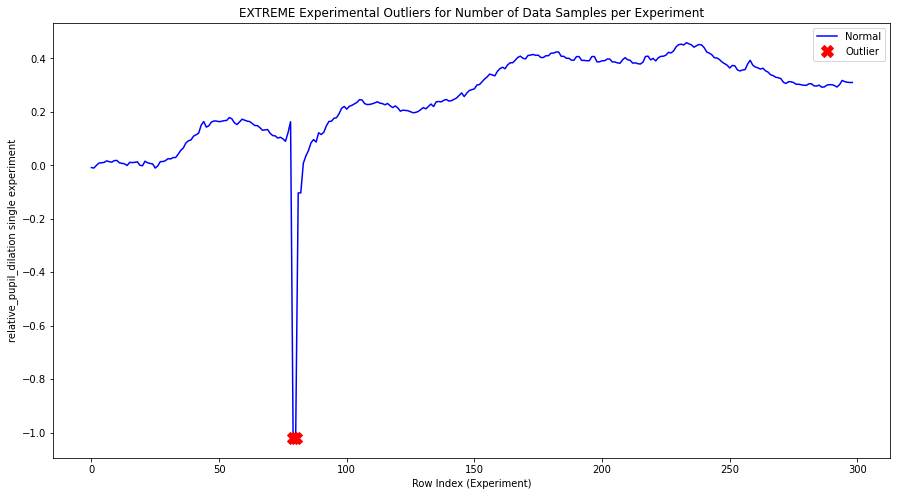



experiment index:  12


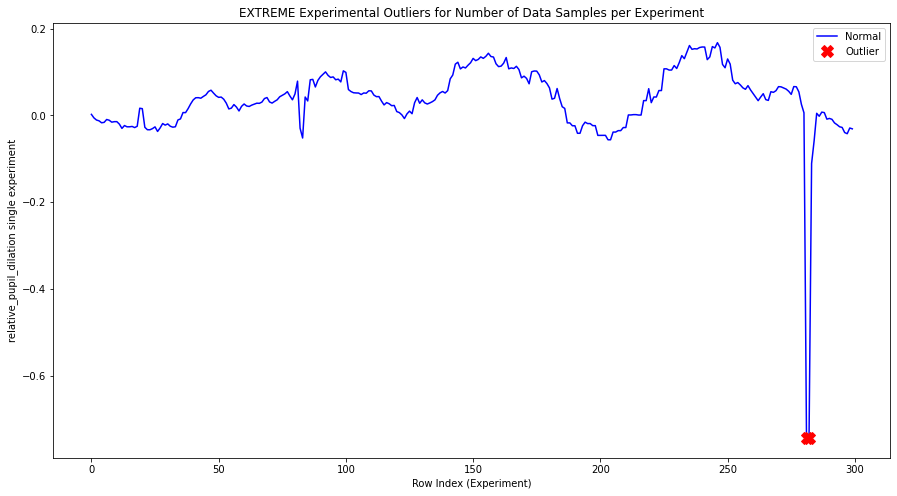



experiment index:  25


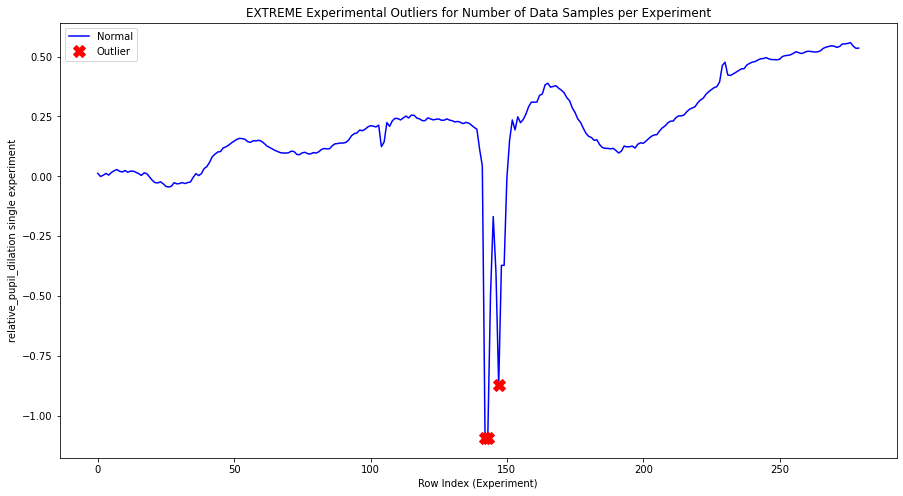



experiment index:  32


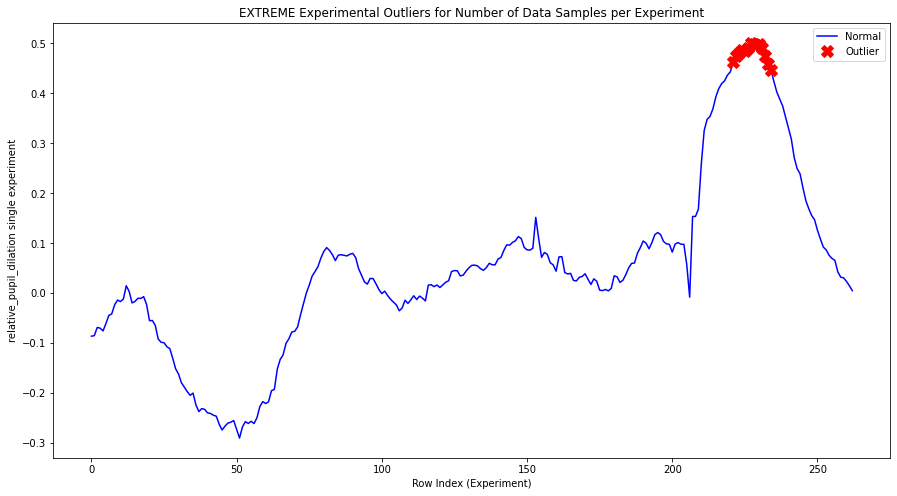



experiment index:  42


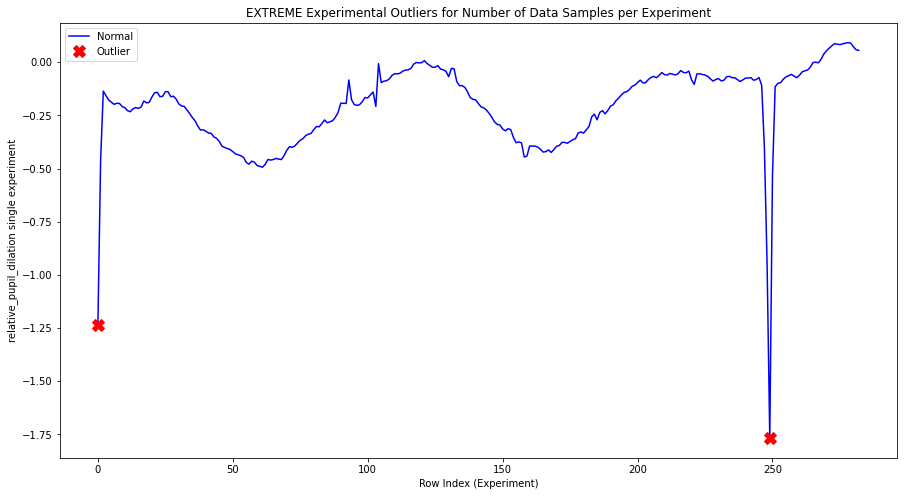



experiment index:  43


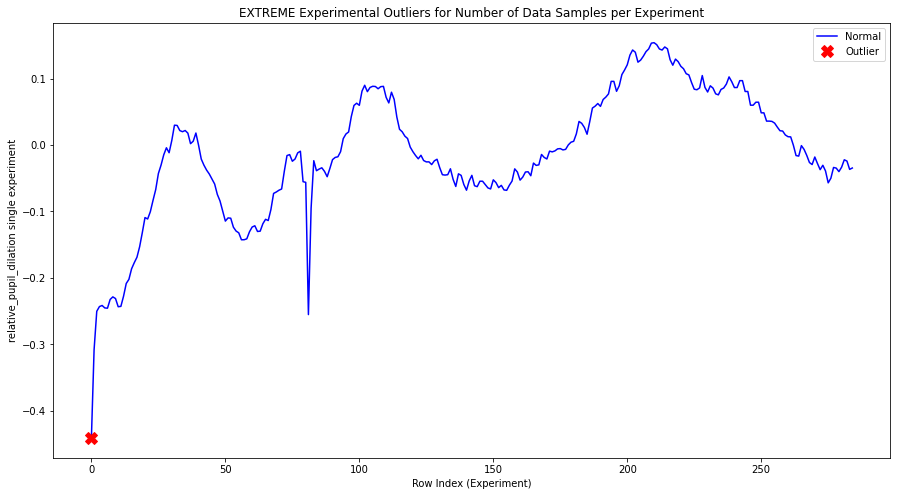



experiment index:  45


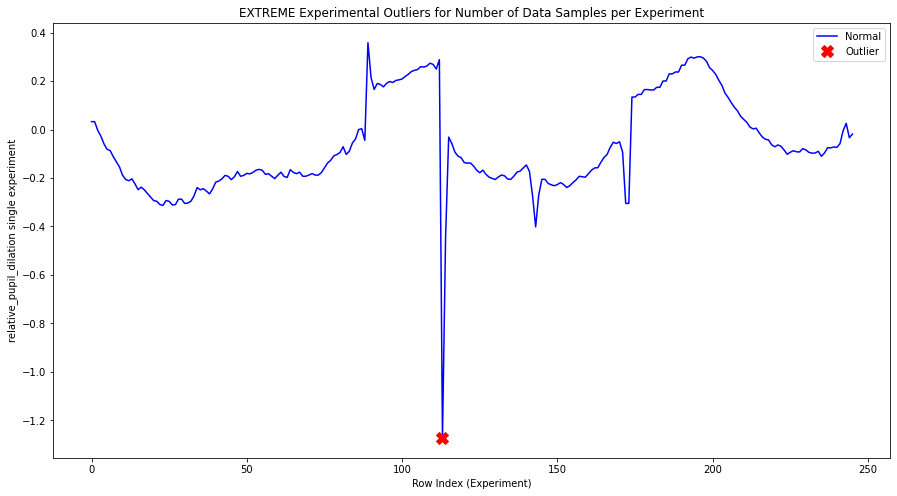



experiment index:  46


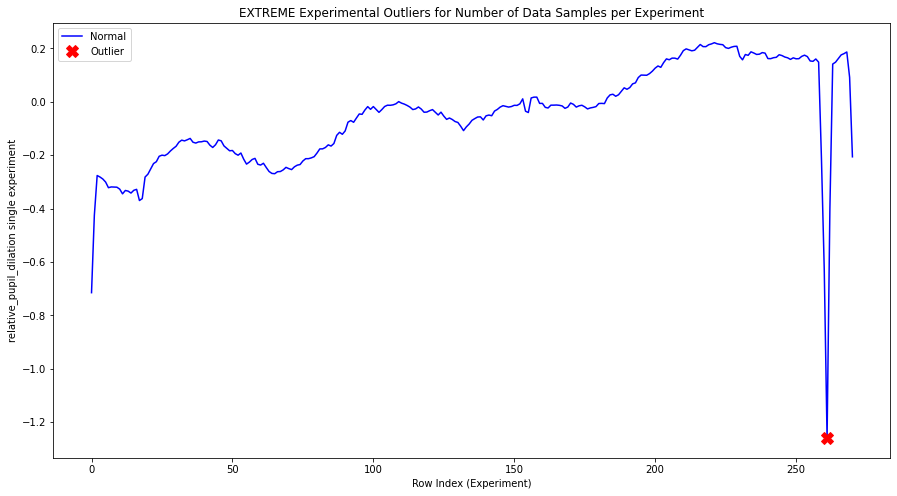



experiment index:  48


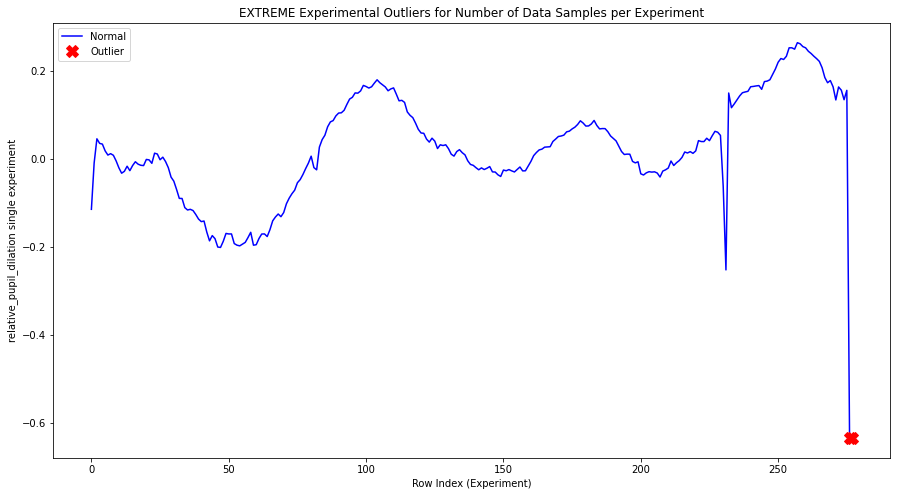



experiment index:  54


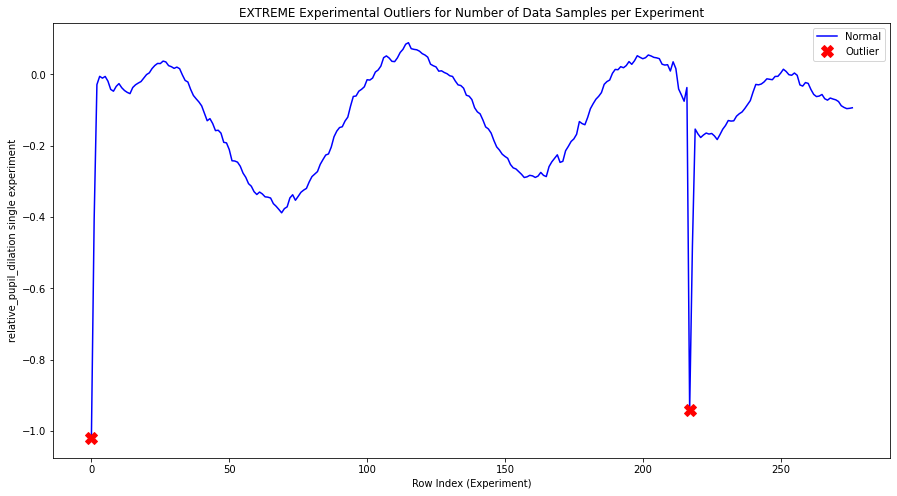



experiment index:  57


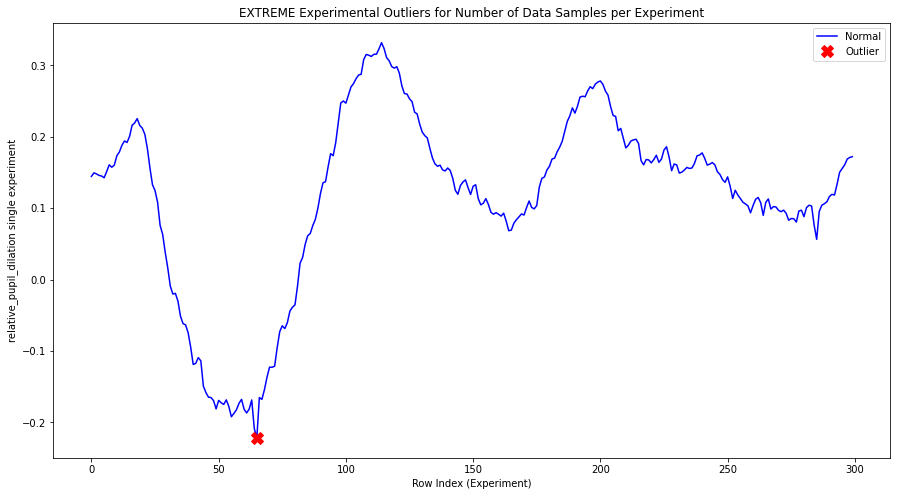



experiment index:  61


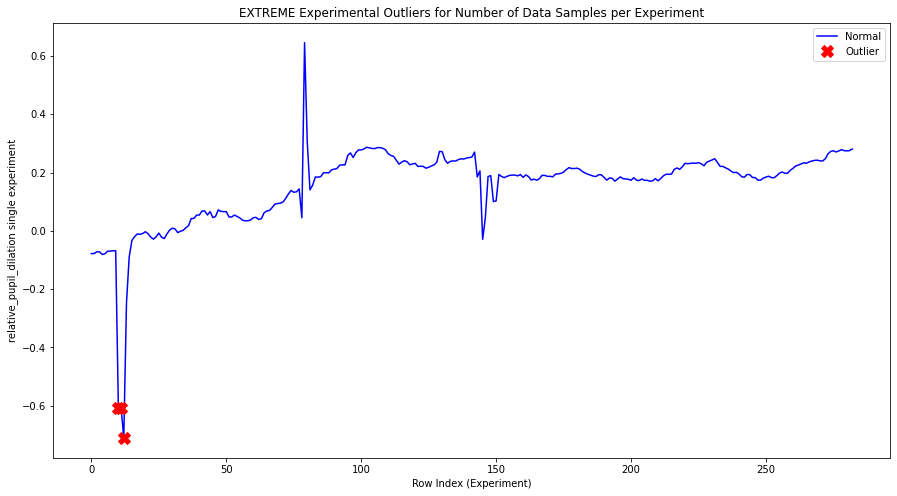



experiment index:  69


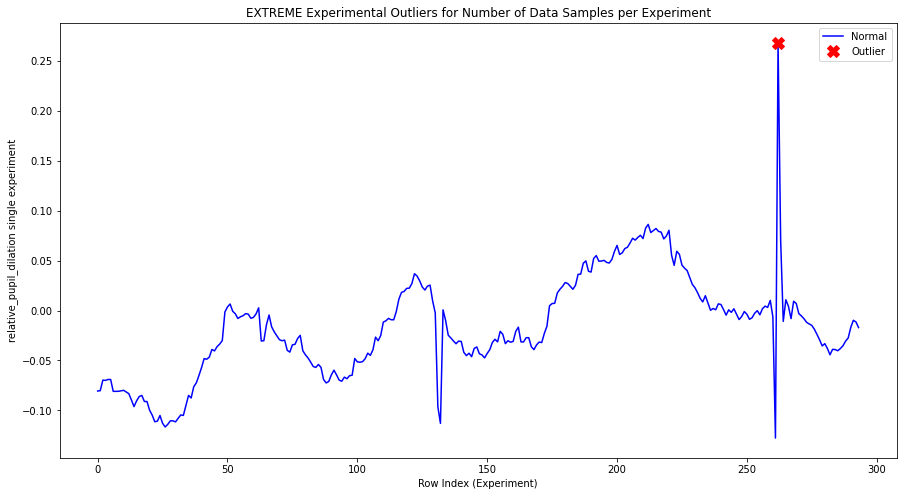



experiment index:  70


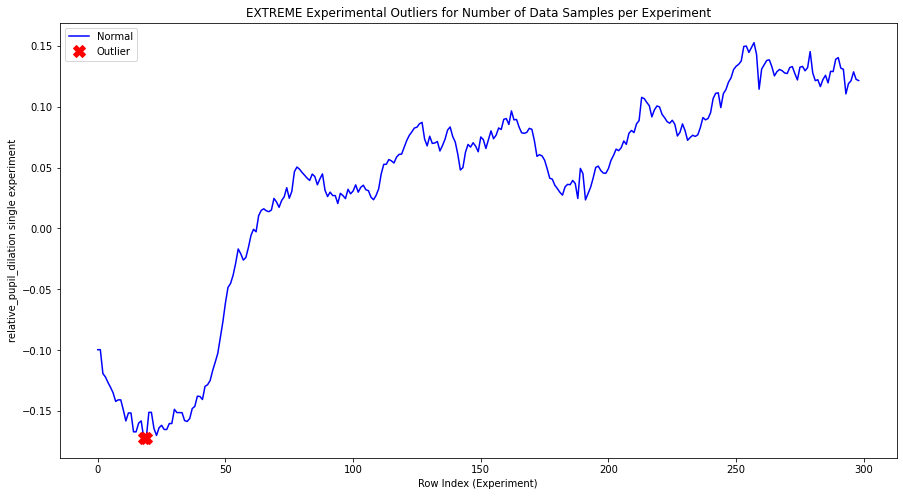



experiment index:  74


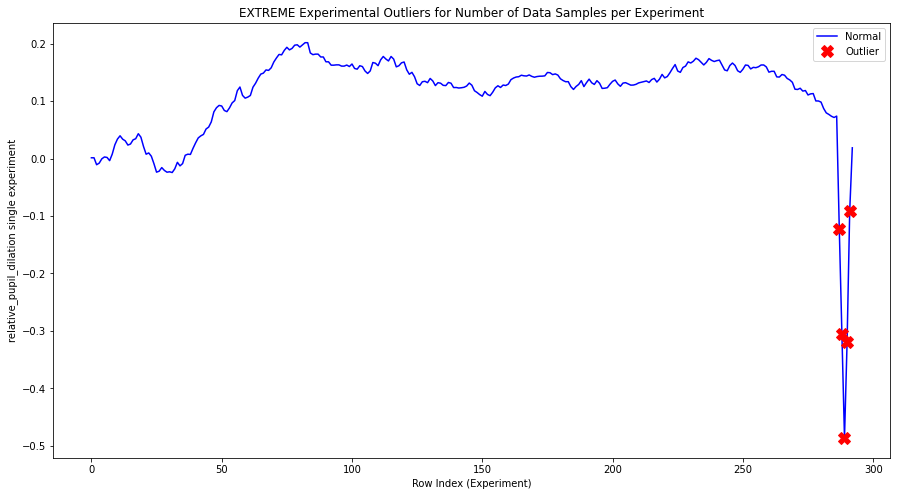



experiment index:  76


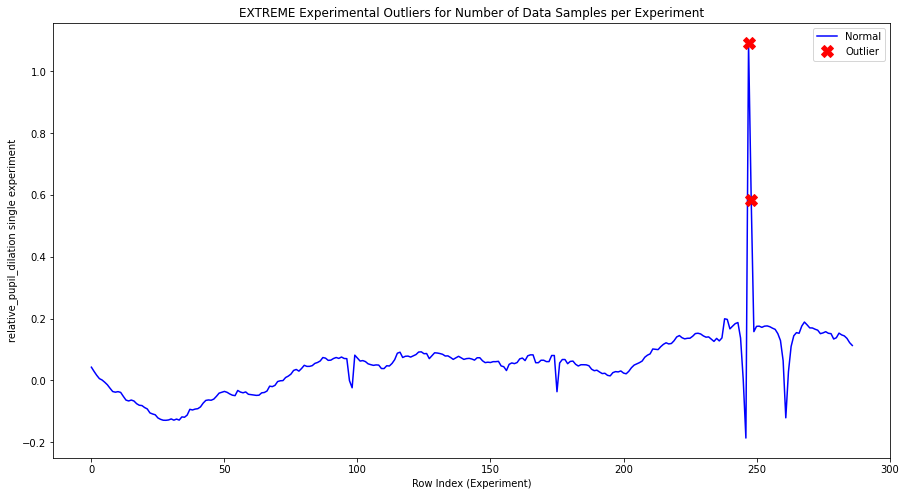



experiment index:  79


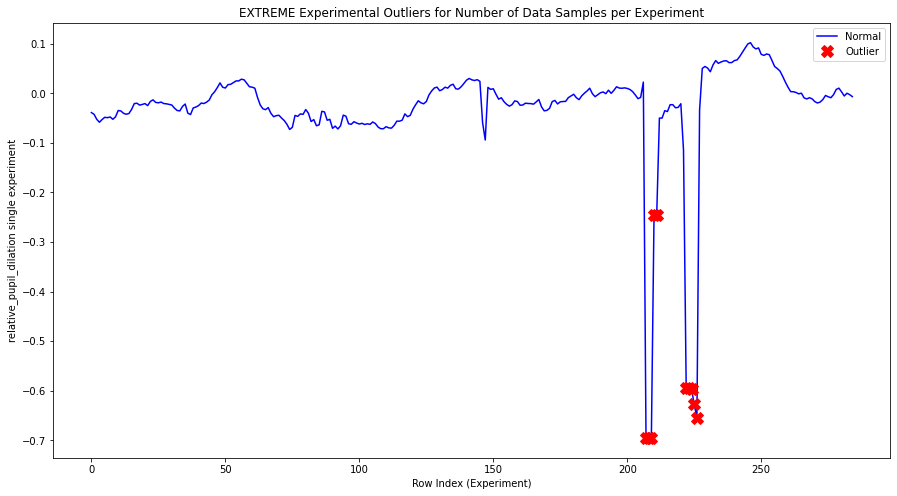



experiment index:  80


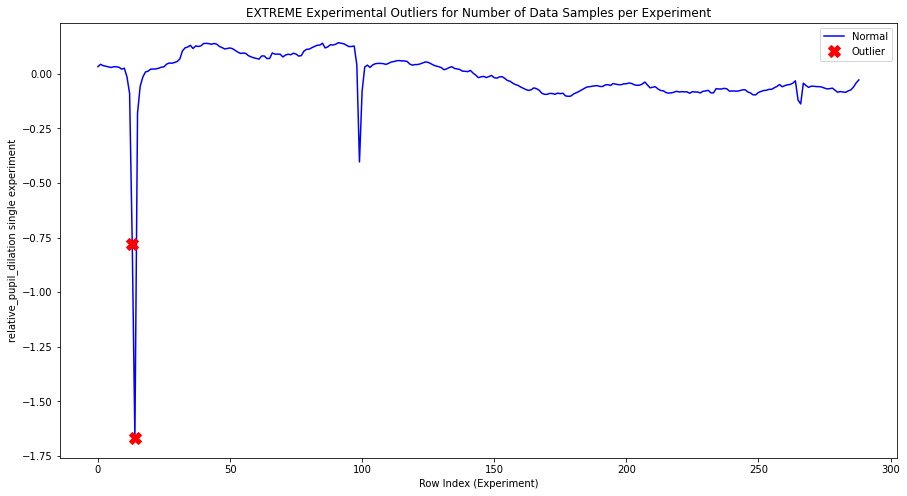



experiment index:  82


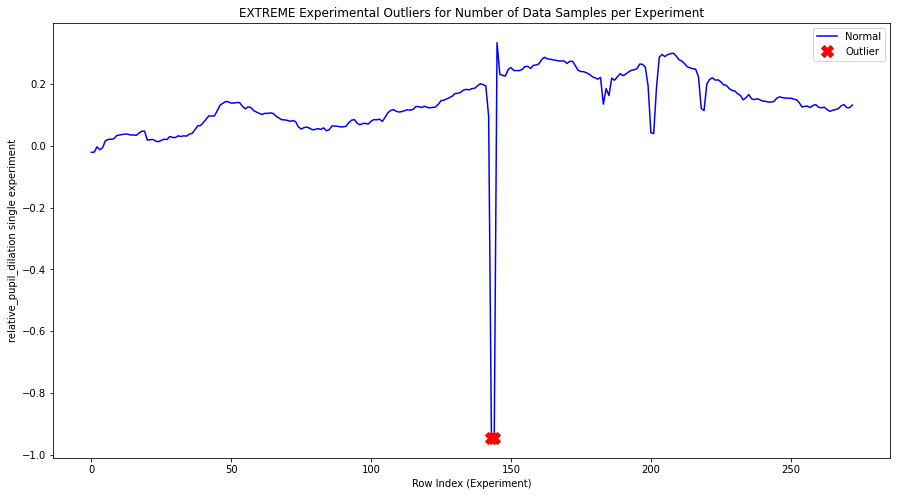



experiment index:  86


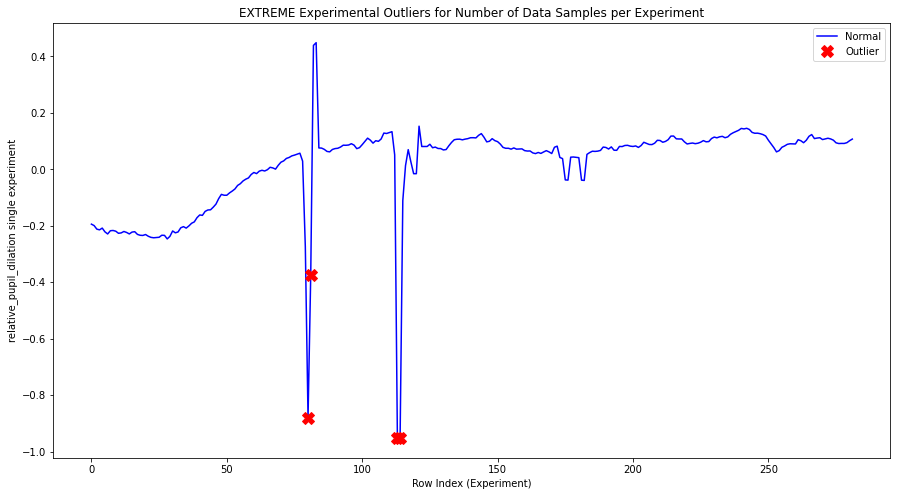



experiment index:  88


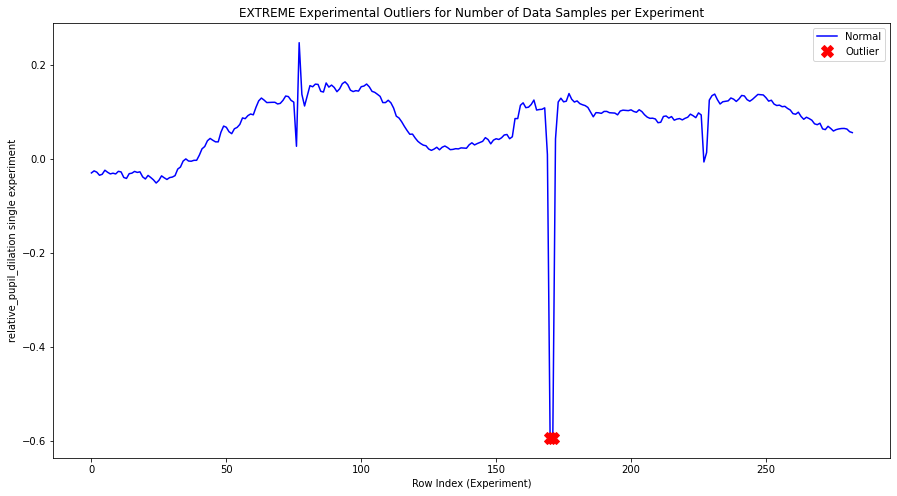



experiment index:  92


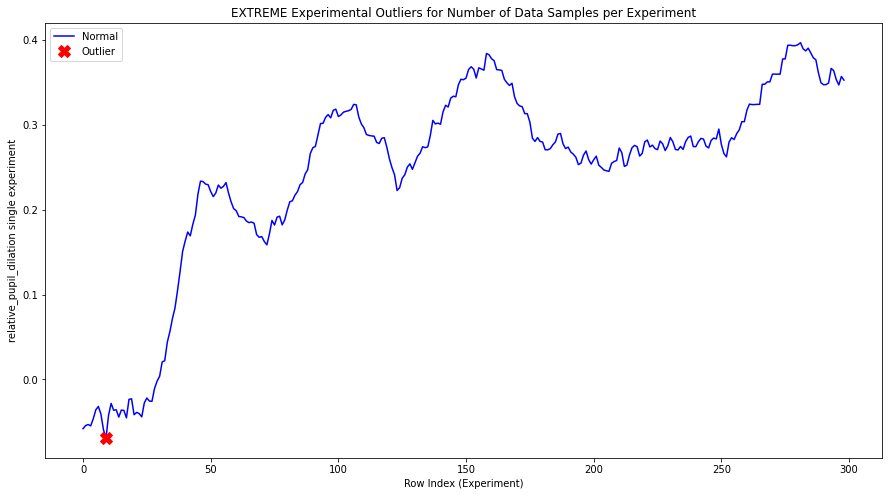



experiment index:  98


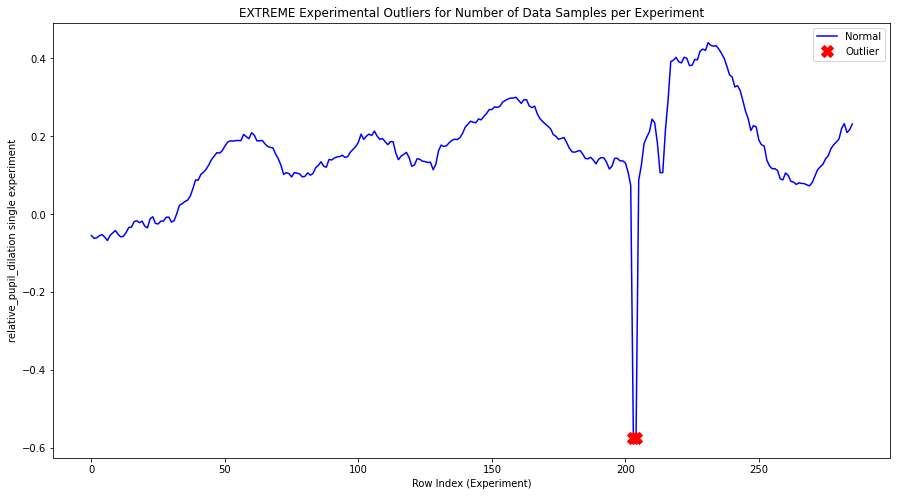



experiment index:  107


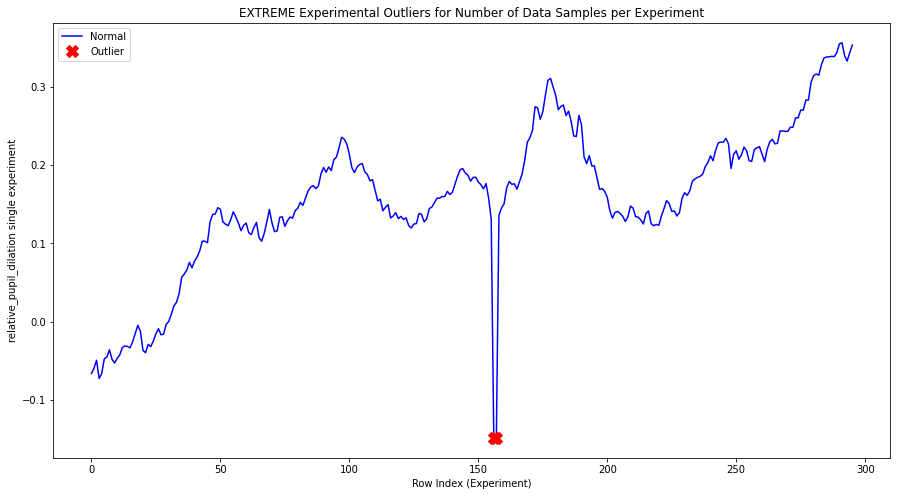



experiment index:  112


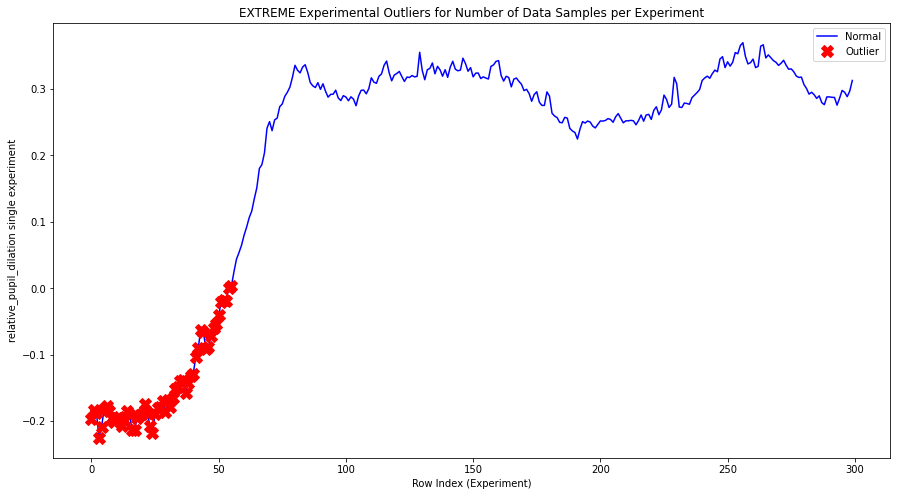



experiment index:  119


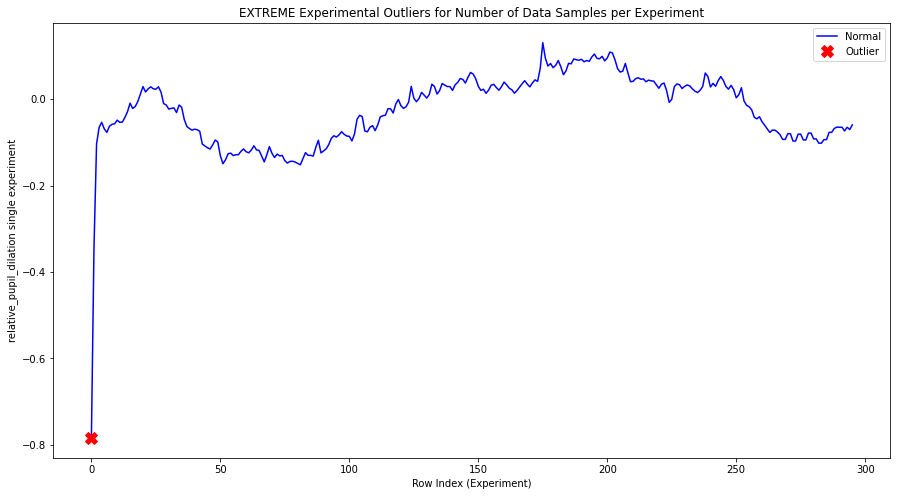



experiment index:  129


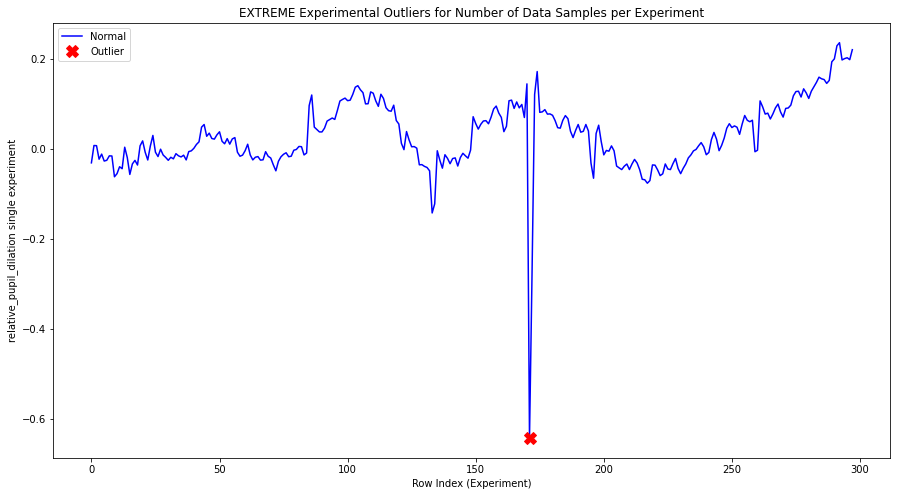



experiment index:  131


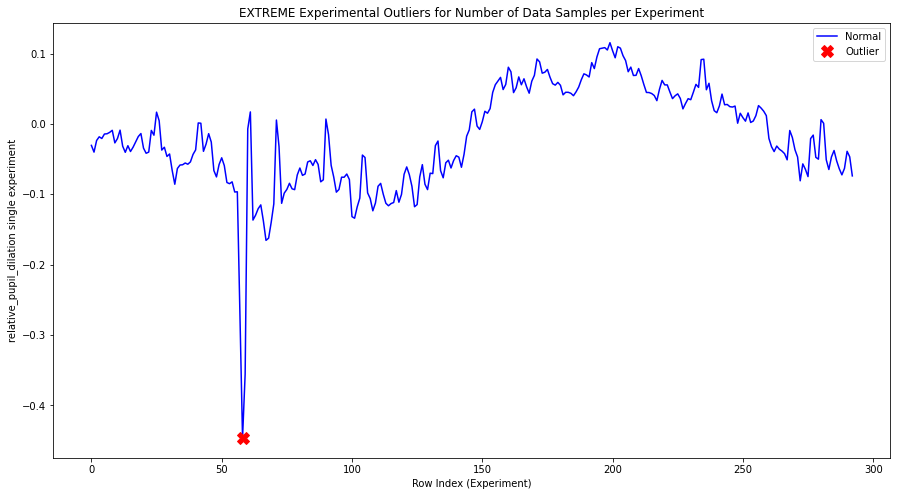



experiment index:  133


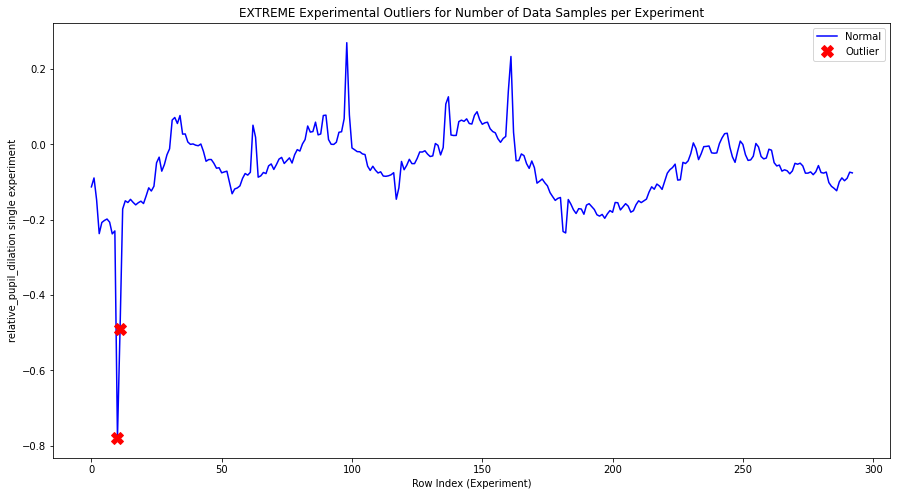



experiment index:  134


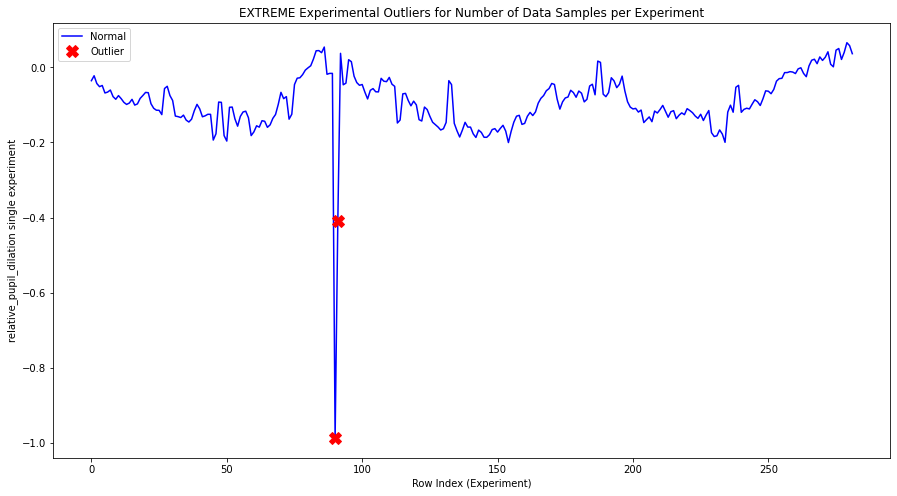



experiment index:  136


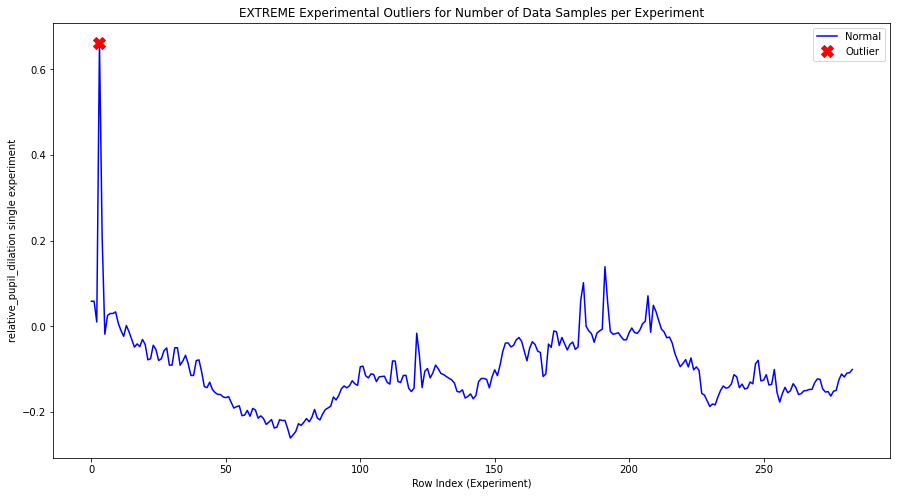



experiment index:  137


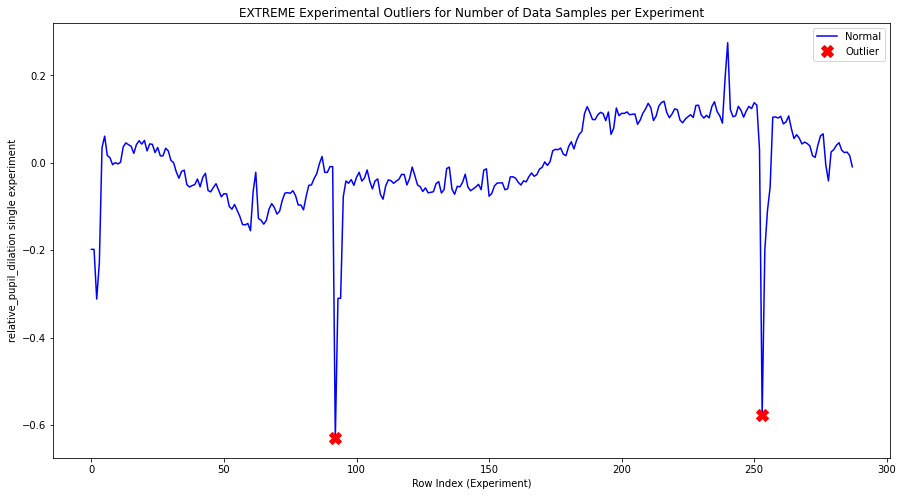



experiment index:  138


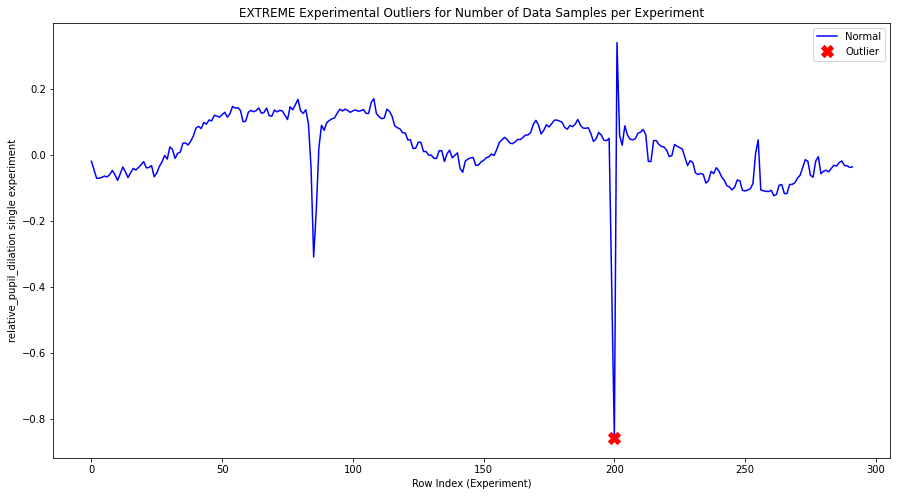



experiment index:  144


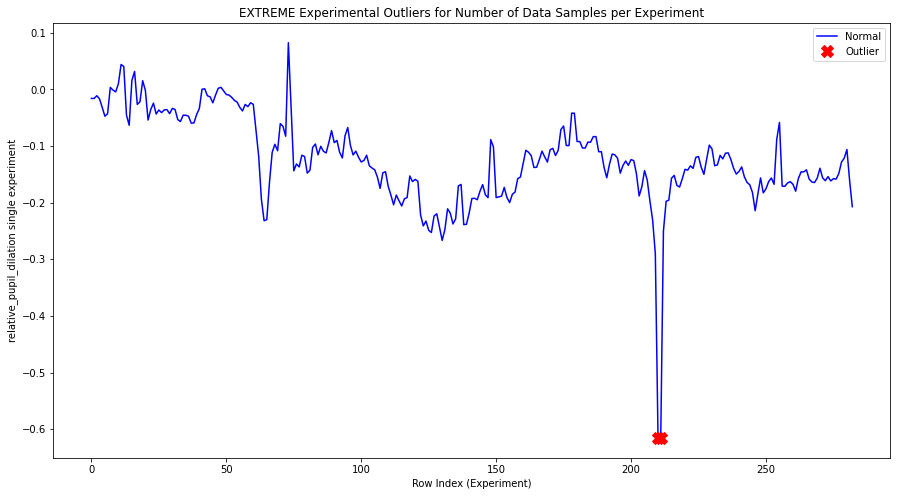



experiment index:  145


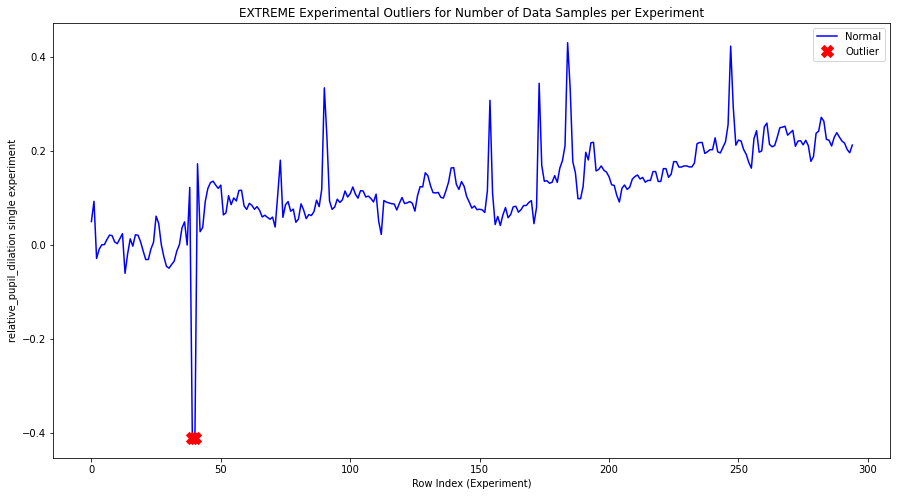



experiment index:  149


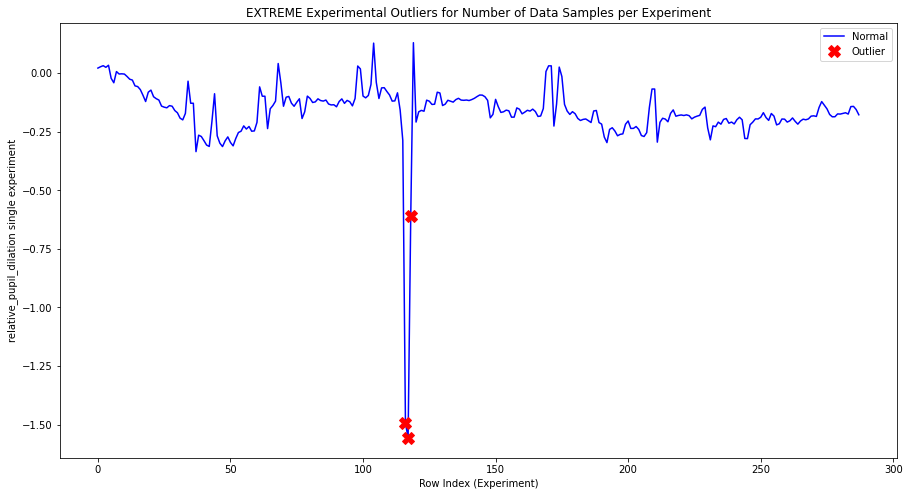



experiment index:  155


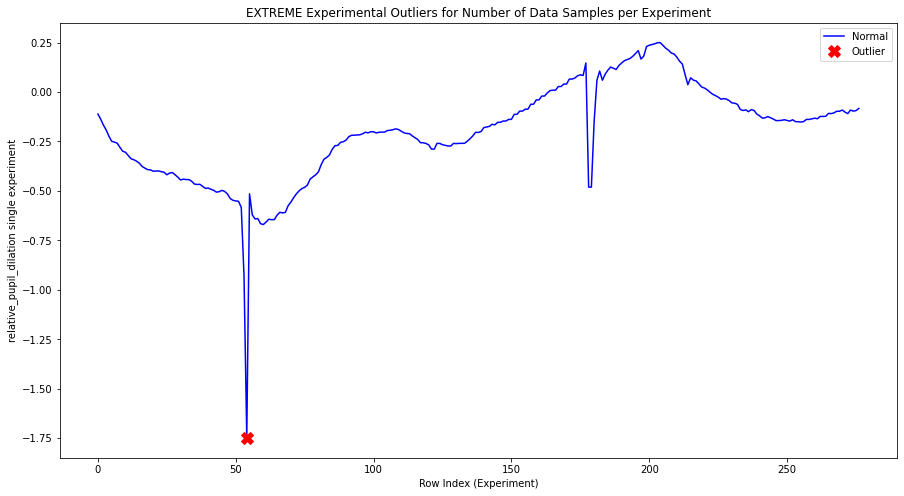



experiment index:  157


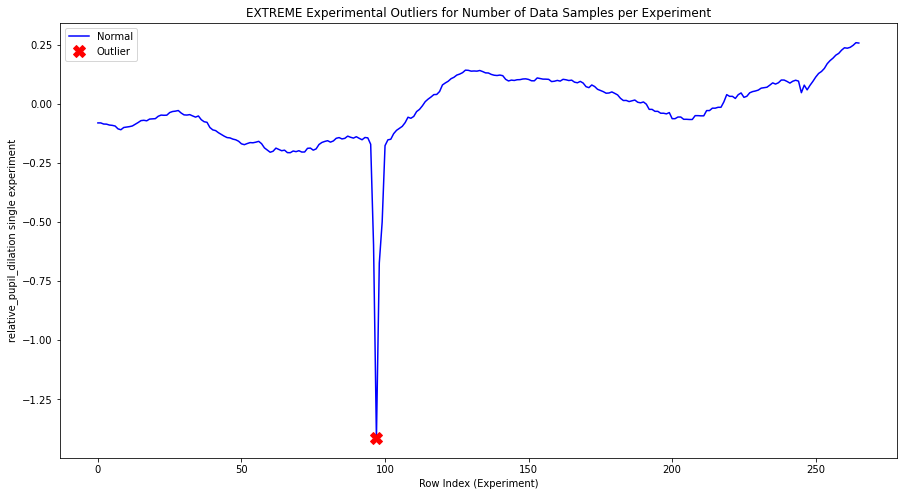



experiment index:  158


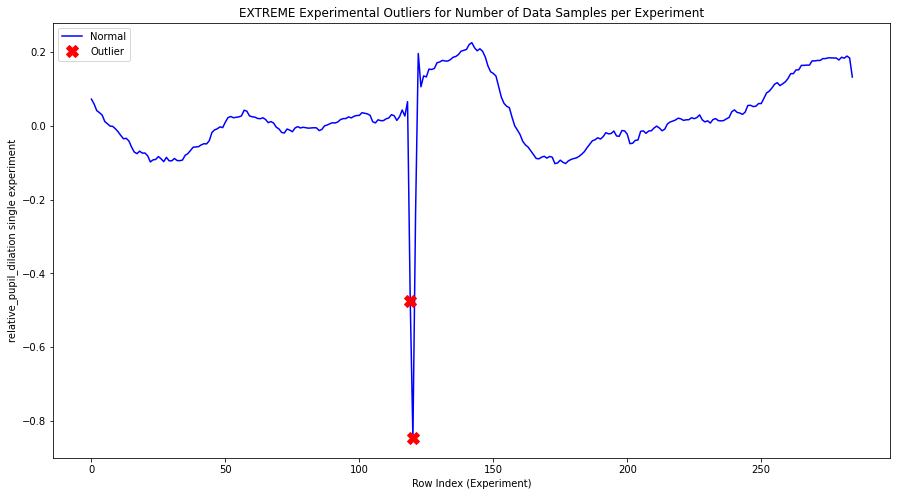



experiment index:  159


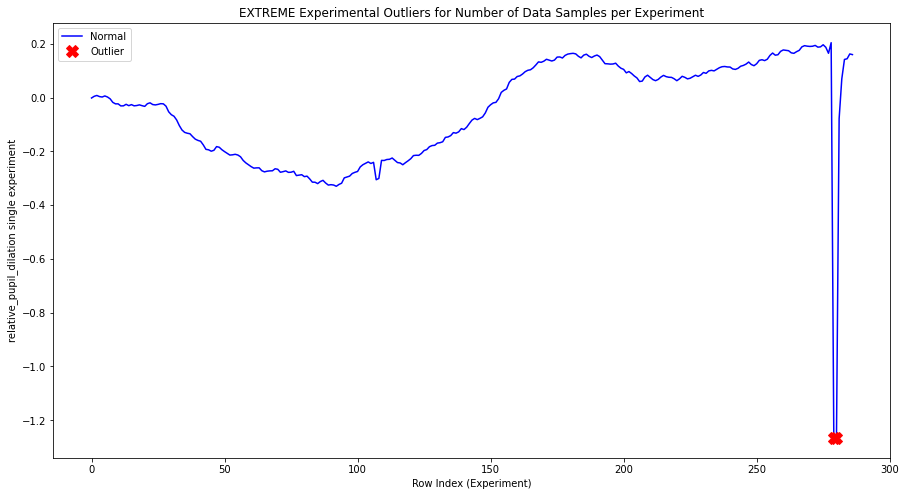



experiment index:  160


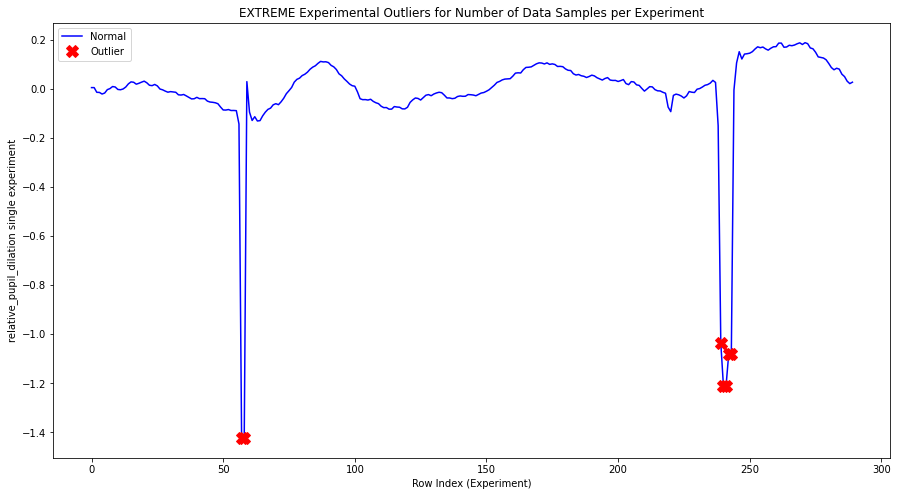



experiment index:  161


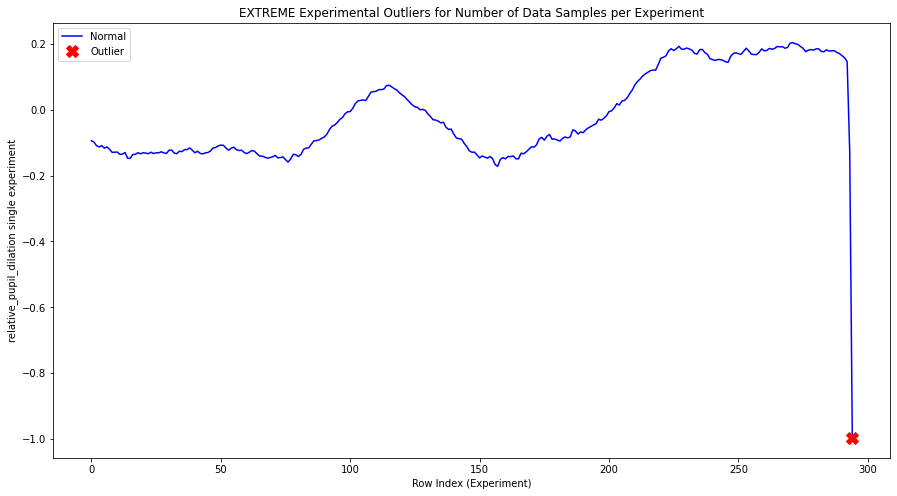



experiment index:  162


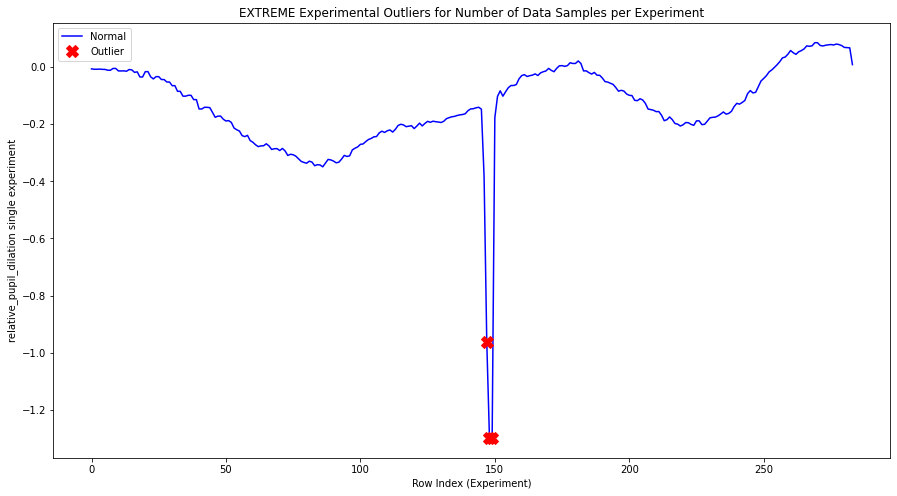



experiment index:  164


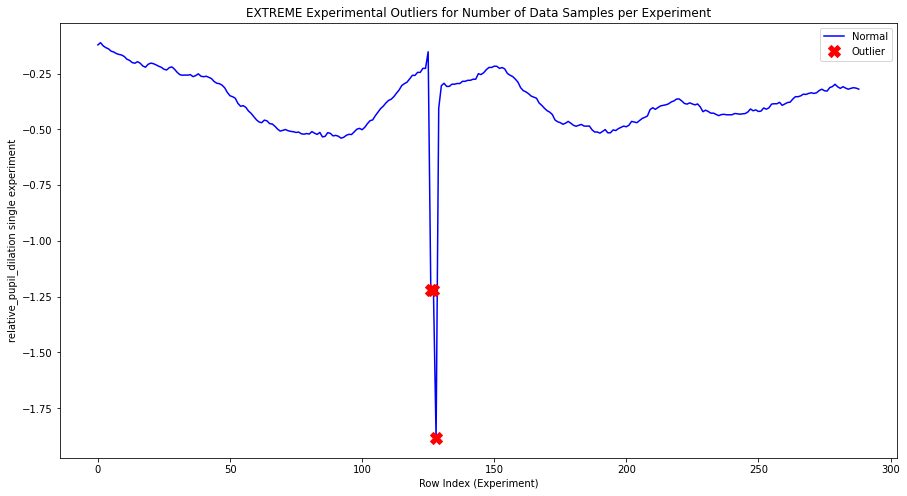



experiment index:  165


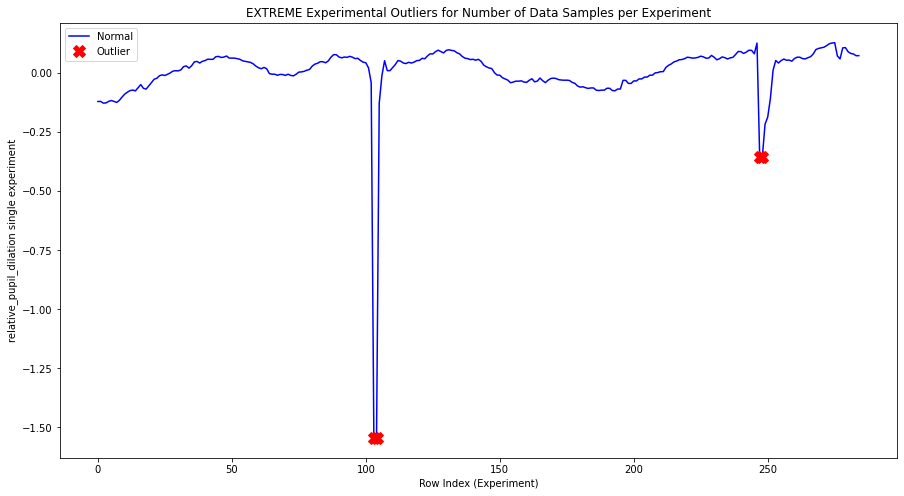



experiment index:  169


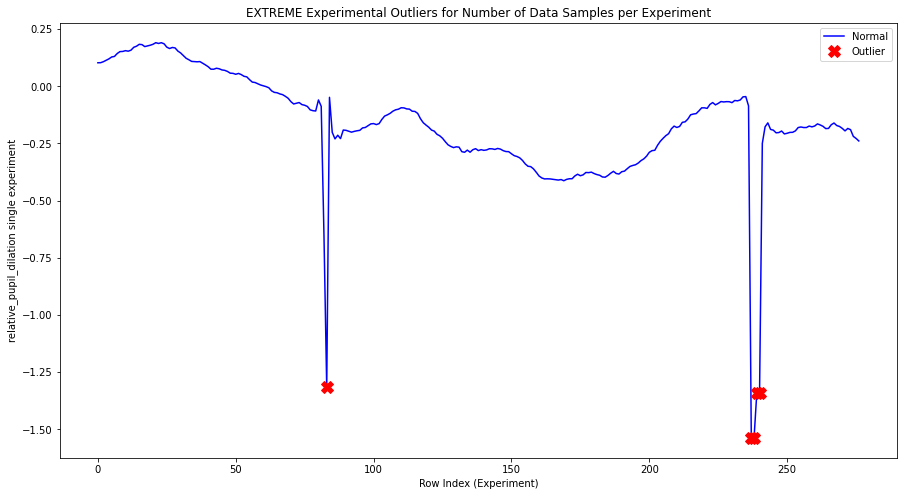



experiment index:  170


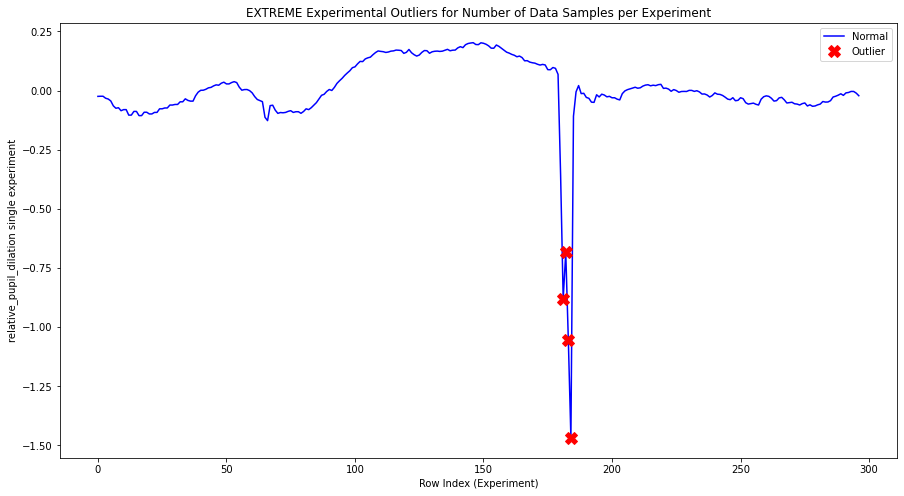



experiment index:  171


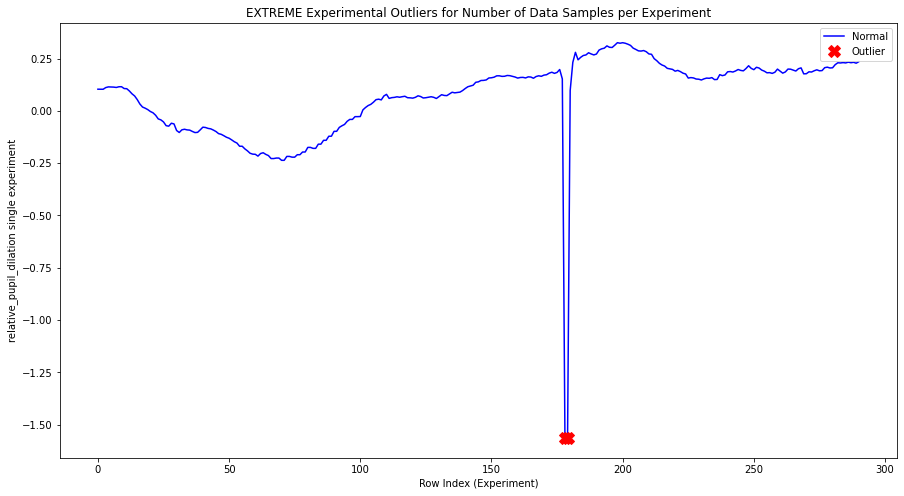



experiment index:  176


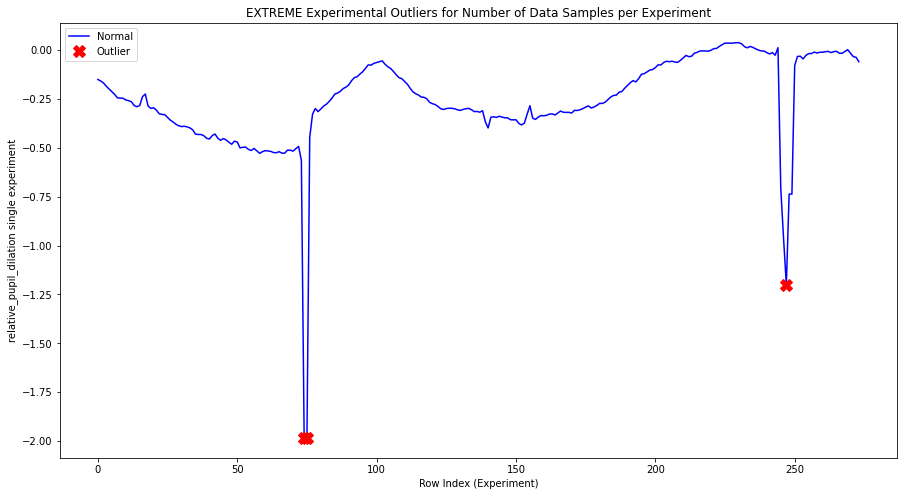



experiment index:  178


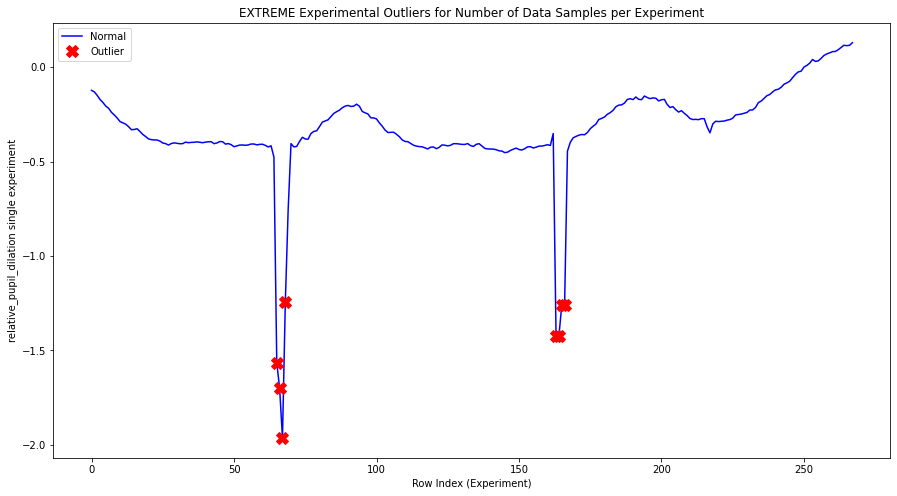



experiment index:  184


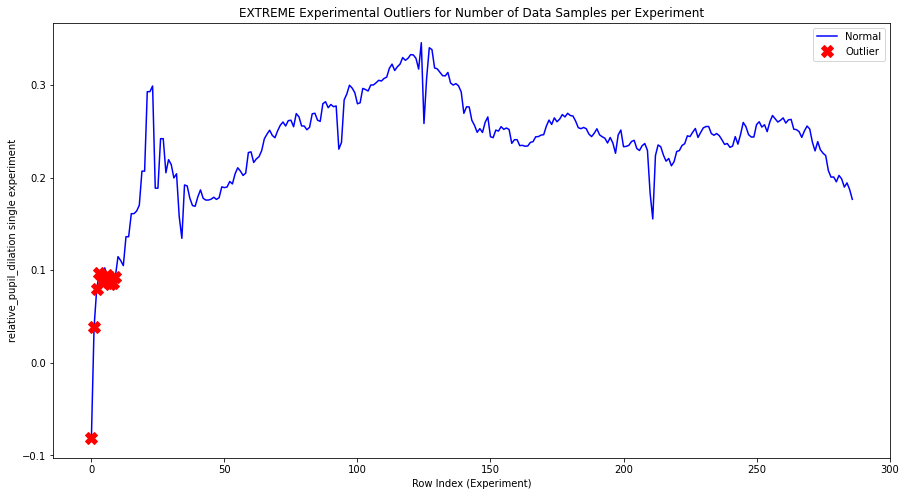



experiment index:  187


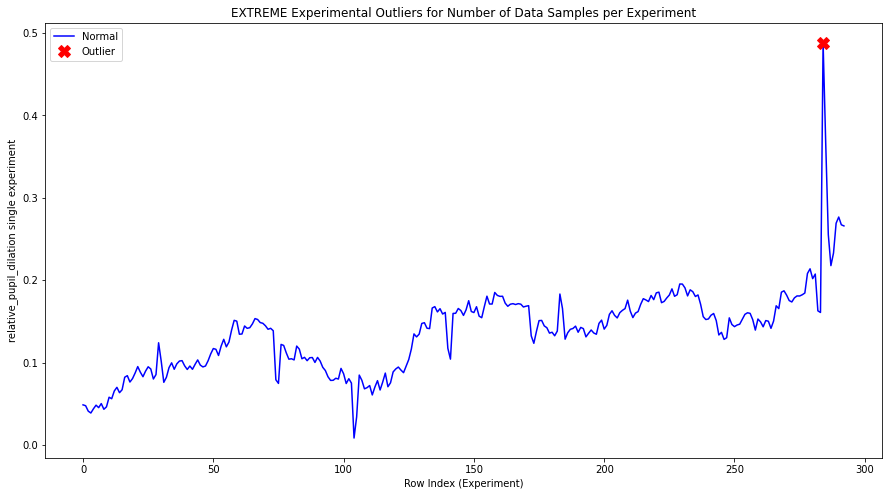



experiment index:  193


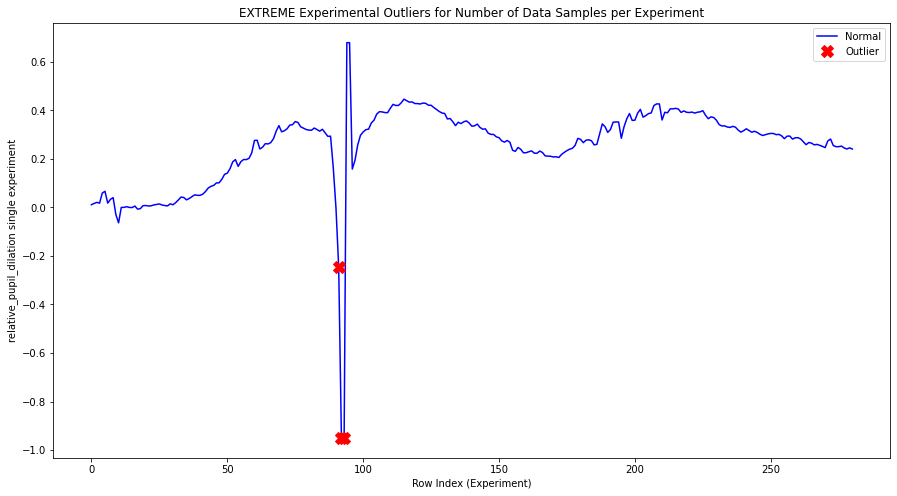



experiment index:  194


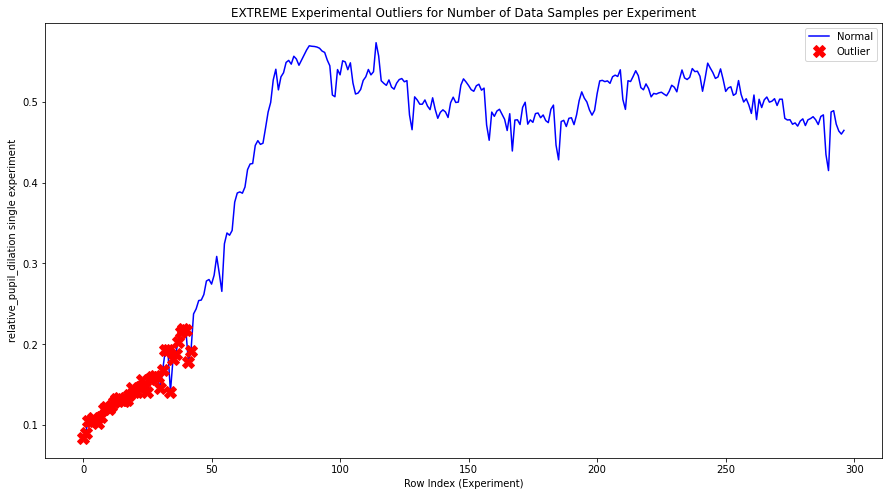



experiment index:  198


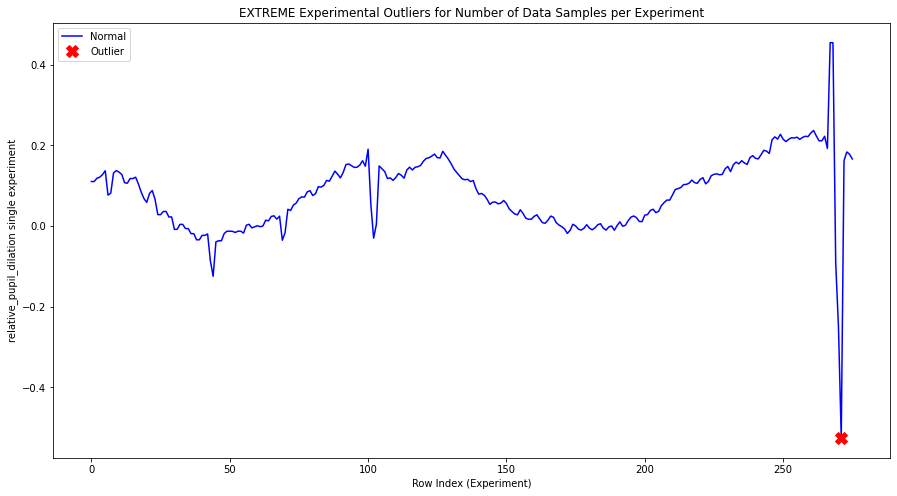



experiment index:  201


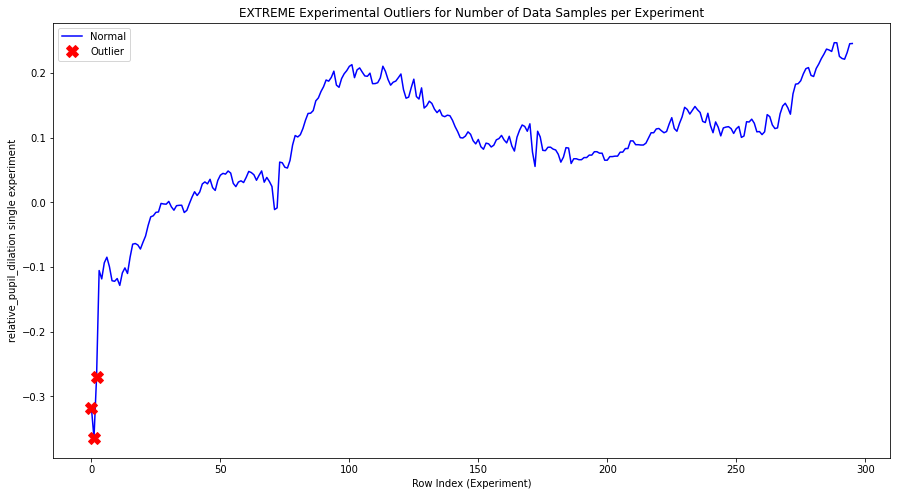



experiment index:  203


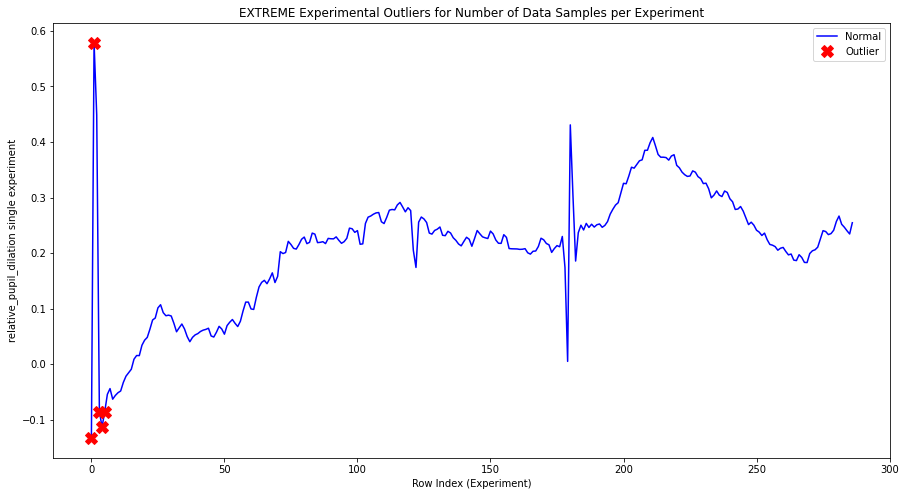



experiment index:  204


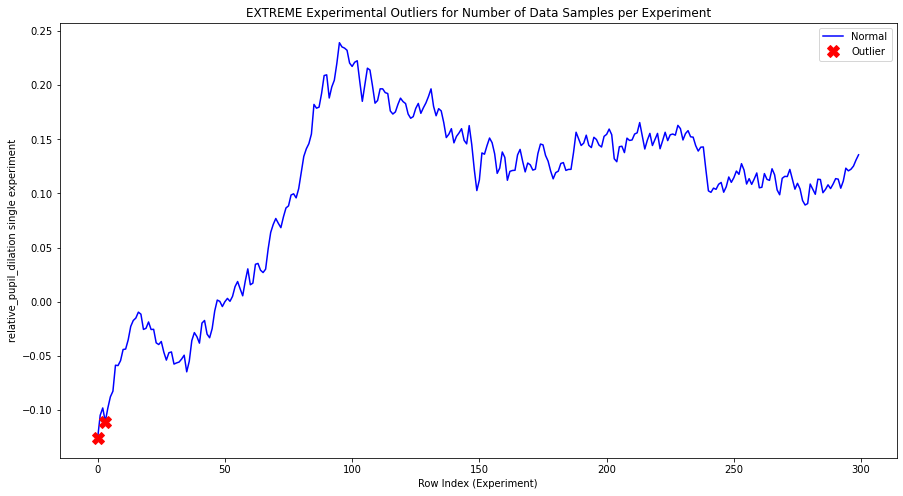



experiment index:  207


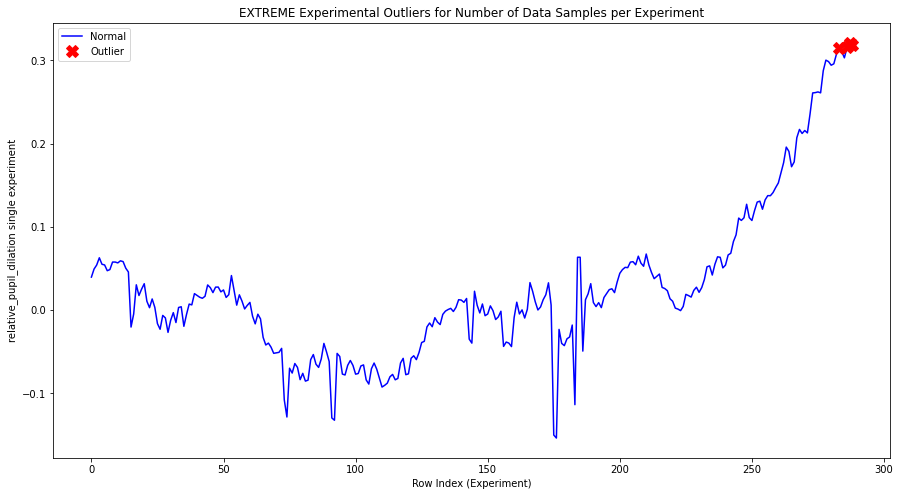



experiment index:  209


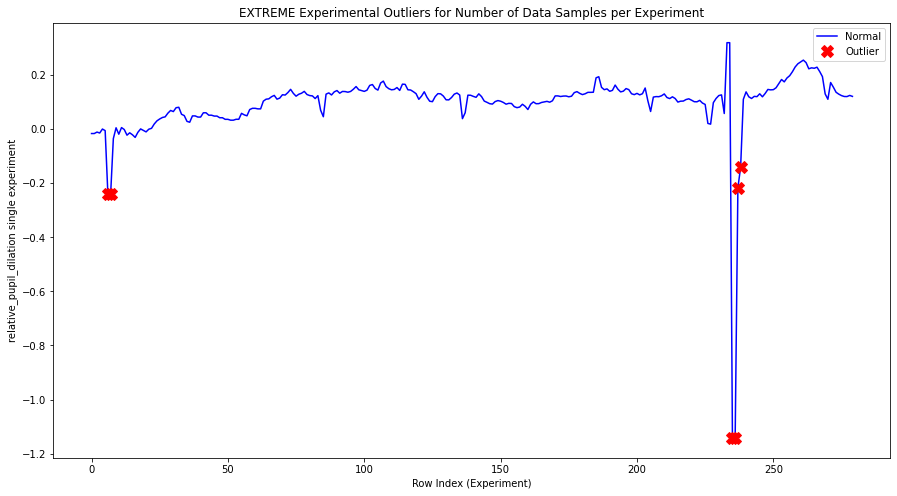



experiment index:  214


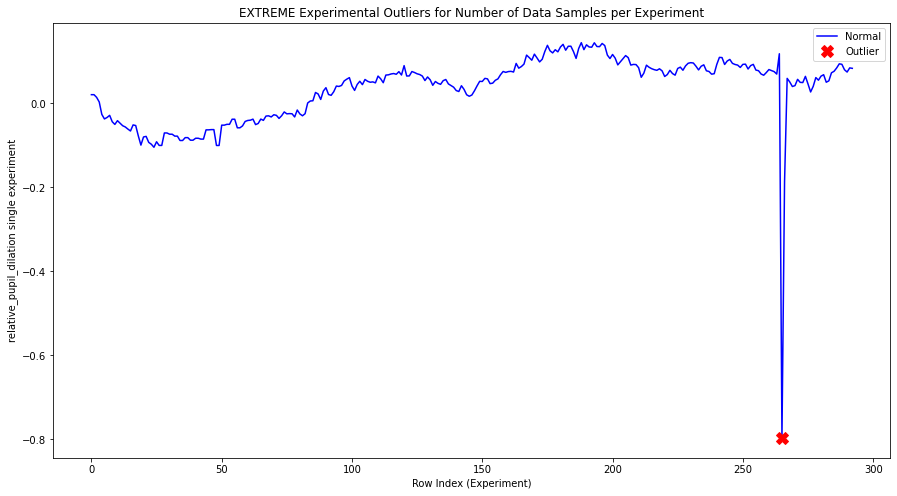



experiment index:  218


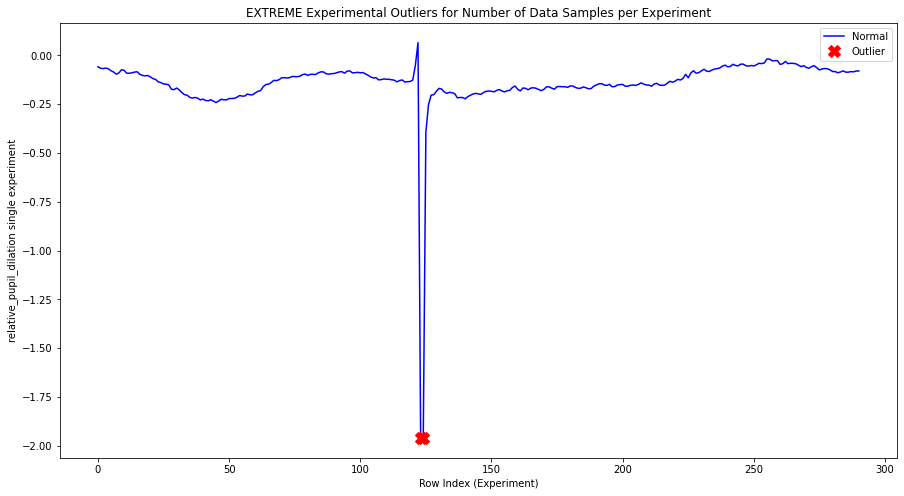



experiment index:  219


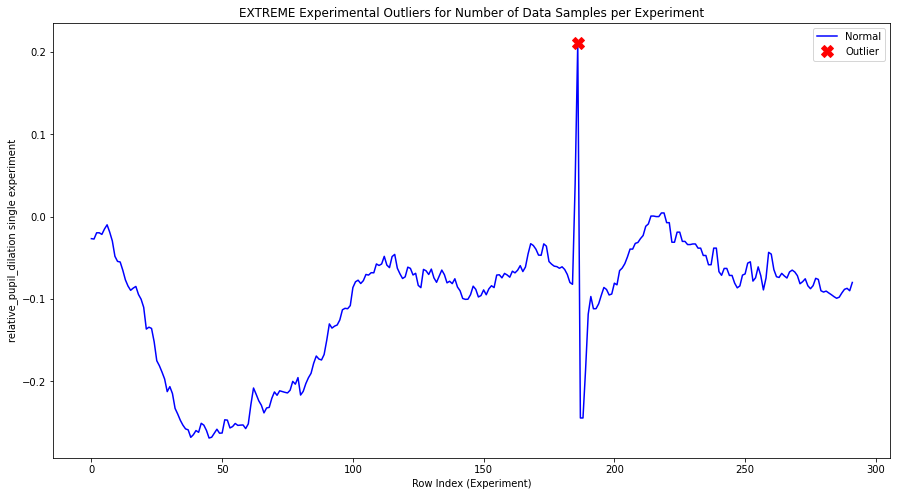



experiment index:  220


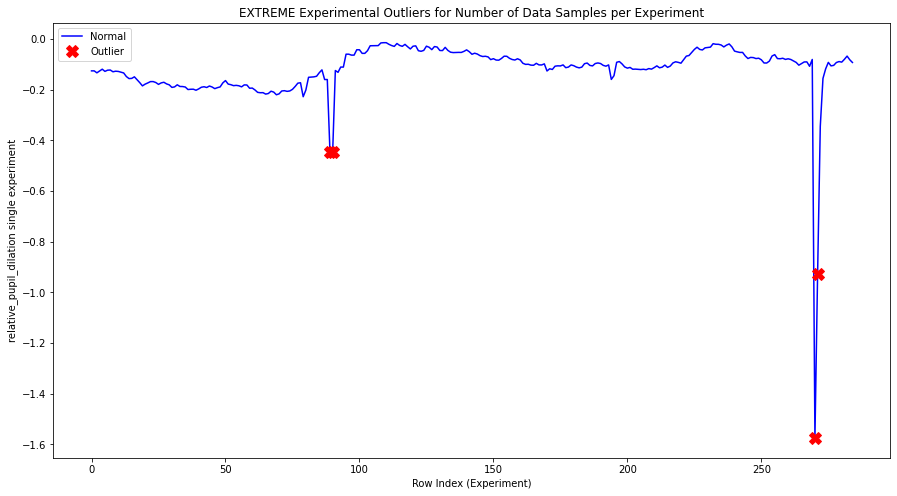



experiment index:  221


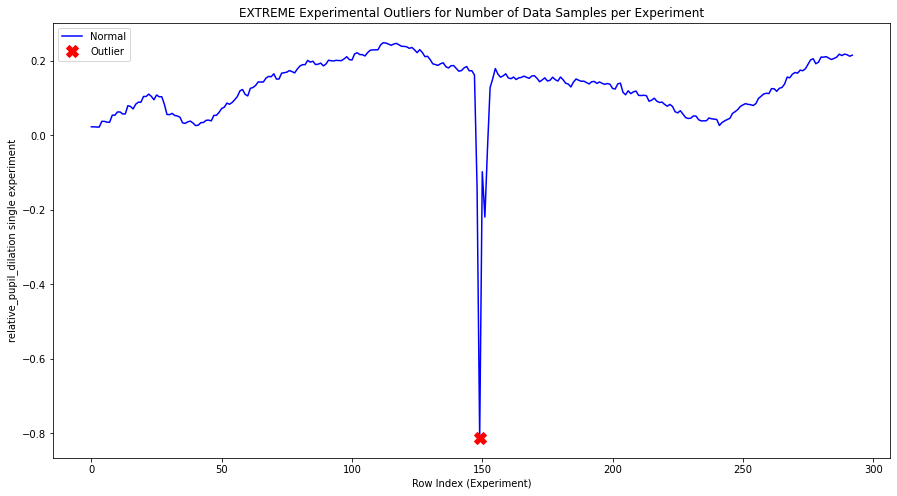



experiment index:  222


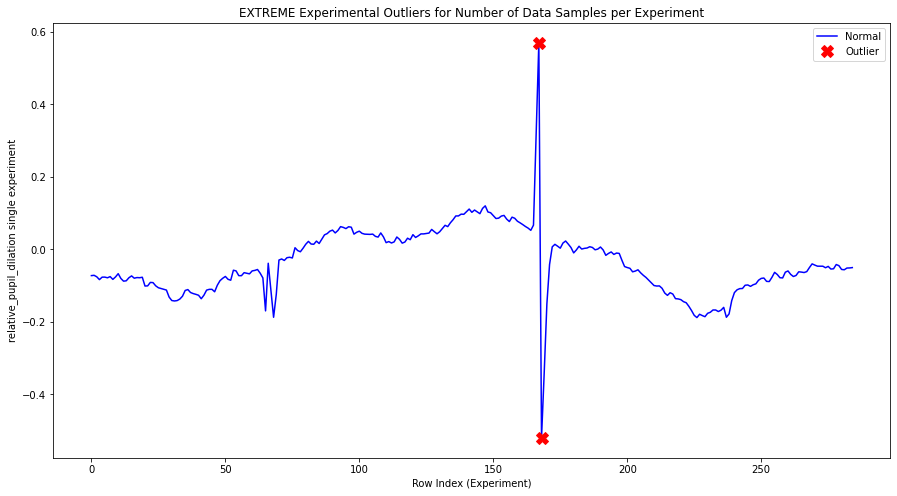



experiment index:  223


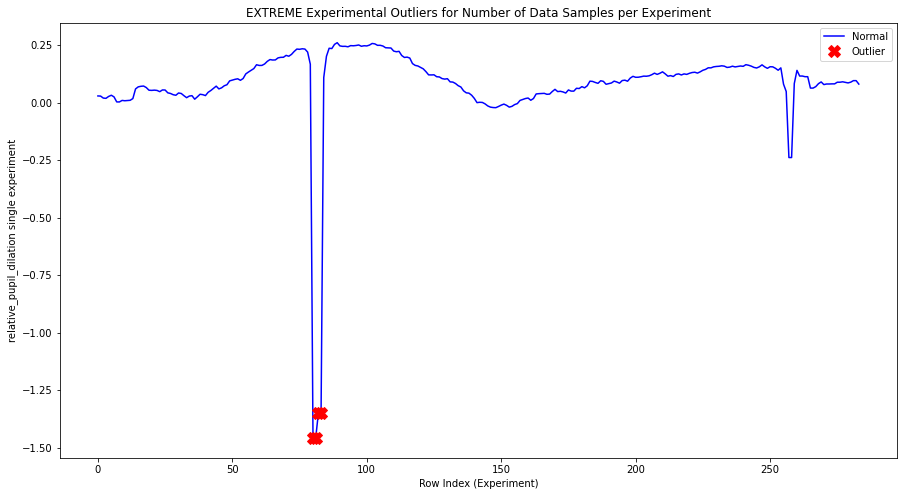



experiment index:  224


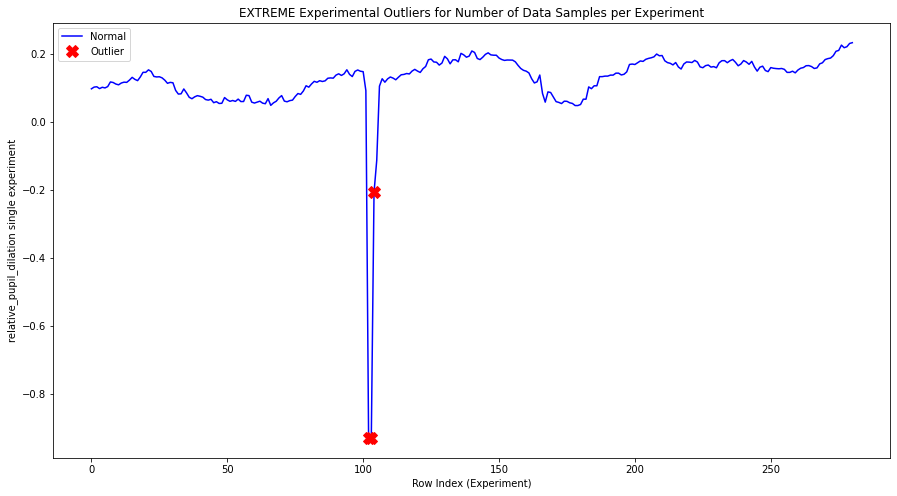



experiment index:  225


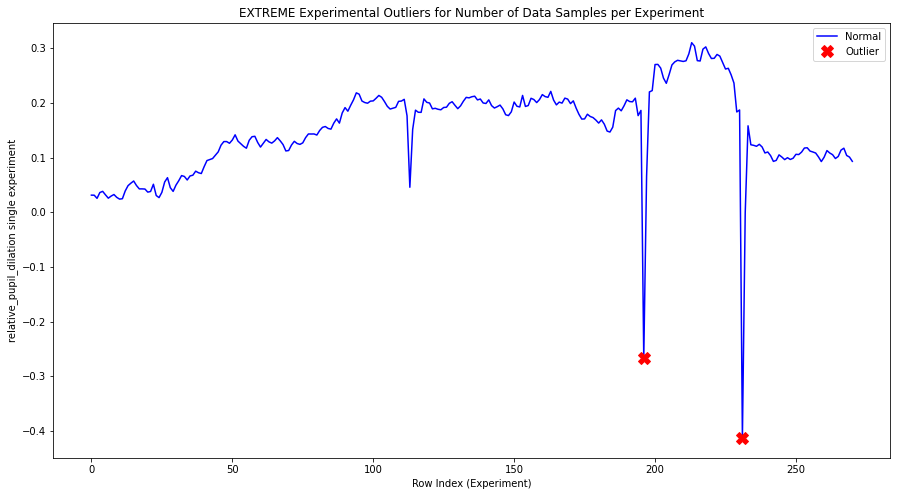



experiment index:  226


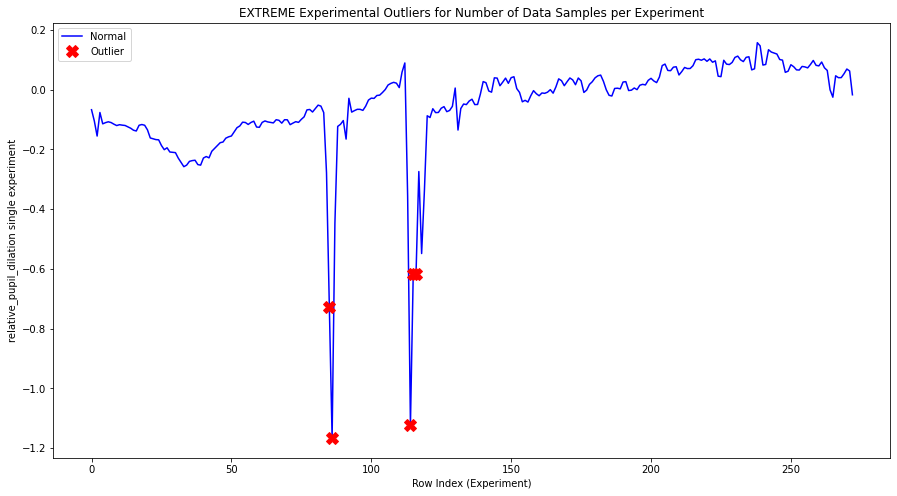



experiment index:  228


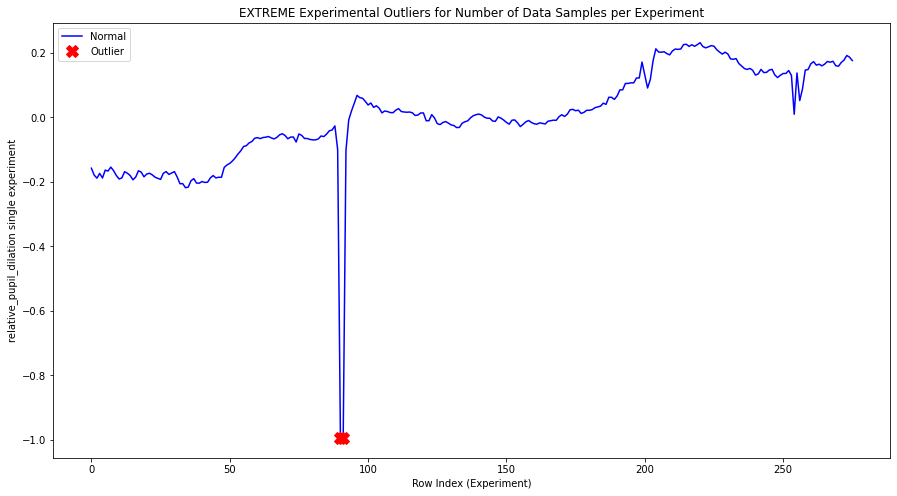



experiment index:  229


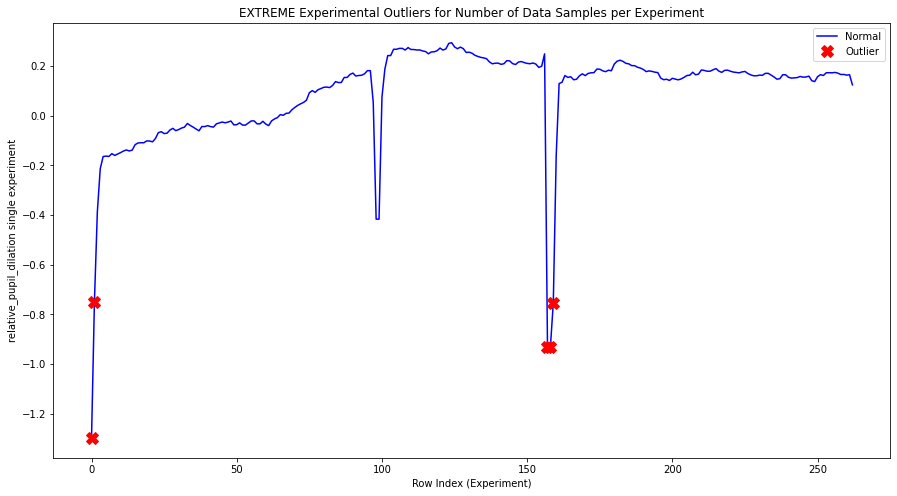



experiment index:  230


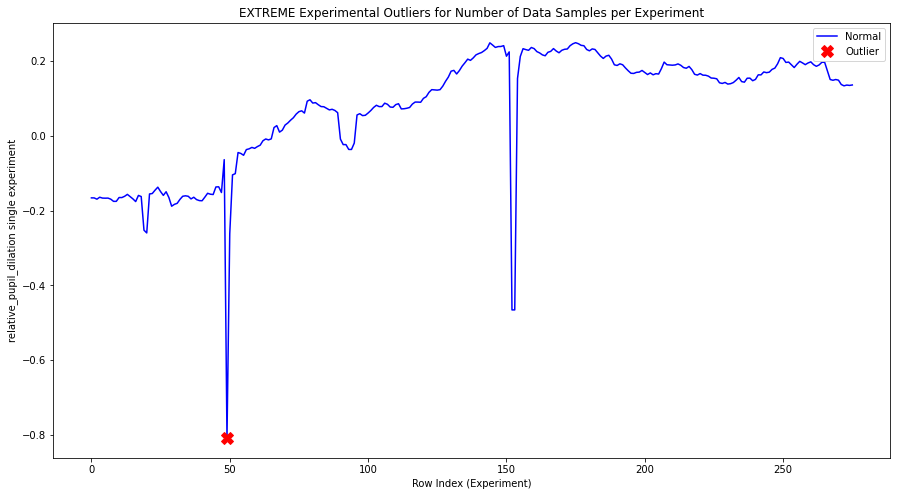



experiment index:  231


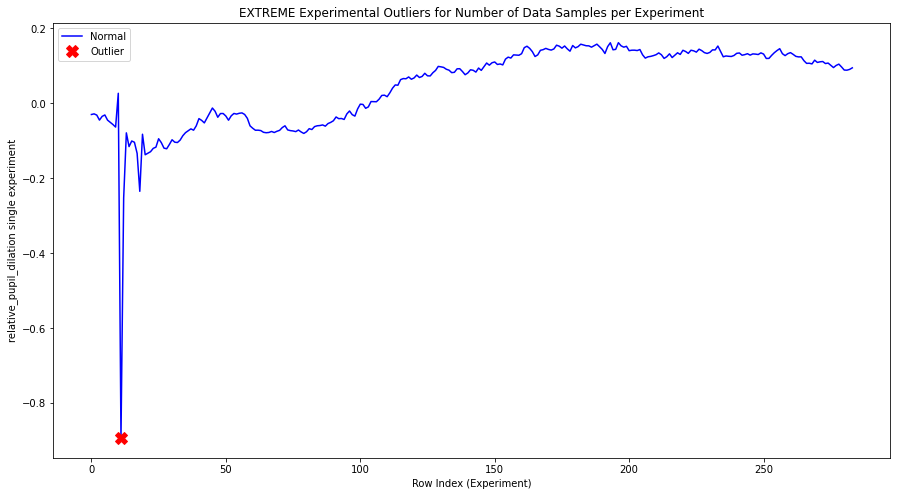



experiment index:  232


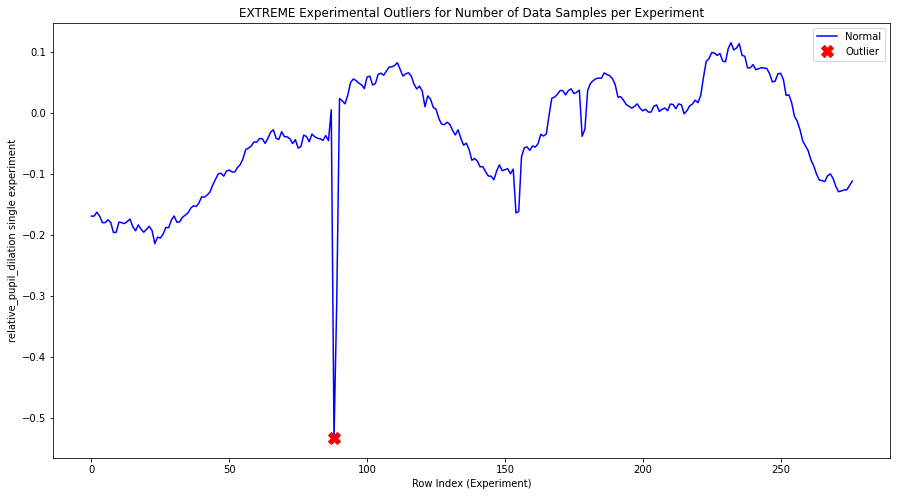



experiment index:  234


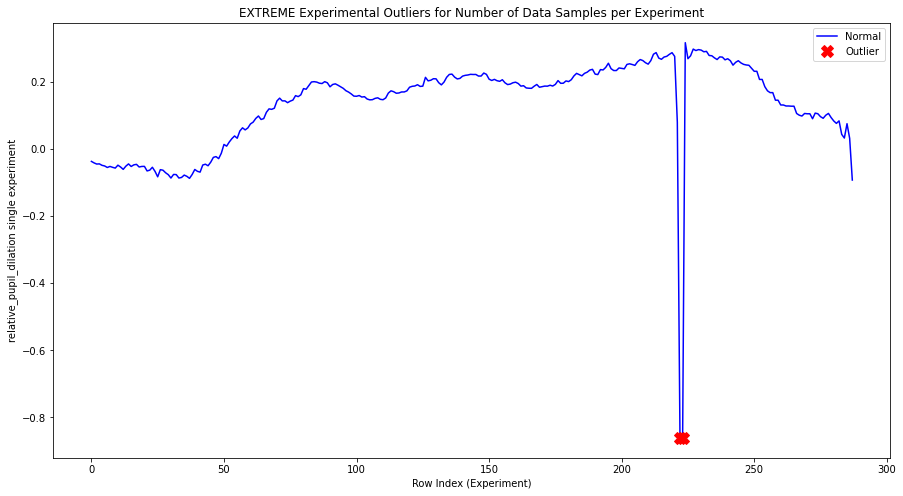



experiment index:  235


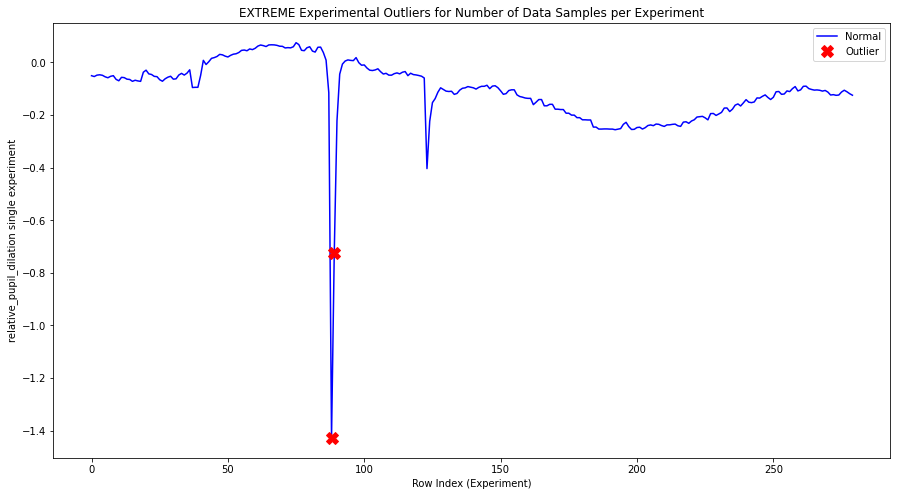



experiment index:  237


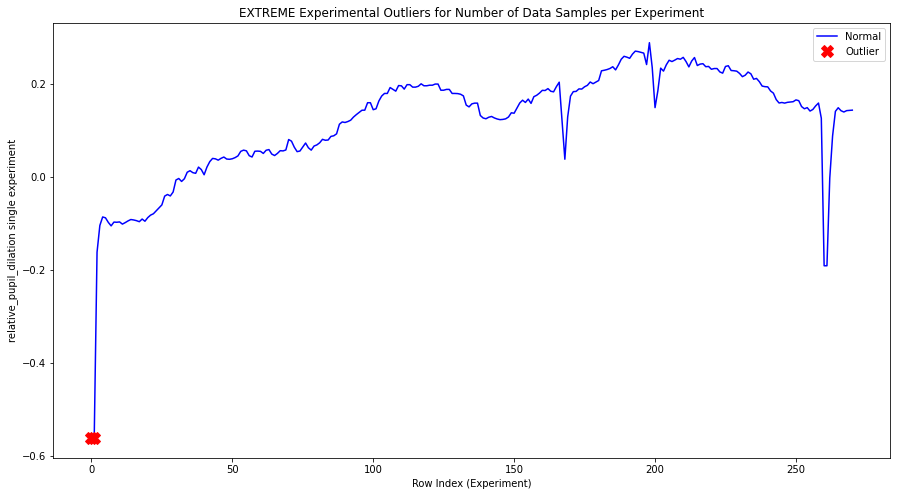



experiment index:  239


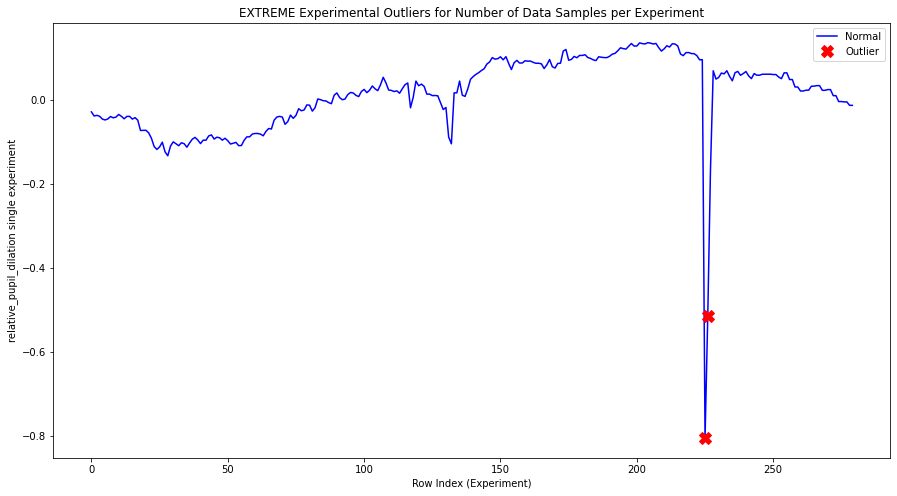



experiment index:  242


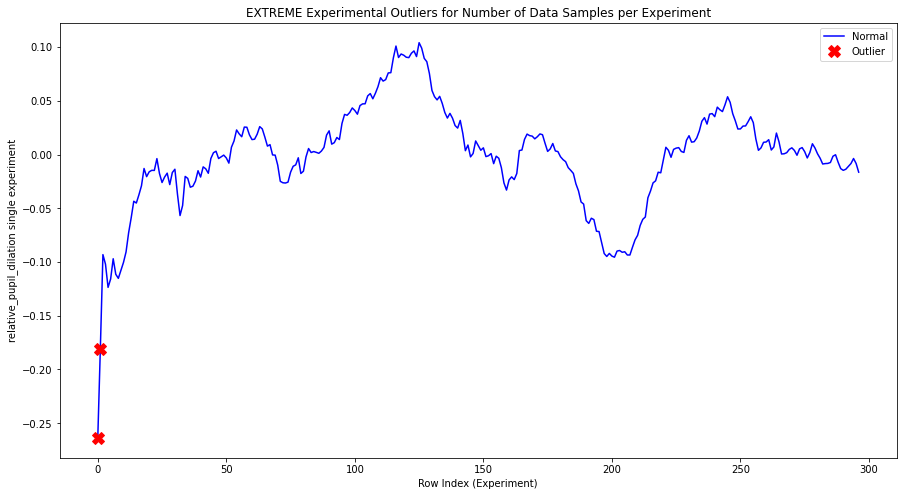



experiment index:  259


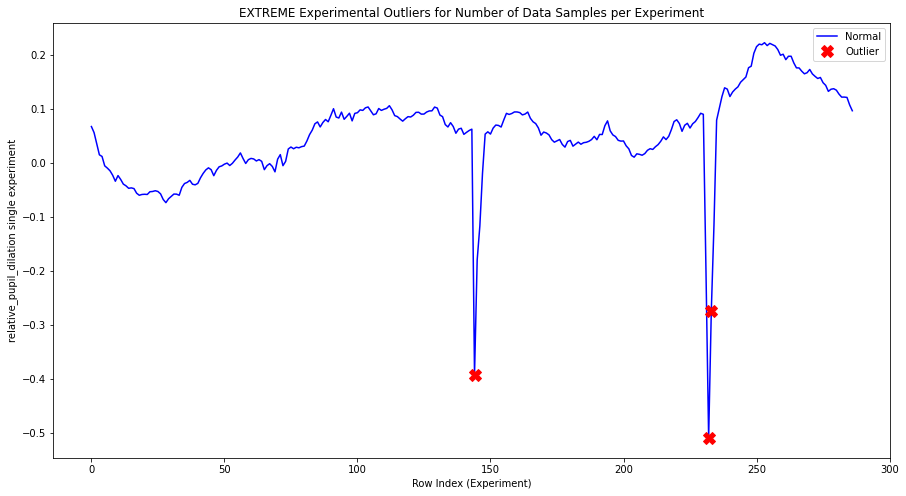



experiment index:  263


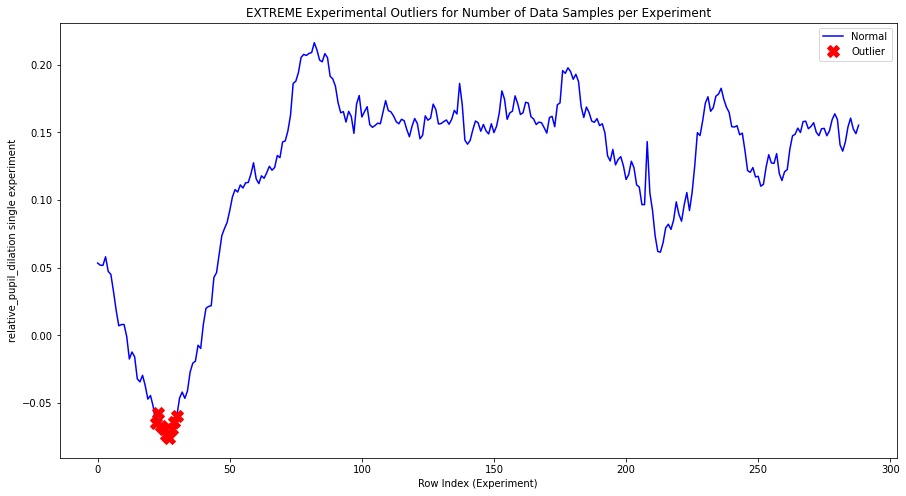



experiment index:  266


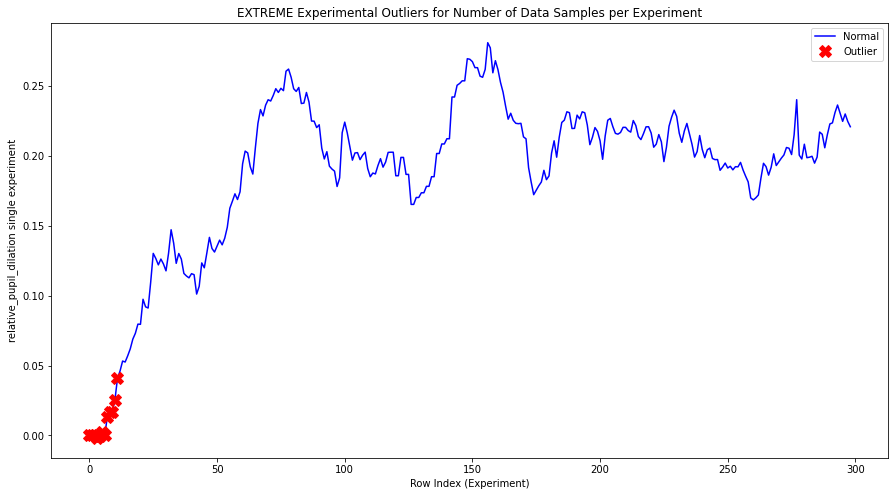



experiment index:  270


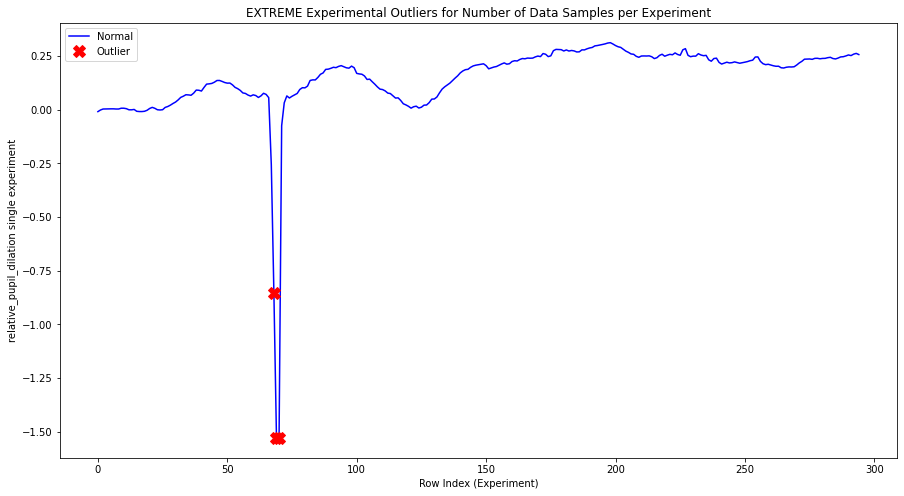



experiment index:  274


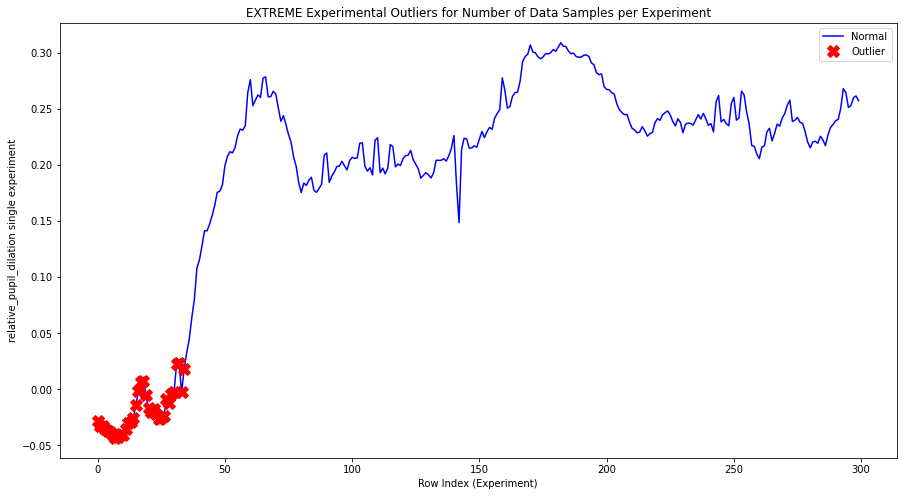



experiment index:  280


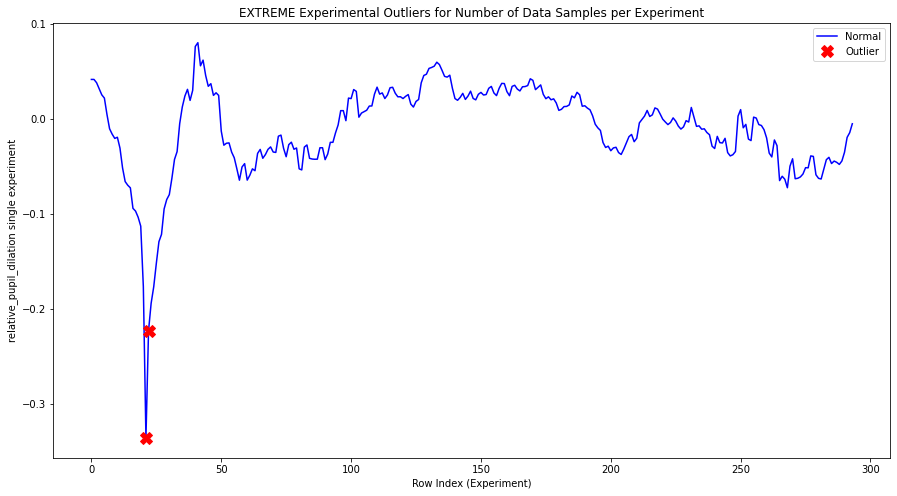



experiment index:  283


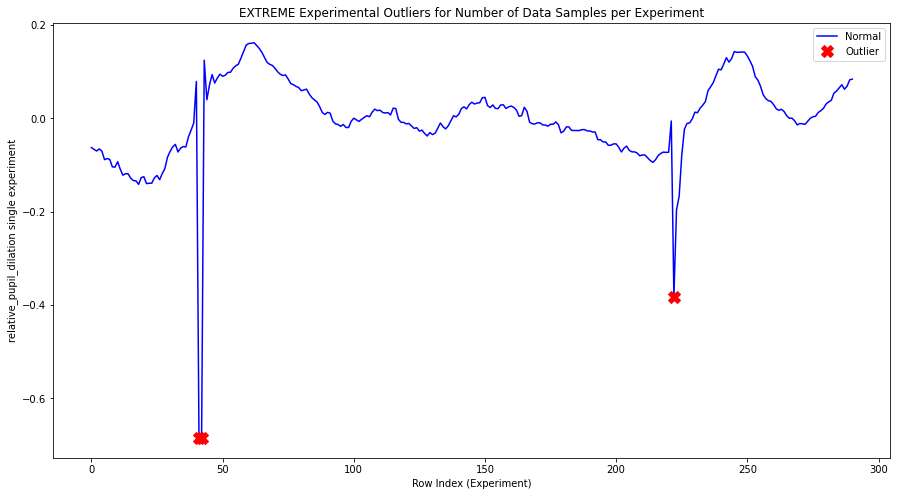



experiment index:  287


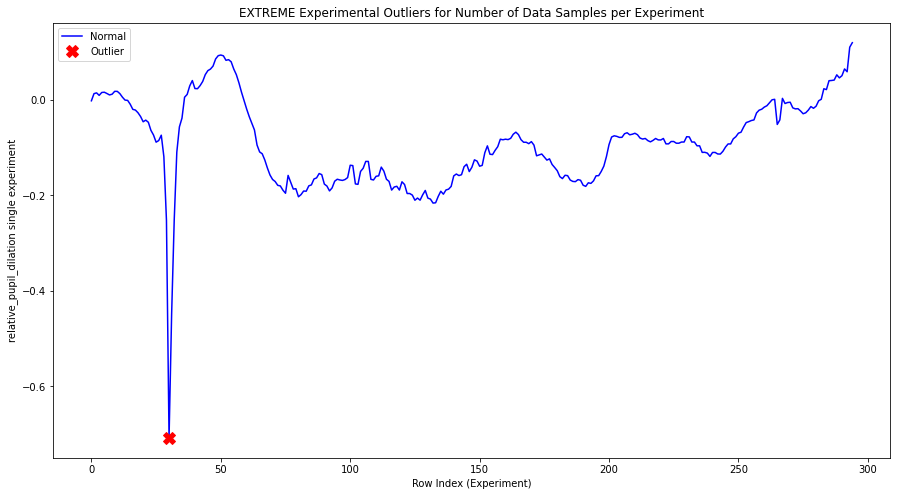



experiment index:  300


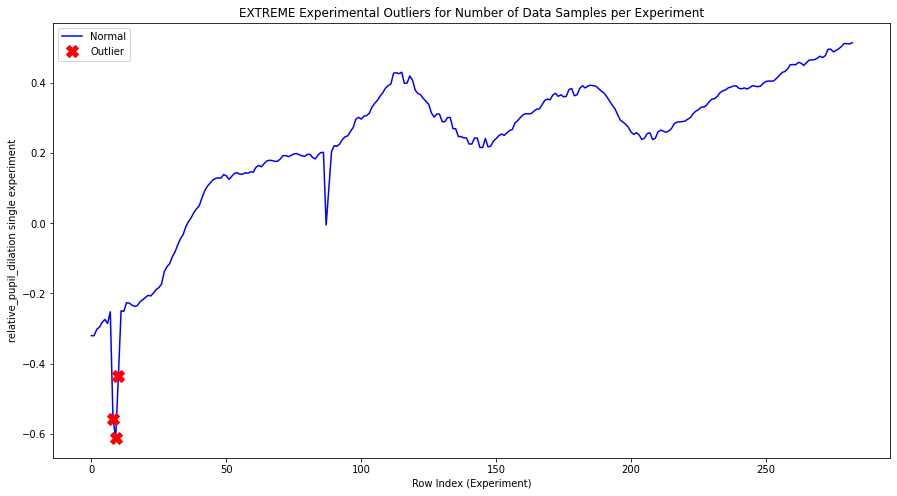



experiment index:  301


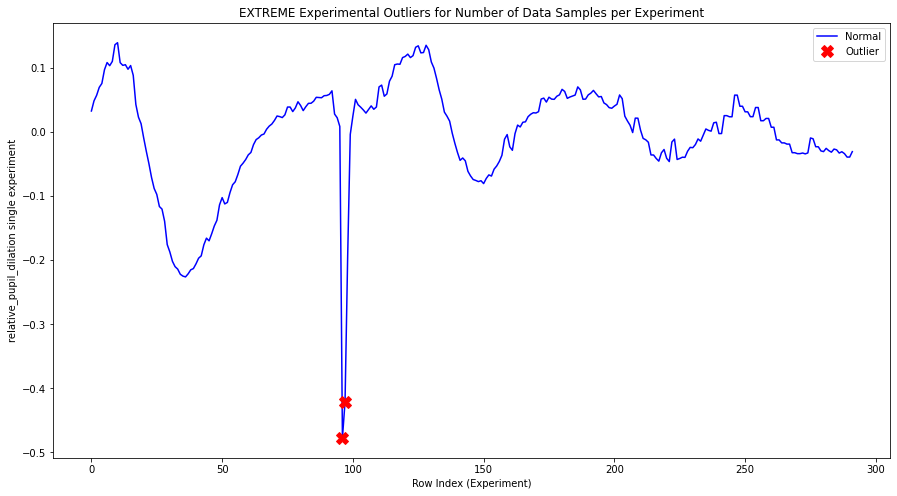



experiment index:  305


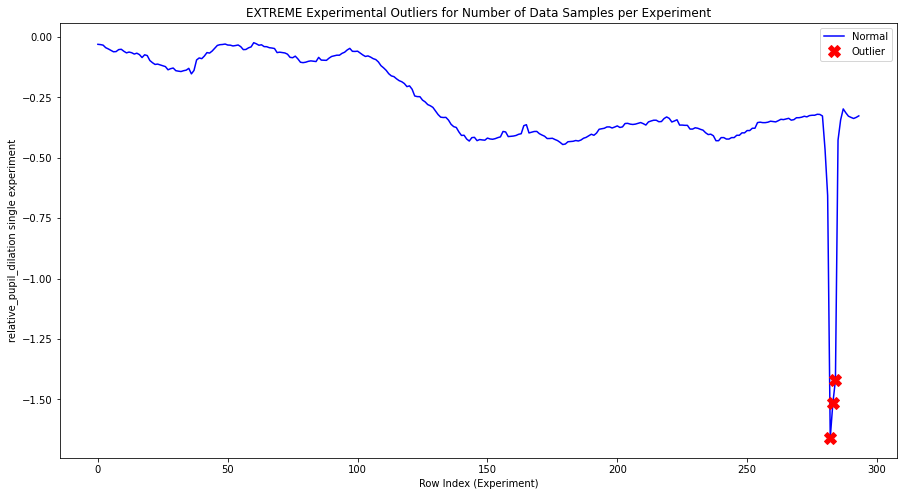



experiment index:  309


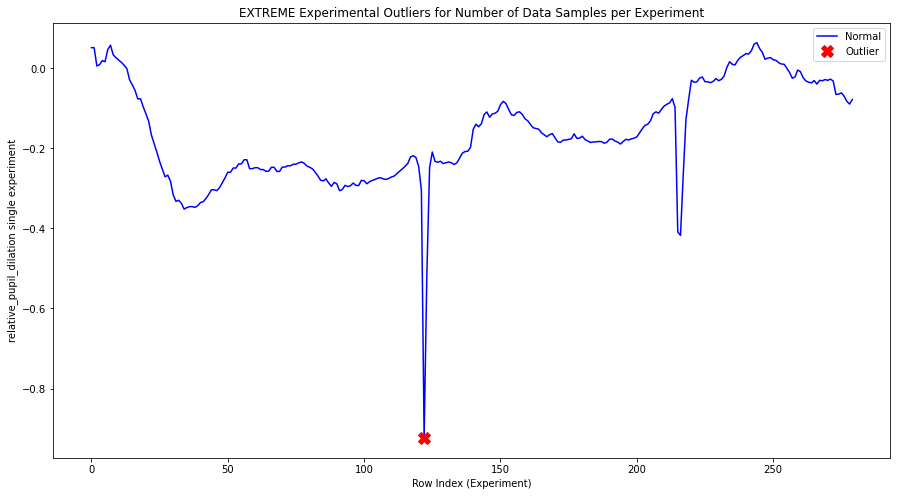



experiment index:  310


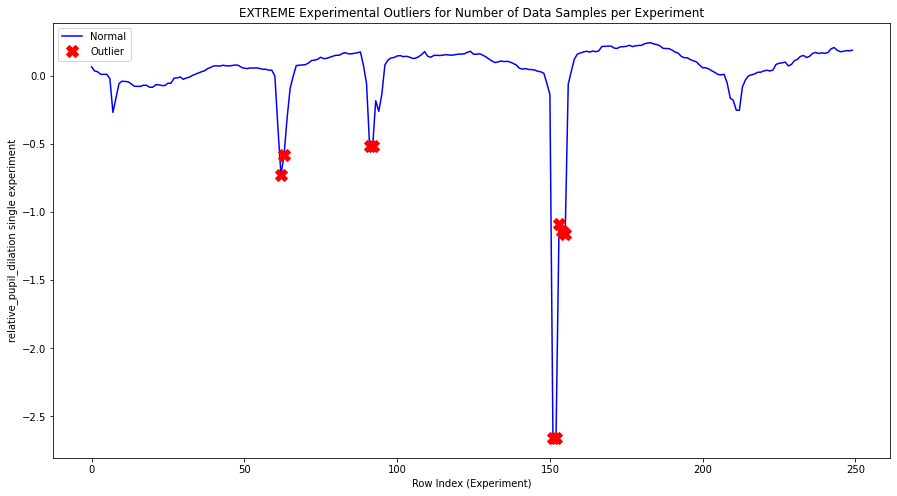



experiment index:  311


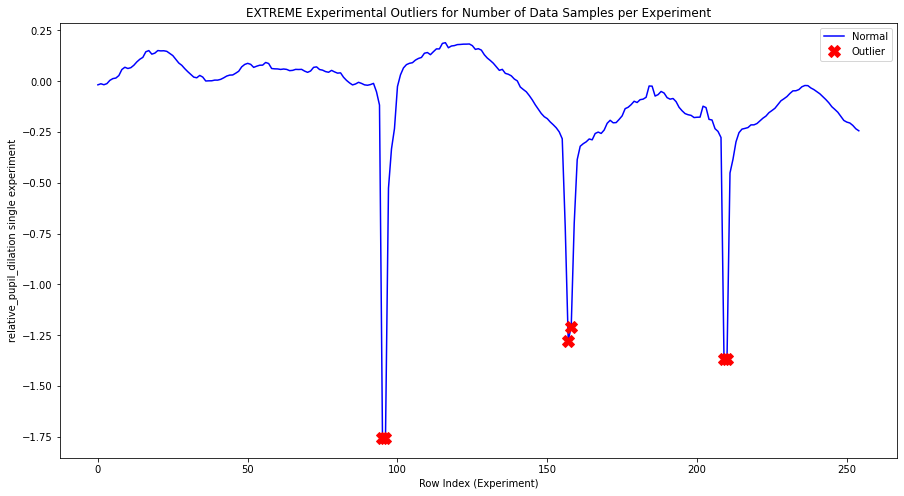



experiment index:  313


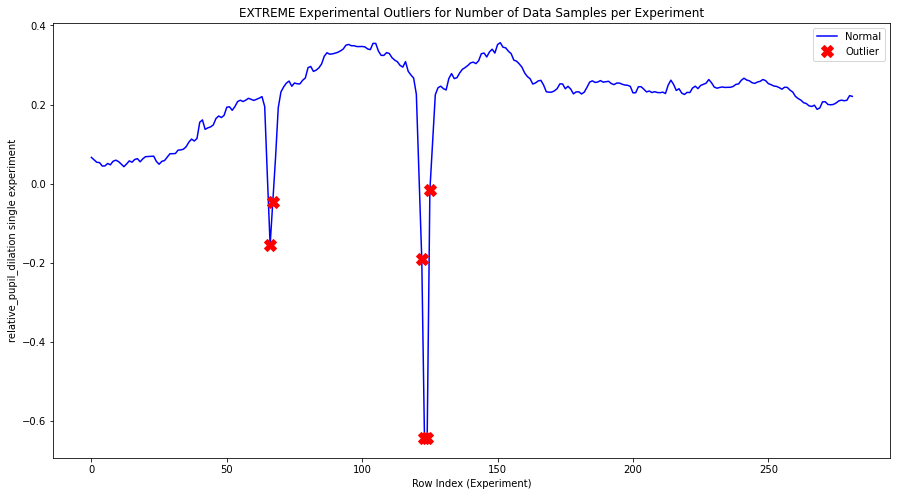



experiment index:  317


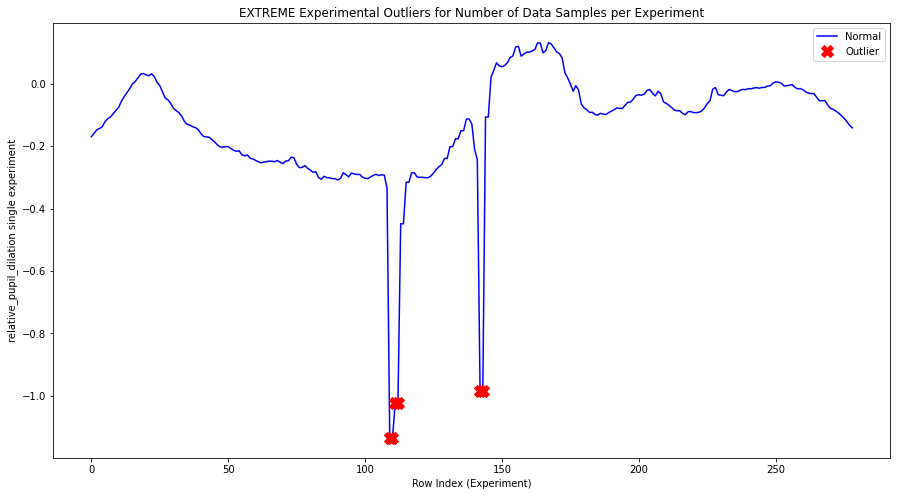



experiment index:  318


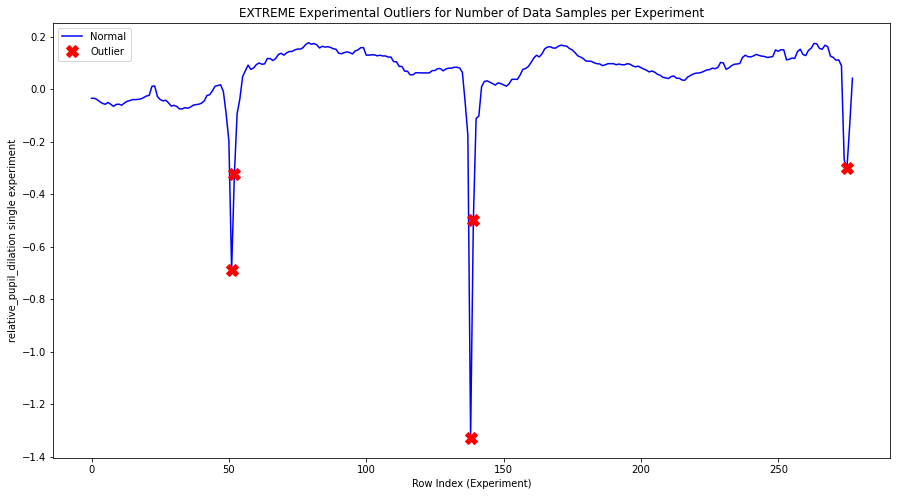



experiment index:  320


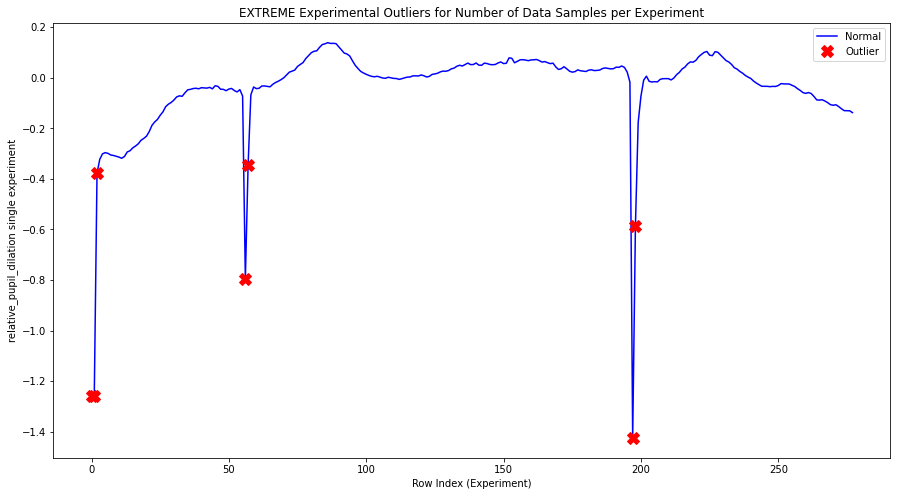



experiment index:  322


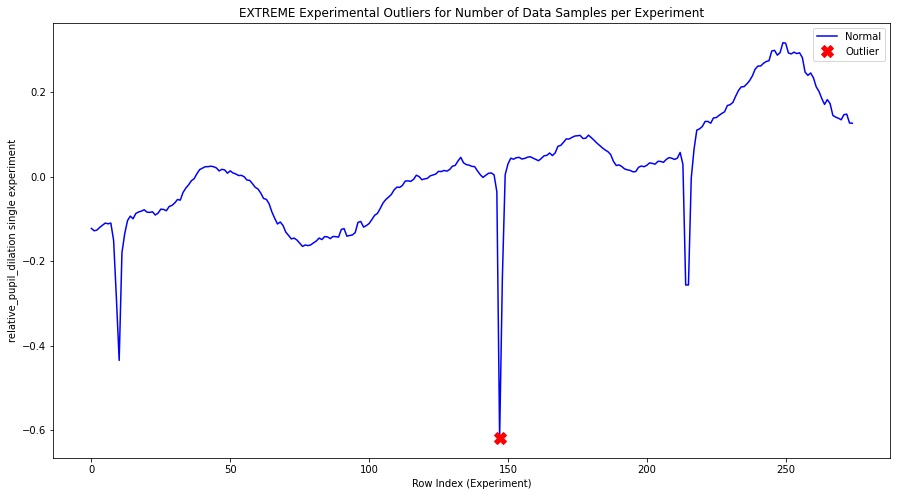



experiment index:  323


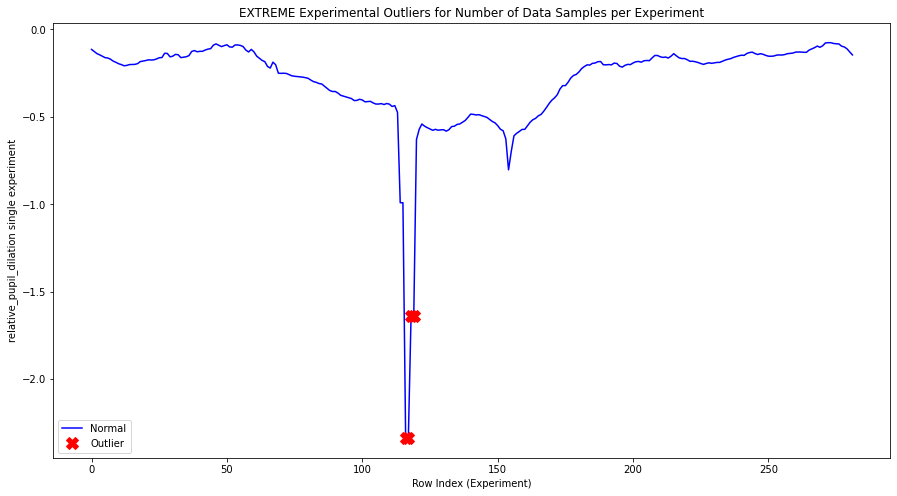



experiment index:  324


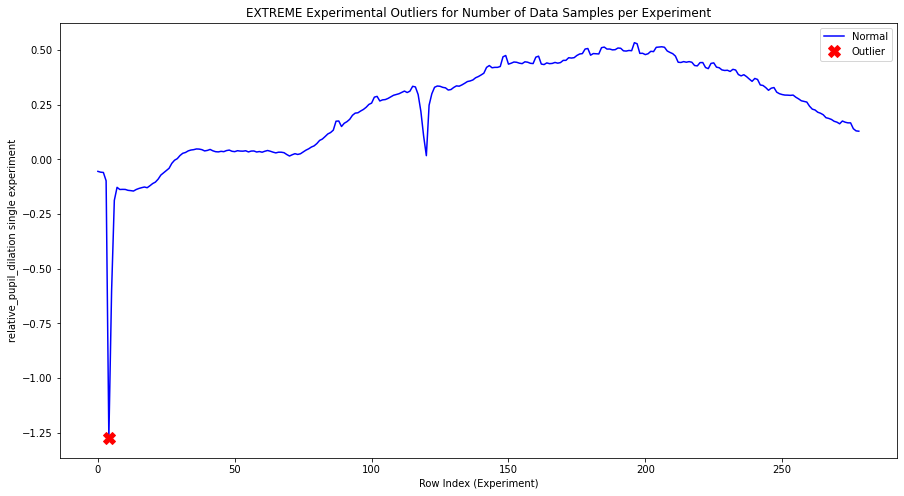



experiment index:  327


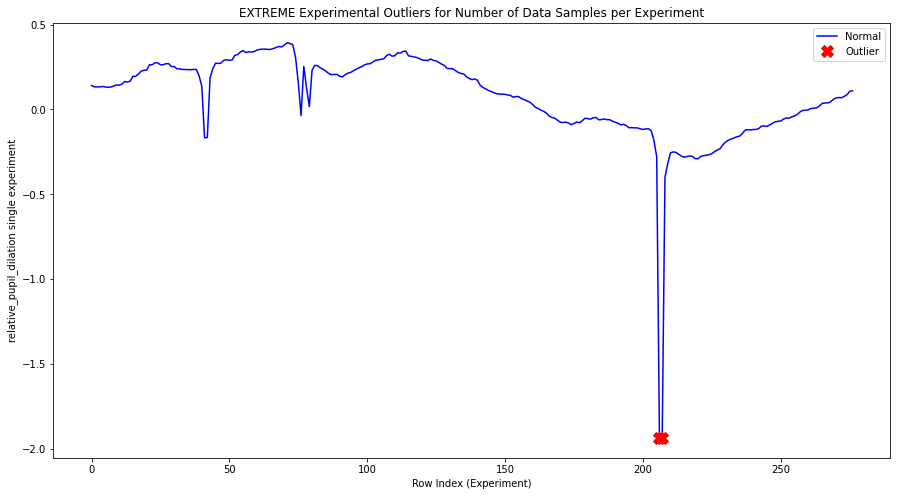



experiment index:  328


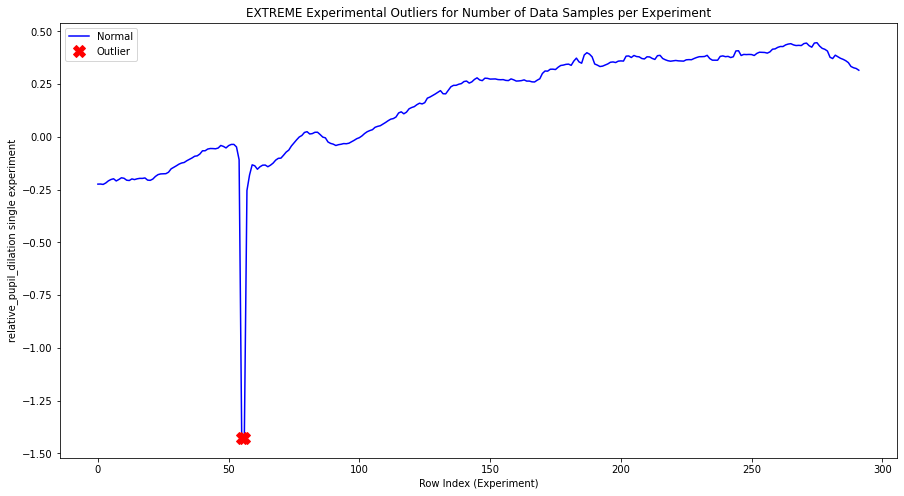



experiment index:  333


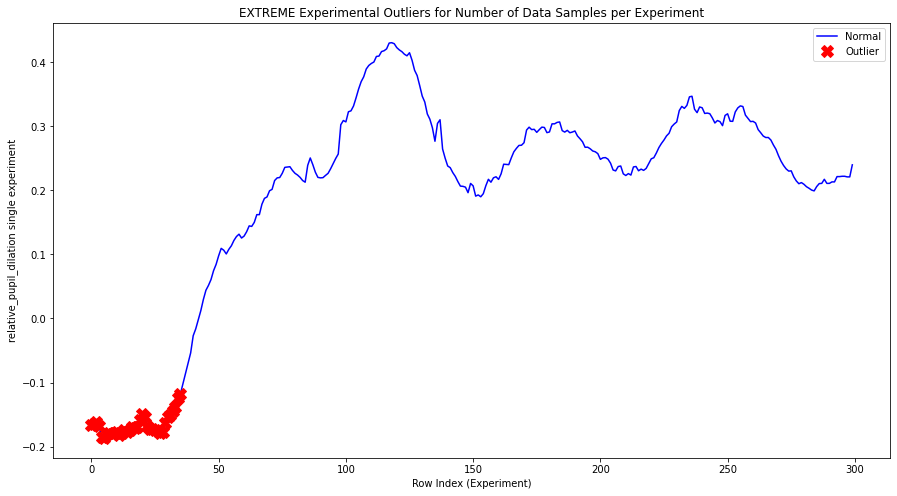



experiment index:  342


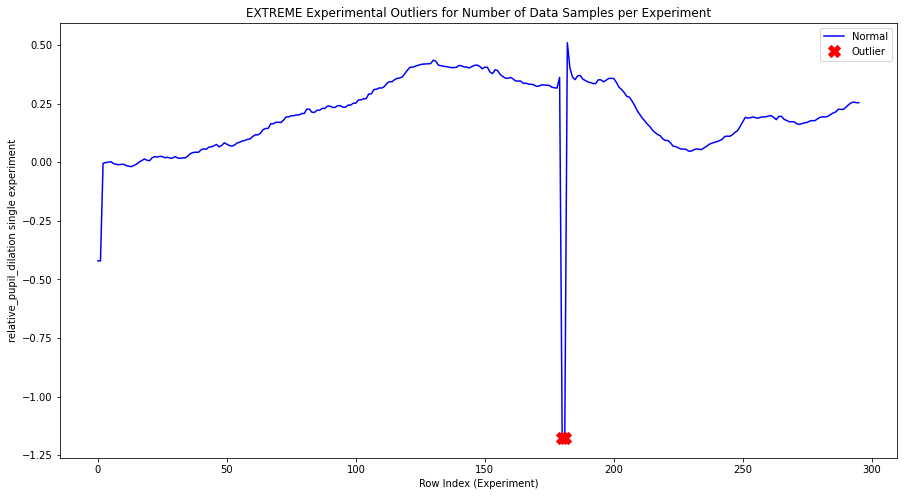



experiment index:  356


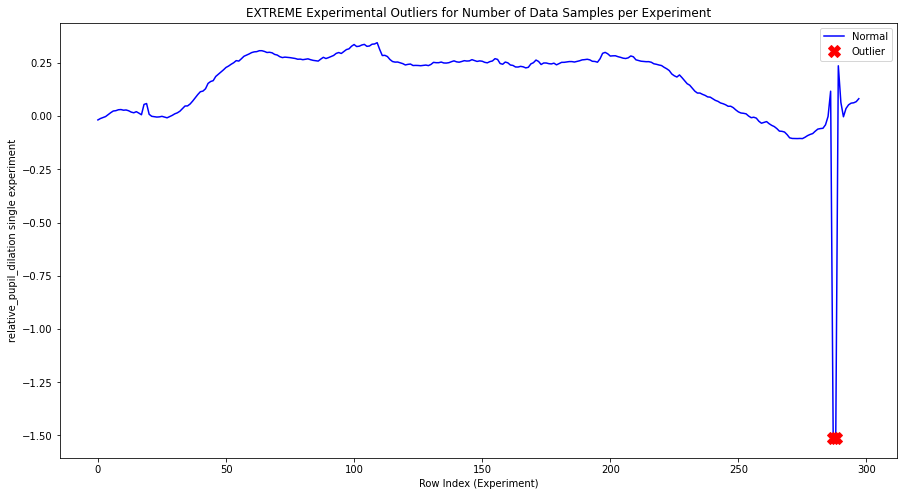



experiment index:  357


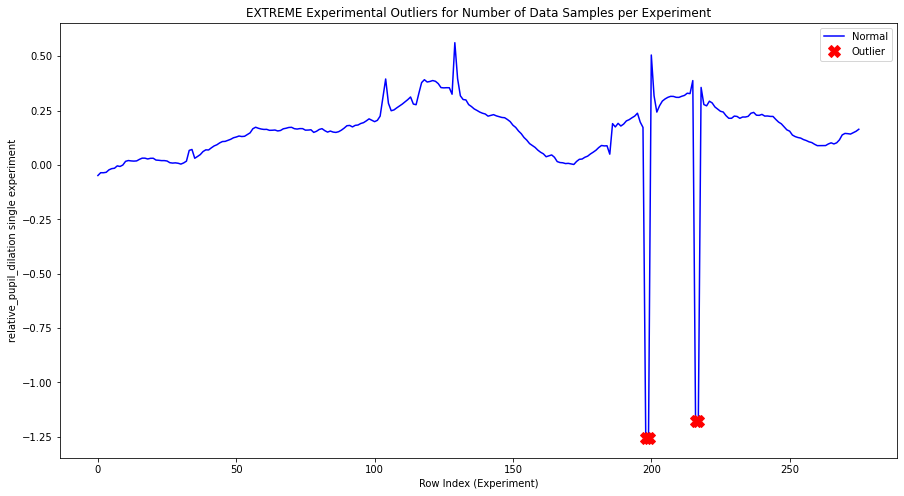



experiment index:  366


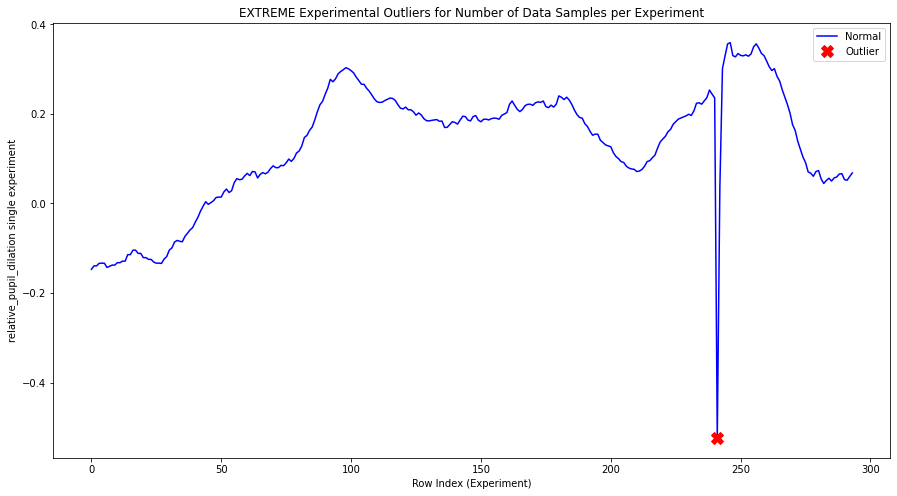



experiment index:  368


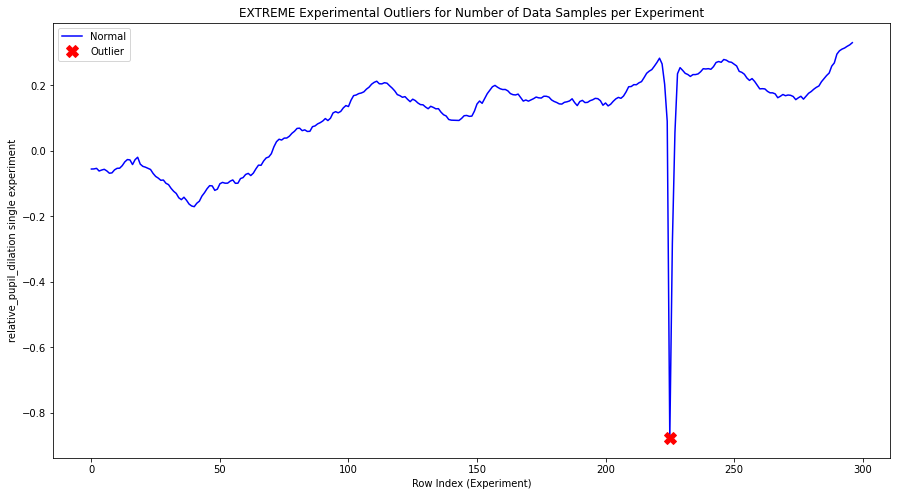



experiment index:  372


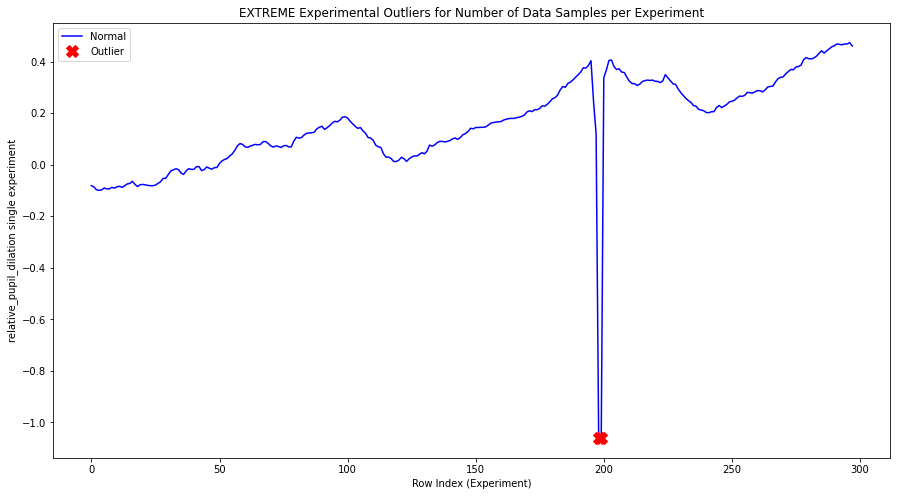



experiment index:  376


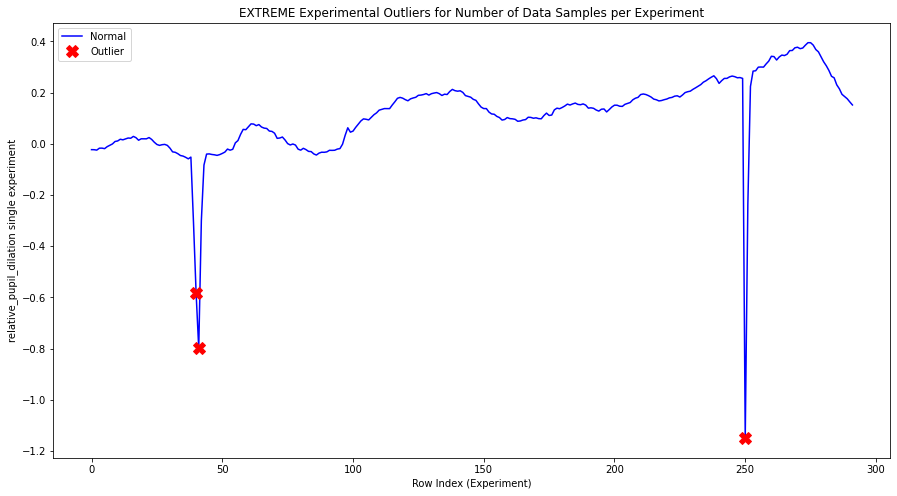



experiment index:  379


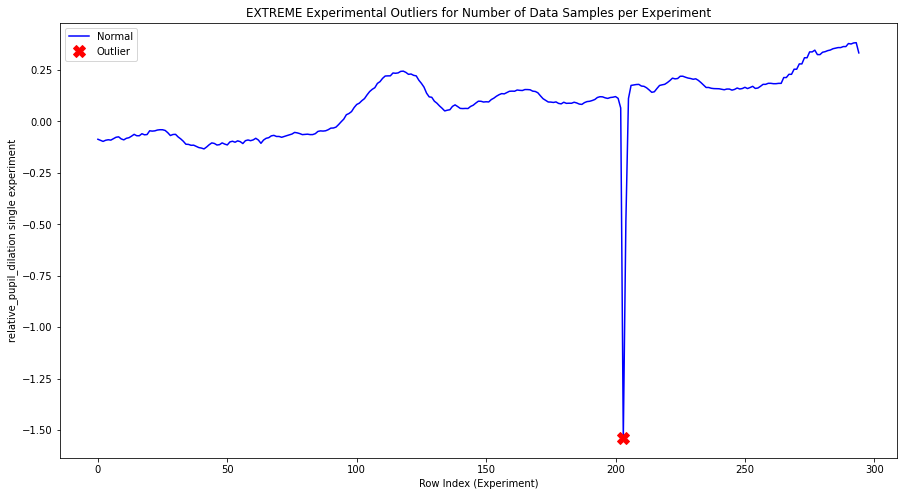



experiment index:  386


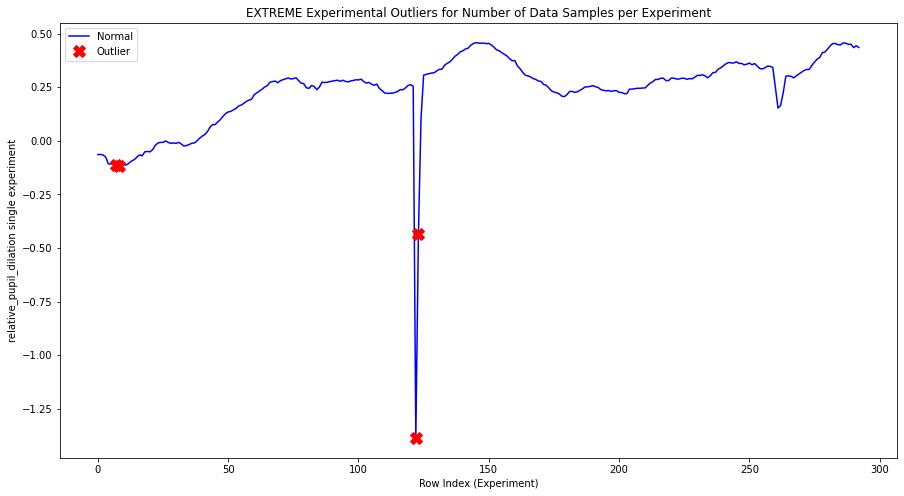



experiment index:  388


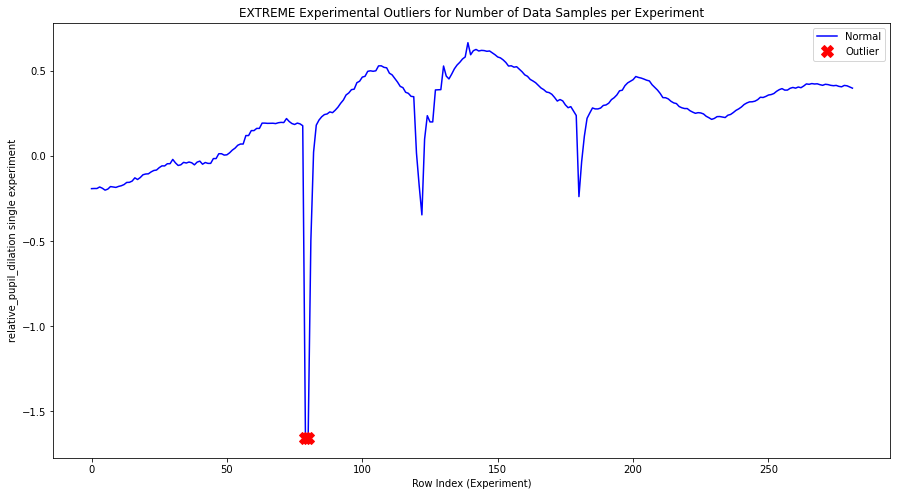



experiment index:  391


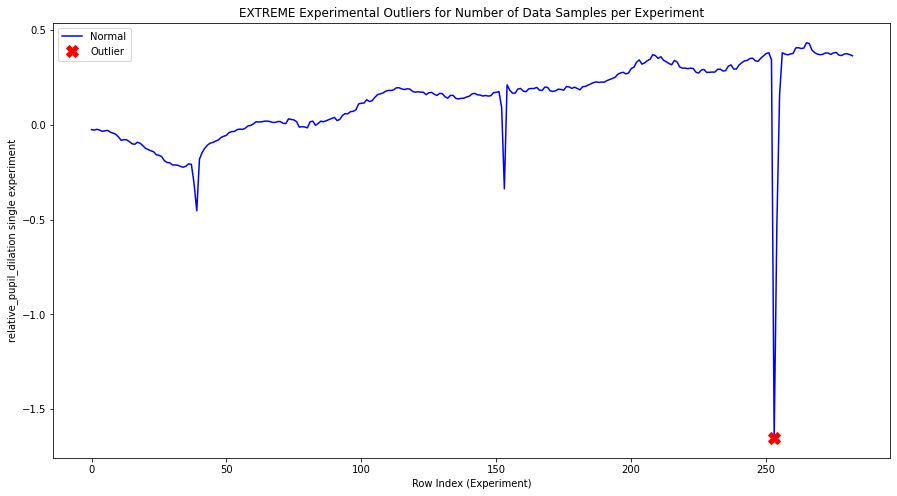



experiment index:  392


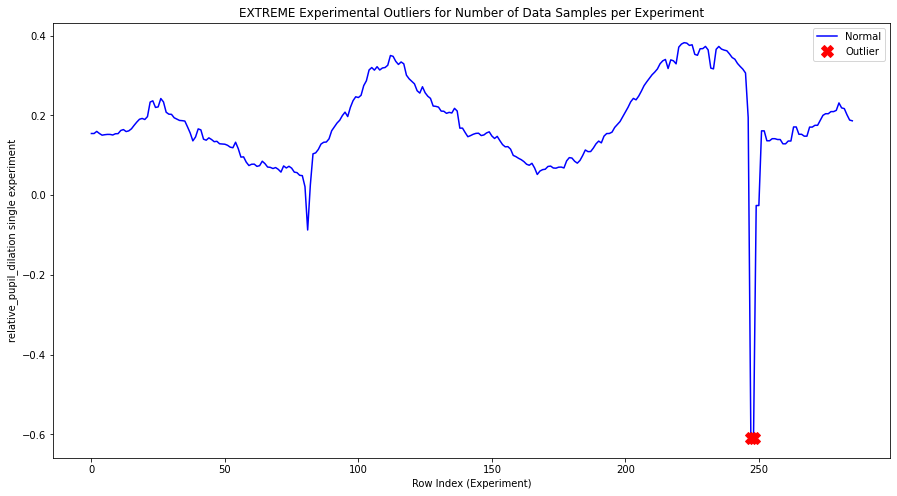



experiment index:  393


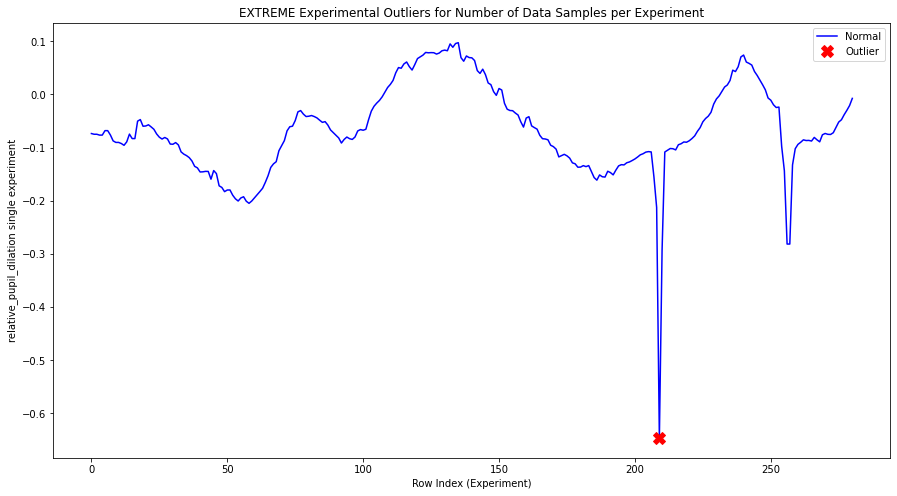



experiment index:  395


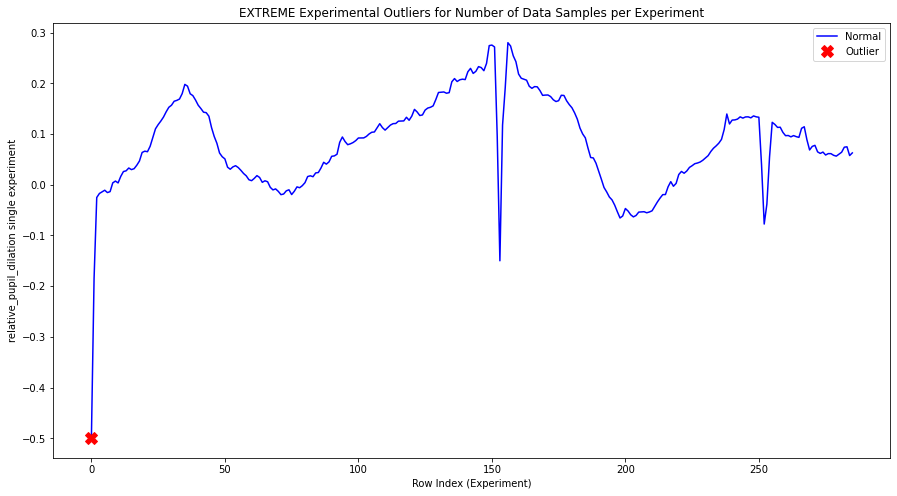



experiment index:  399


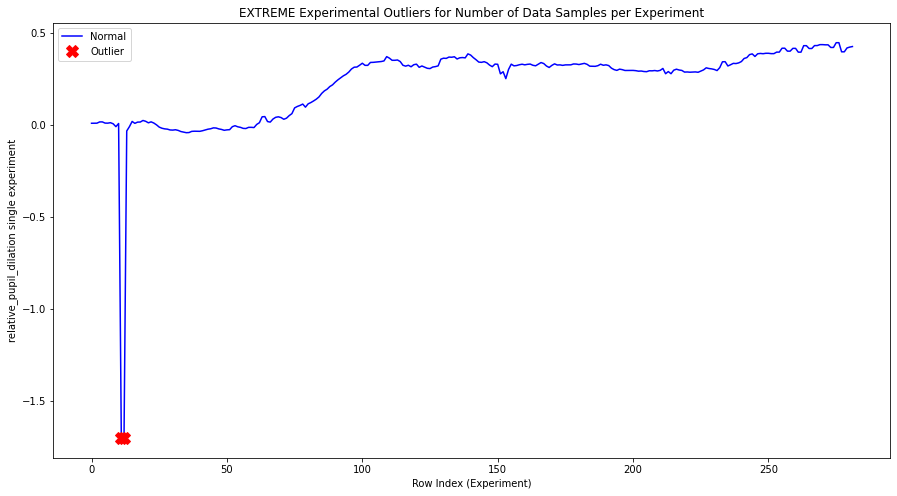



experiment index:  402


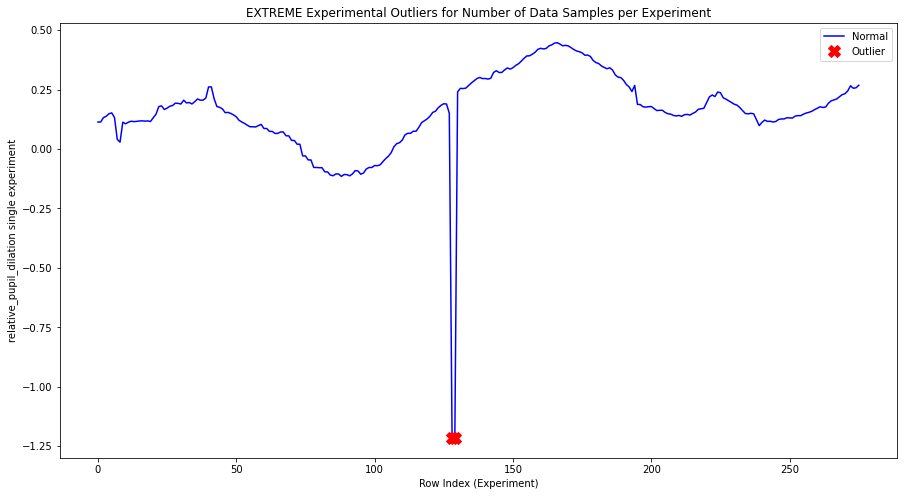



experiment index:  405


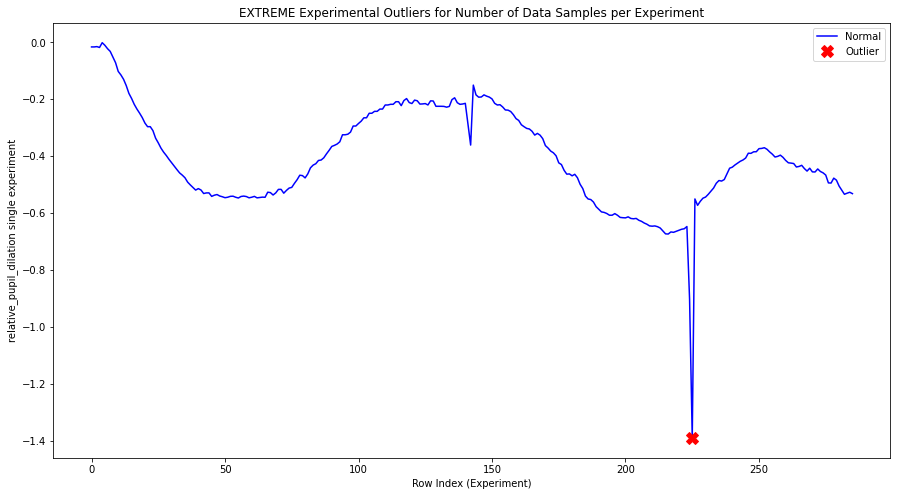



experiment index:  407


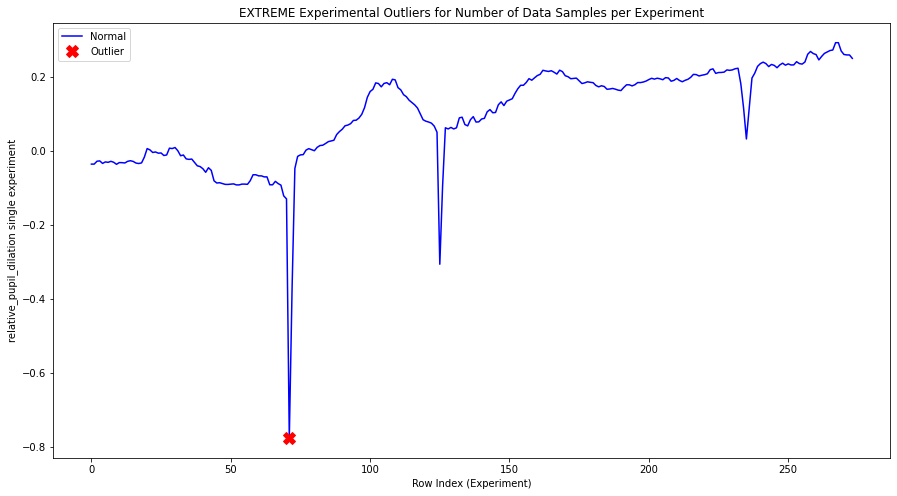



experiment index:  408


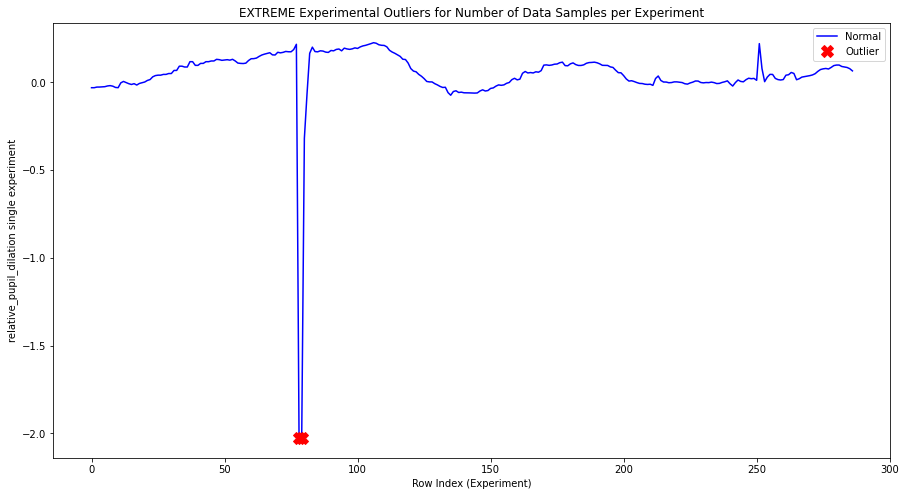



experiment index:  414


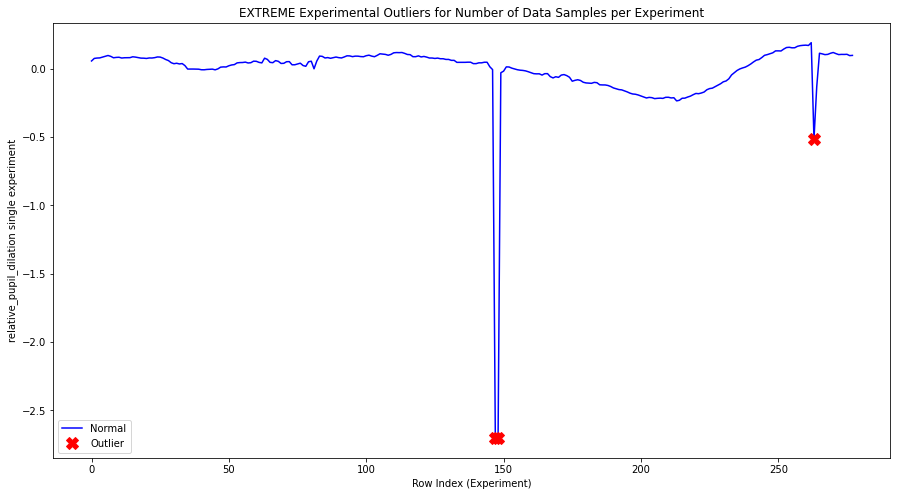



experiment index:  415


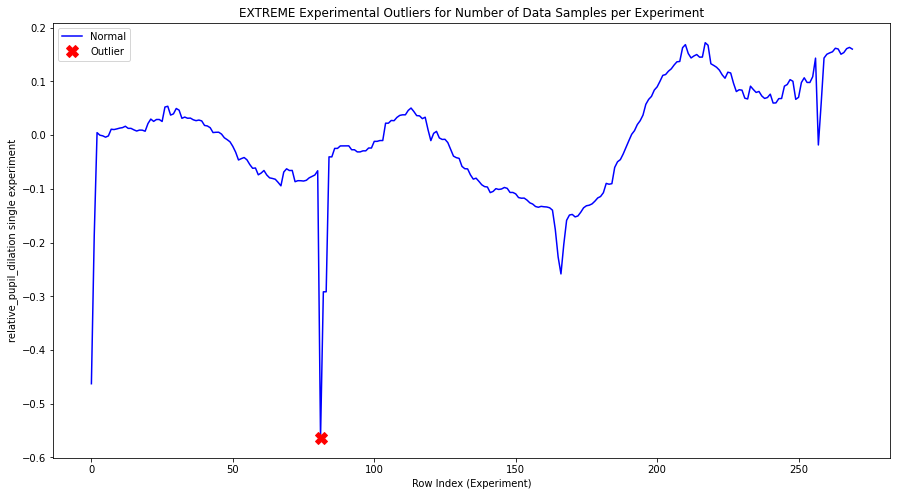



experiment index:  417


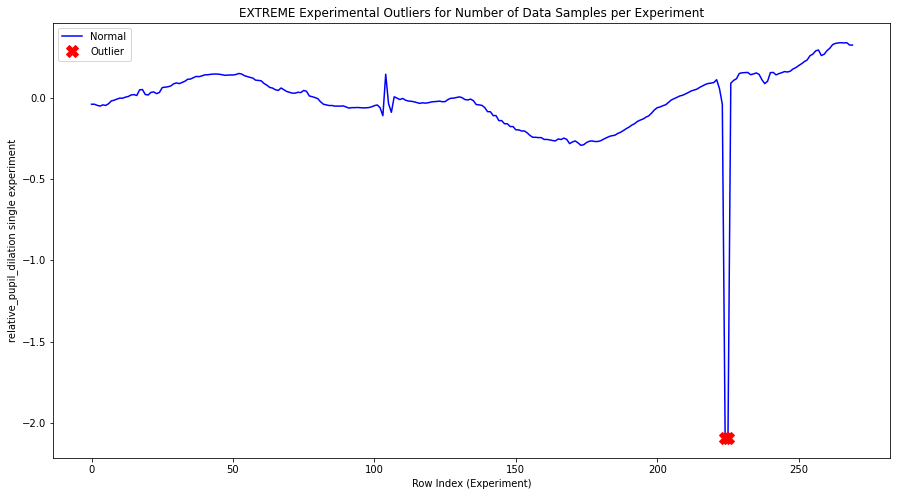



experiment index:  426


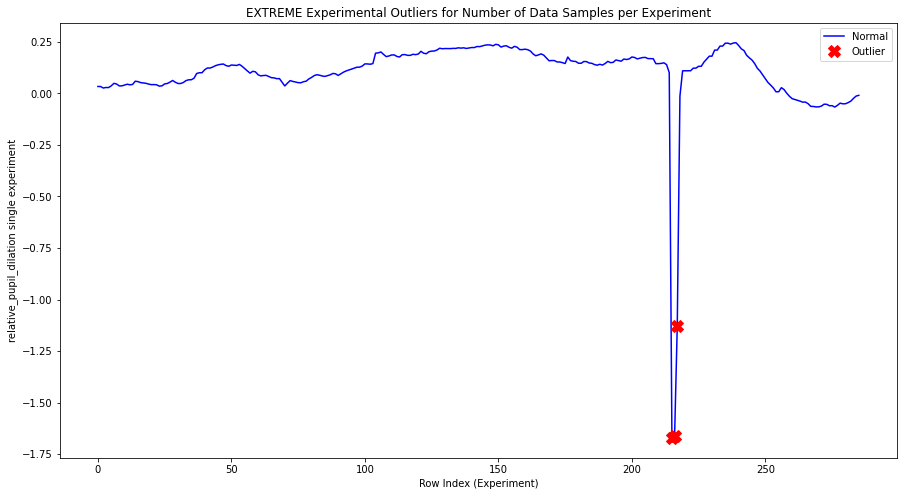



experiment index:  427


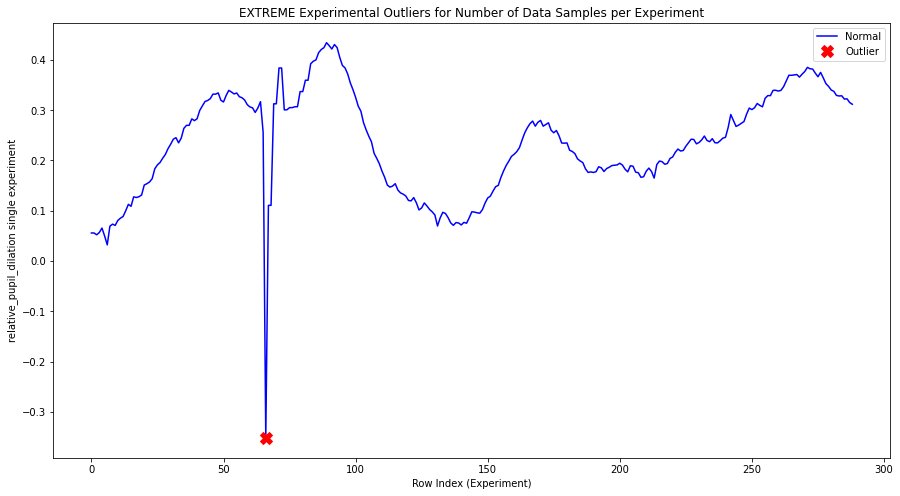



experiment index:  436


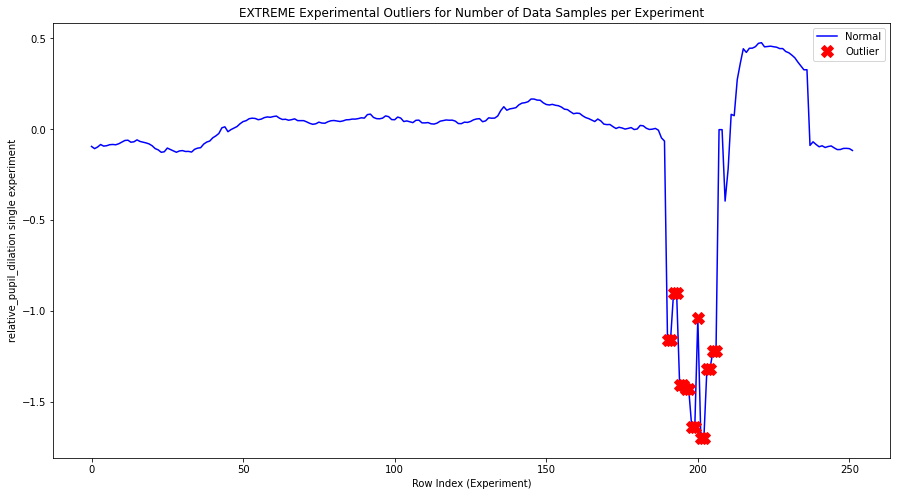



experiment index:  437


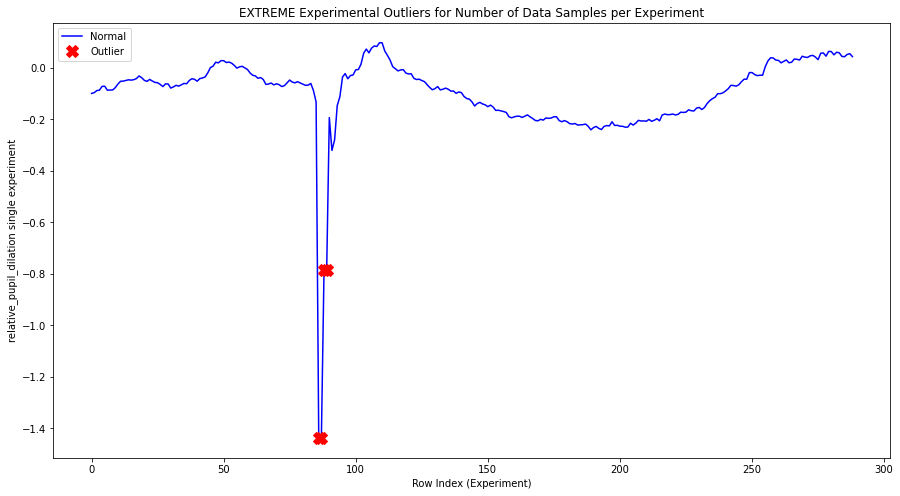



experiment index:  438


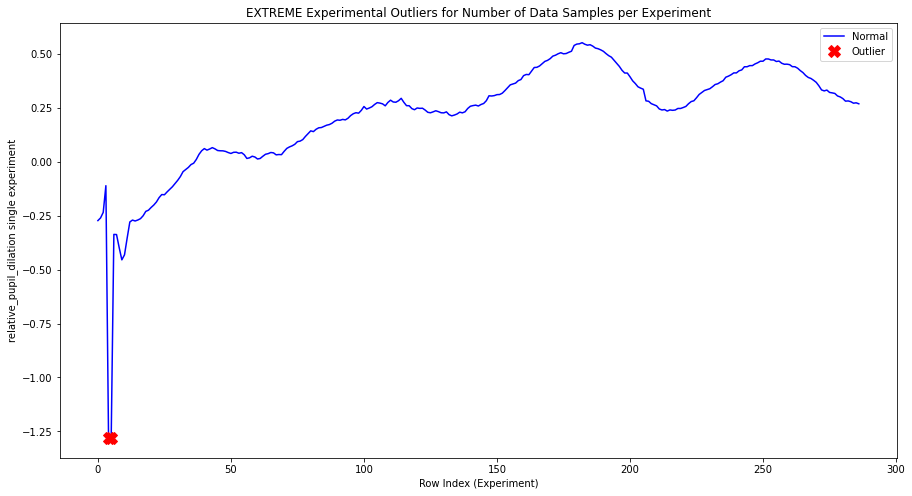



experiment index:  442


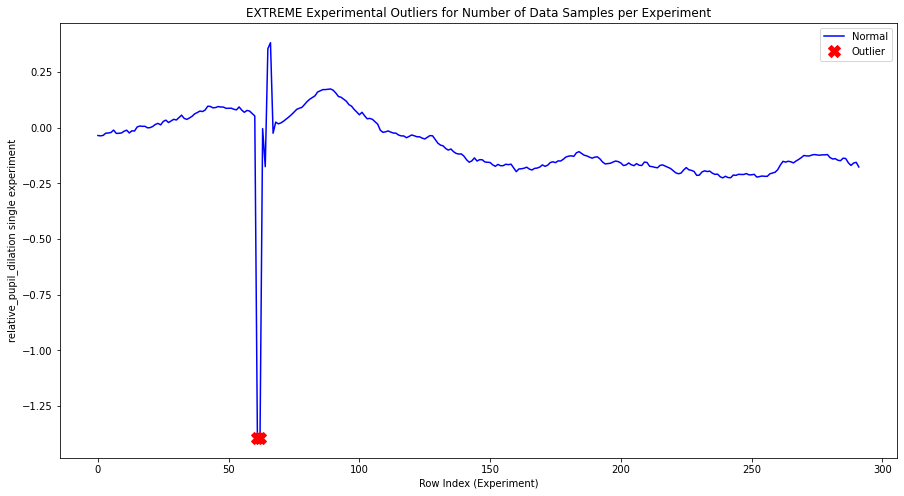



experiment index:  443


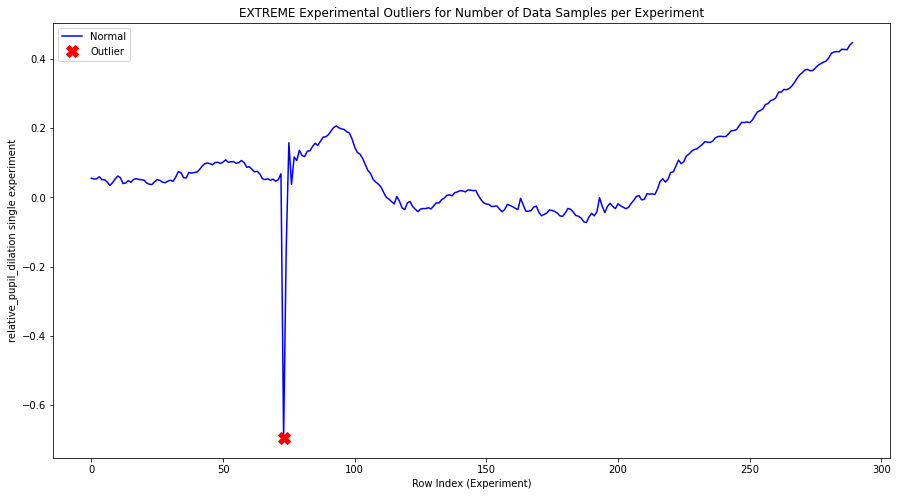



experiment index:  444


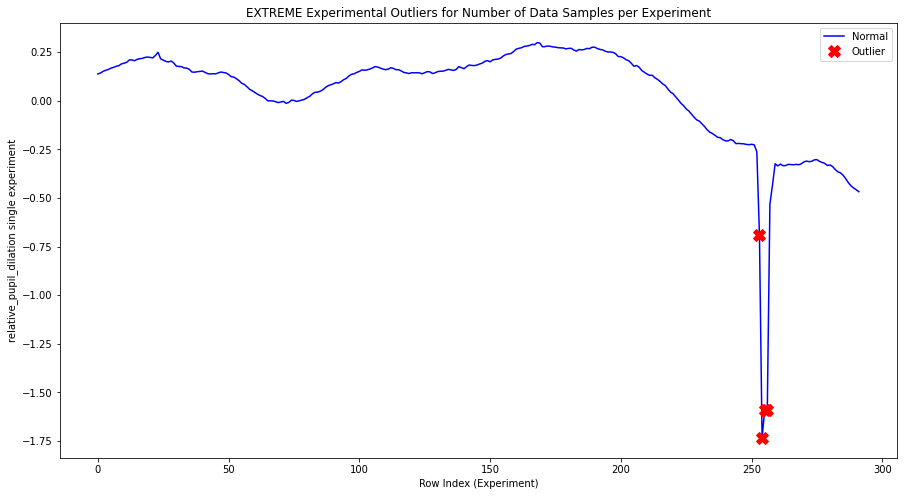



experiment index:  446


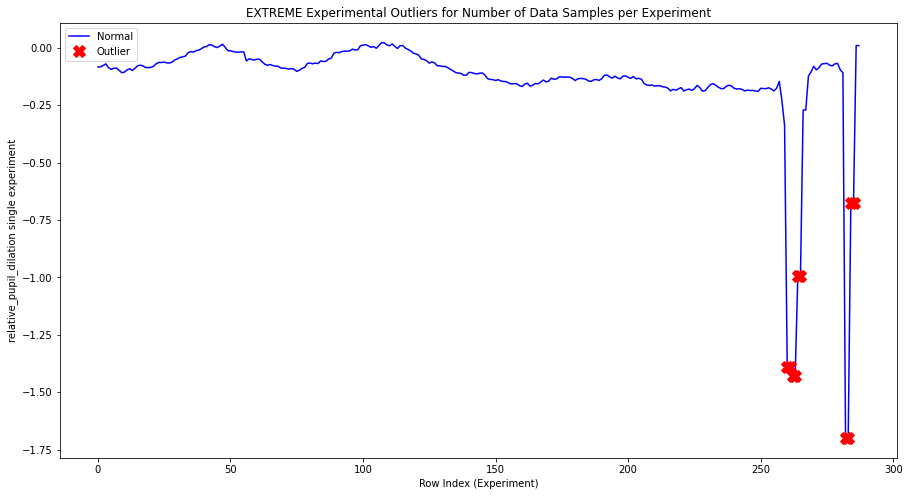



experiment index:  447


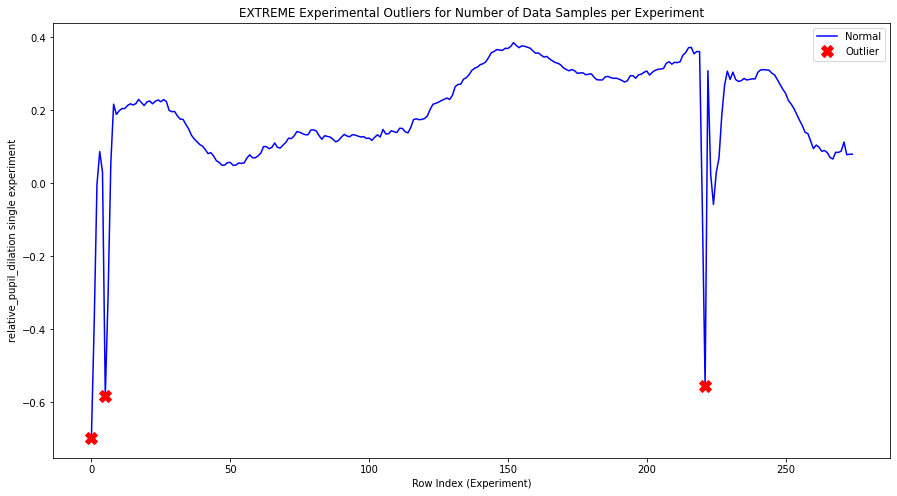



experiment index:  451


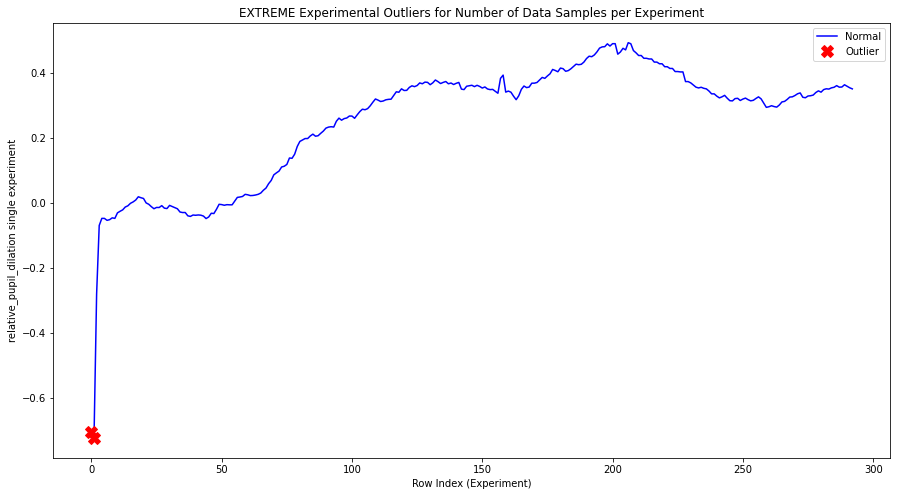



experiment index:  453


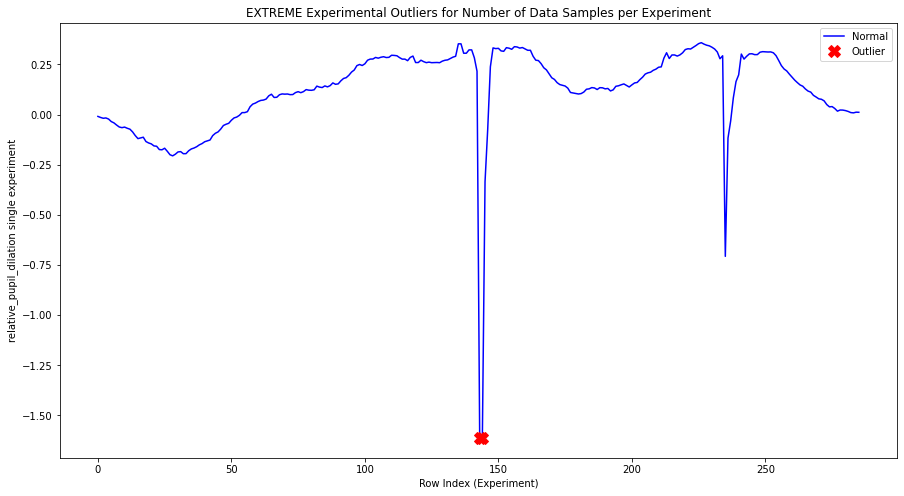



experiment index:  454


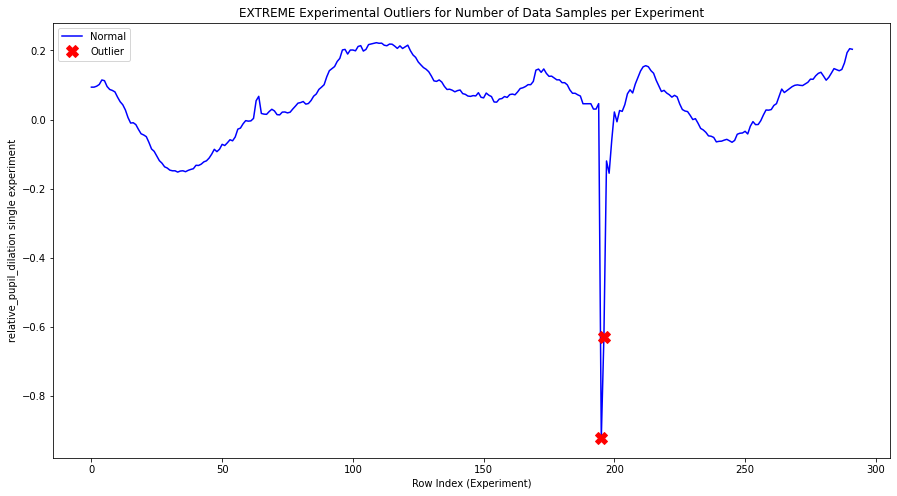



experiment index:  459


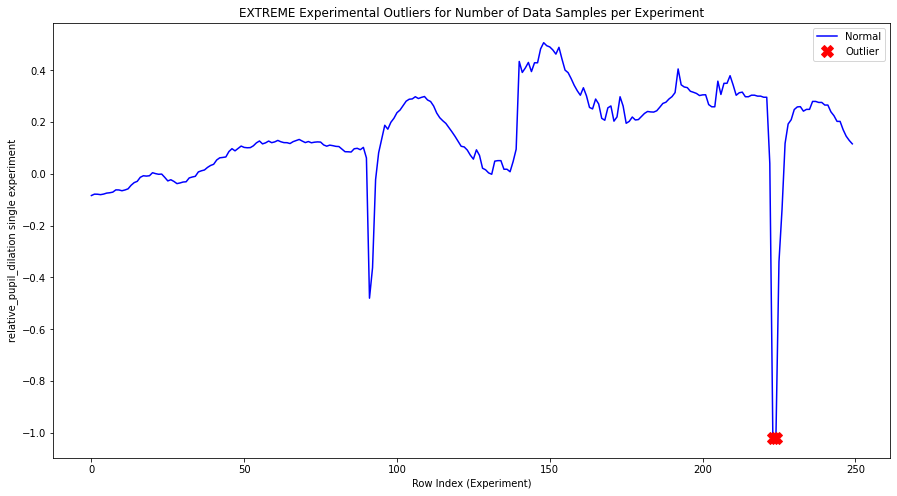



experiment index:  460


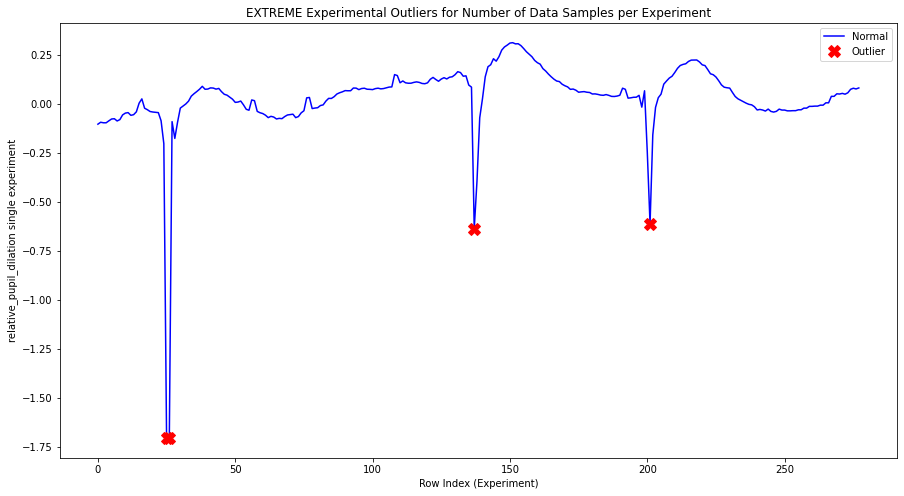



experiment index:  461


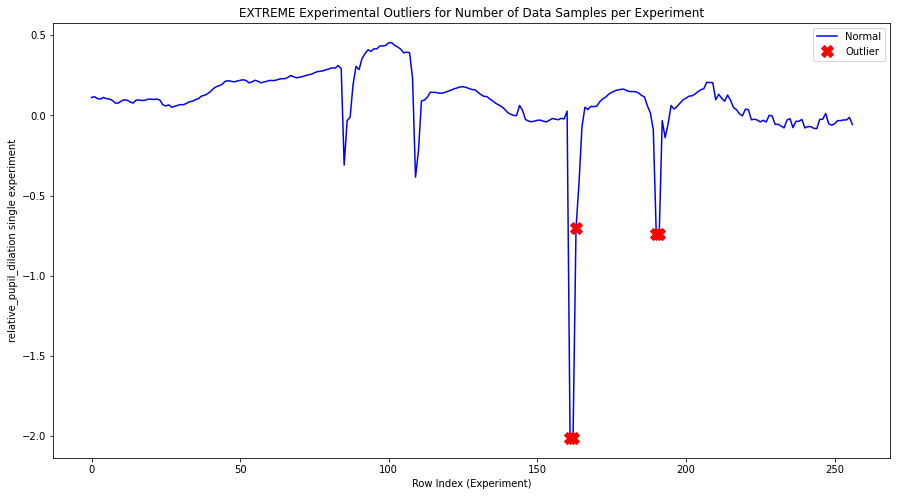



experiment index:  462


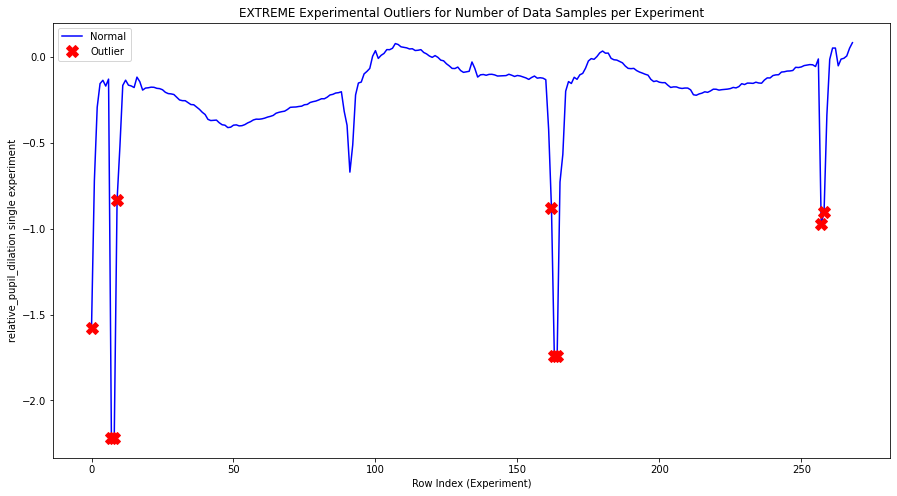



experiment index:  463


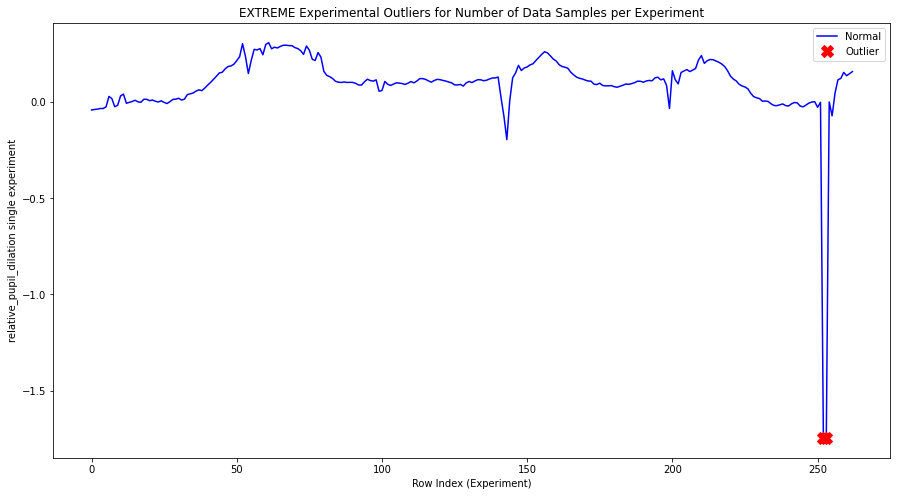



experiment index:  464


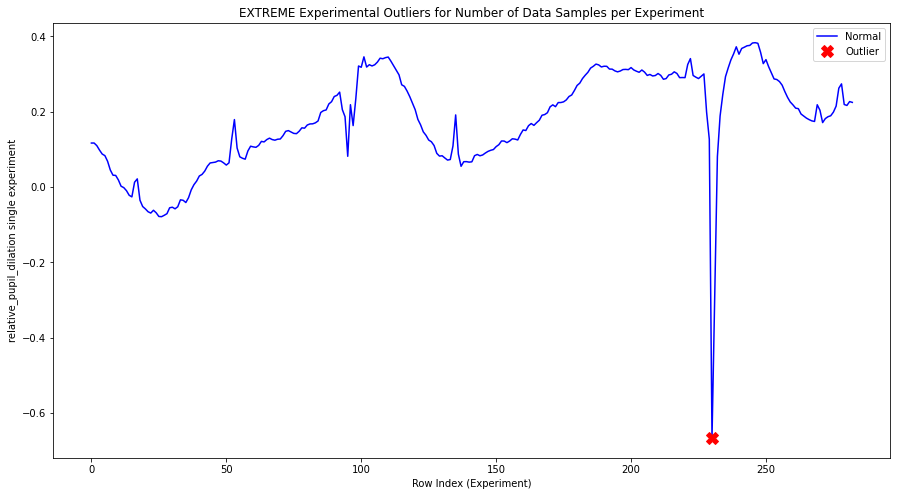



experiment index:  465


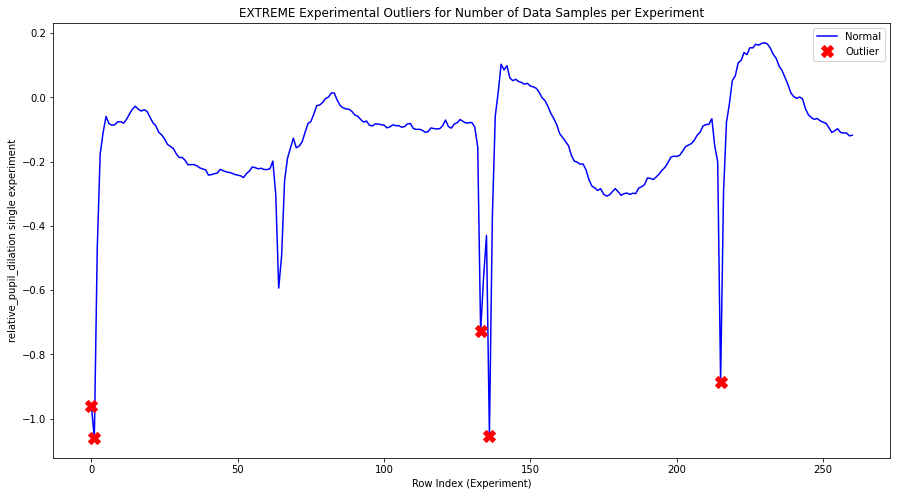



experiment index:  466


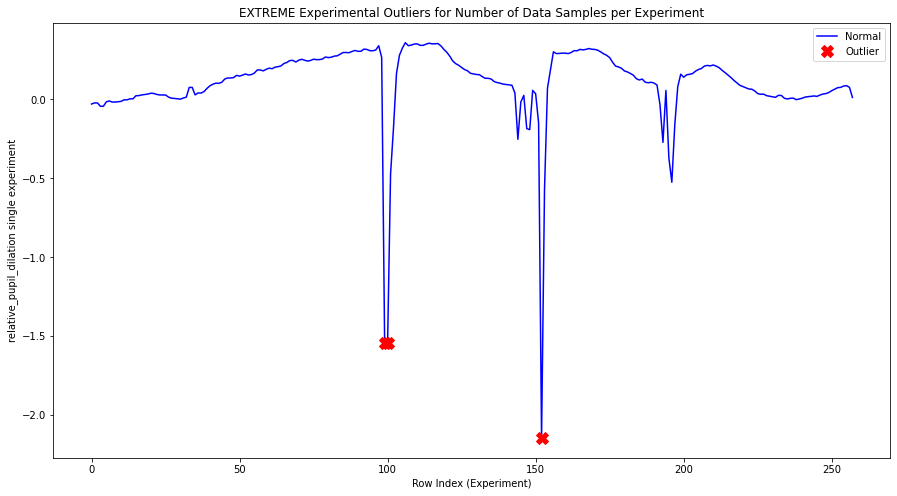



experiment index:  467


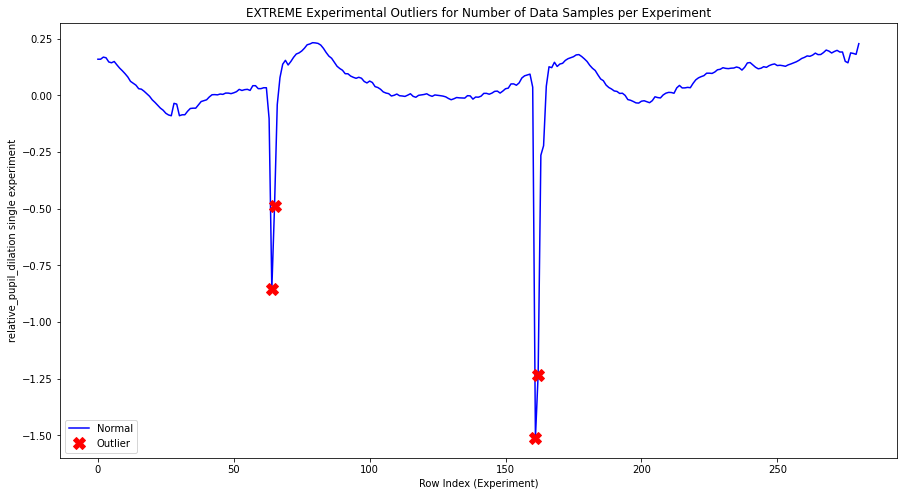



experiment index:  468


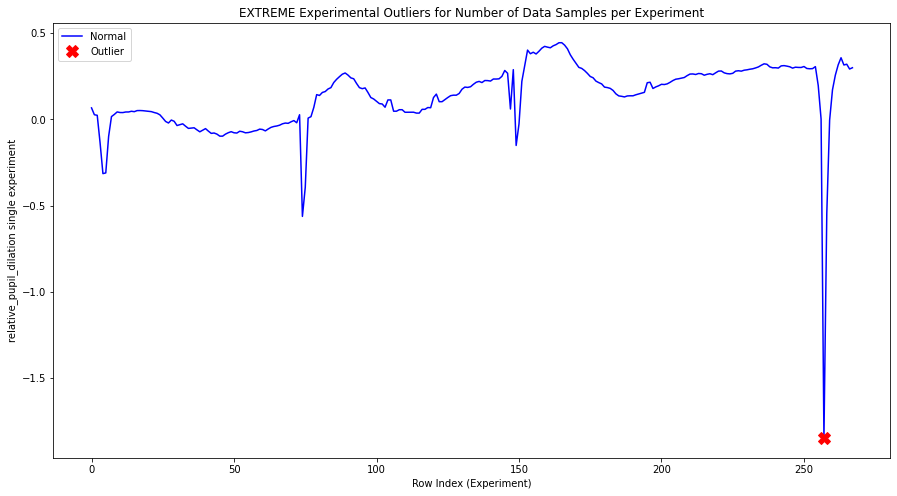



experiment index:  470


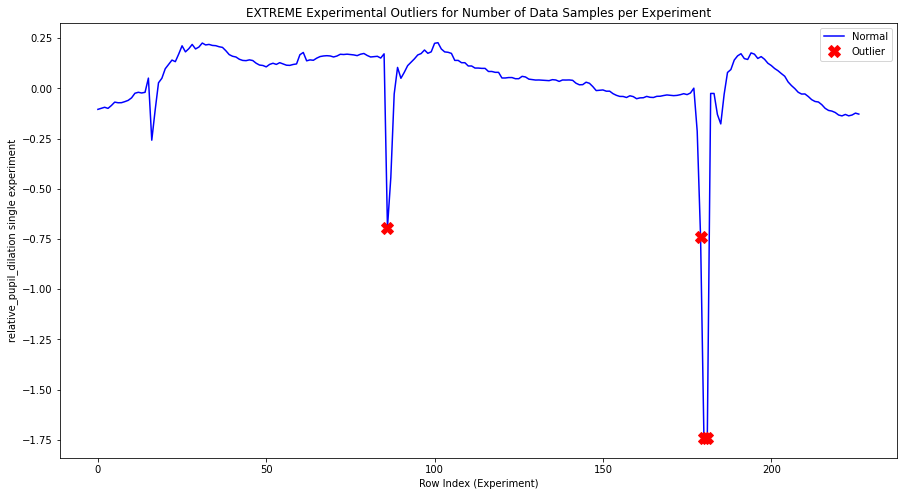



experiment index:  471


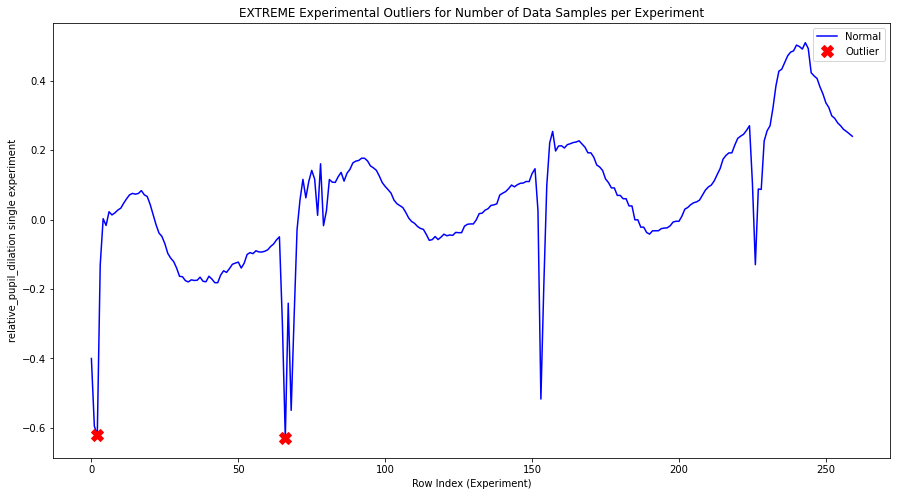



experiment index:  472


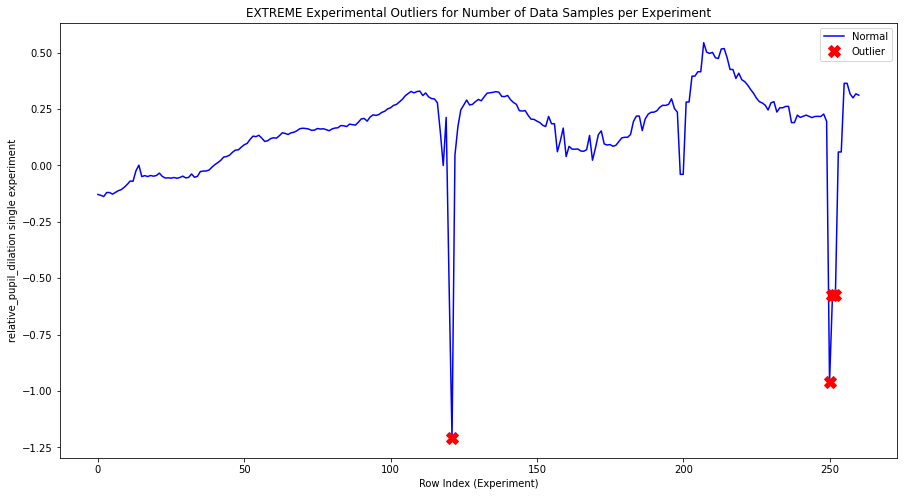



experiment index:  474


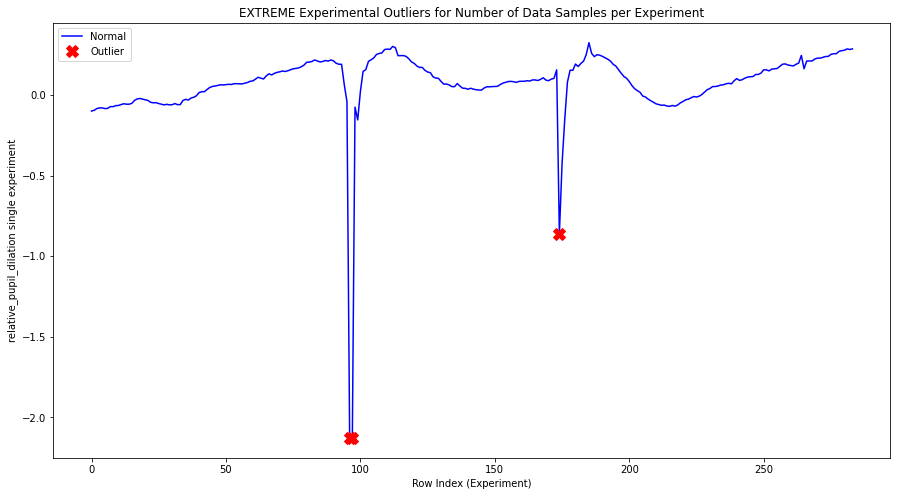



experiment index:  477


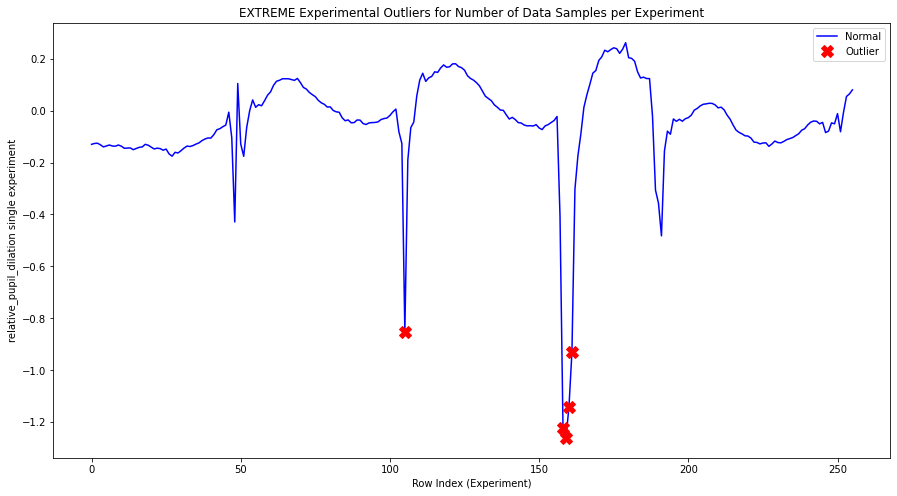

{'0': 137990, '1': 621}
max_outlier:  [56, 112]


In [ ]:
outliers_count = {'0':0, '1':0}
max_outlier = [0, 0]

for ix, single in enumerate(df['relative_pupil_dilation']):
  df_single = pd.DataFrame(single)
  df_single.columns = ['reading']
  df_single = IQR(df_single, 3, 'reading', 'outlier')

  outliers_count['0'] += dict(df_single.outlier.value_counts())[0]
  try:
    outliers_count['1'] += dict(df_single.outlier.value_counts())[1]

    if dict(df_single.outlier.value_counts())[1] > max_outlier[0]:
      max_outlier[0] = dict(df_single.outlier.value_counts())[1]
      max_outlier[1] = ix

    a = df_single[df_single['outlier'] == 1]  # anomaly
    _ = plt.figure(figsize=(15,8))
    _ = plt.plot(df_single['reading'], color='blue', label='Normal')
    _ = plt.plot(a['reading'], linestyle='none', marker='X', color='red', markersize=12, label='Outlier')
    _ = plt.xlabel('Row Index (Experiment)')
    _ = plt.ylabel('relative_pupil_dilation single experiment')
    _ = plt.title('EXTREME Experimental Outliers for Number of Data Samples per Experiment')
    _ = plt.legend(loc='best')
    print("\n\nexperiment index: ", ix)
    plt.show();
  except KeyError:
    pass
print(outliers_count)
print("max_outlier: ", max_outlier)



experiment index:  112


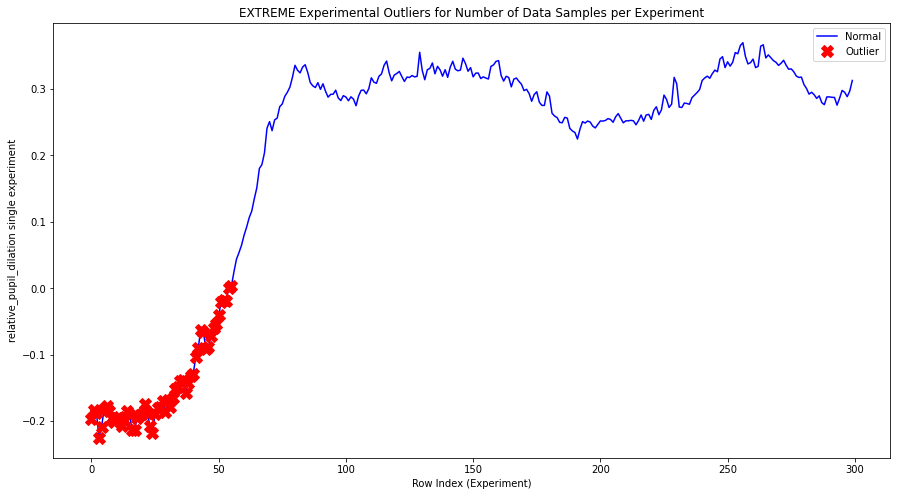

In [ ]:
df_max_outlier = pd.DataFrame(df['relative_pupil_dilation'][112])
df_max_outlier.columns = ['reading']
df_max_outlier = IQR(df_max_outlier, 3, 'reading', 'outlier')

a = df_max_outlier[df_max_outlier['outlier'] == 1]  # anomaly
_ = plt.figure(figsize=(15,8))
_ = plt.plot(df_max_outlier['reading'], color='blue', label='Normal')
_ = plt.plot(a['reading'], linestyle='none', marker='X', color='red', markersize=12, label='Outlier')
_ = plt.xlabel('Row Index (Experiment)')
_ = plt.ylabel('relative_pupil_dilation single experiment')
_ = plt.title('EXTREME Experimental Outliers for Number of Data Samples per Experiment')
_ = plt.legend(loc='best')
print("\n\nexperiment index: ", 112)
plt.show();

In [ ]:
# let's remove all of this outliers and then normalize by value and lenght

outliers_count = {'0':0, '1':0}
max_outlier = [0, 0]
df_new = df.copy(deep=True)
total_number_of_data_points_pre, total_number_of_data_points_post = 0, 0

for ix, single in enumerate(df['relative_pupil_dilation']):
  df_single = pd.DataFrame(single)
  df_single.columns = ['reading']
  pre = len(df_single)
  #print("total_pre: ", total_number_of_data_points_pre)
  #print("pre: ", pre)
  total_number_of_data_points_pre+=pre
  df_single = IQR(df_single, 3, 'reading', 'outlier')
  
  outliers_count['0'] += dict(df_single.outlier.value_counts())[0]
  try:
    outliers_count['1'] += dict(df_single.outlier.value_counts())[1]
    #print("1) additional outliers: ", dict(df_single.outlier.value_counts())[1])

    if dict(df_single.outlier.value_counts())[1] > max_outlier[0]:
      max_outlier[0] = dict(df_single.outlier.value_counts())[1]
      max_outlier[1] = ix
    
    # remove outliers
    df_single = df_single[df_single['outlier'] == 0]
    #print("total_post: ", total_number_of_data_points_post)
    if len(df_single) != pre:
      #print("2) additional outliers: ", pre - len(df_single))
      pass
    # replace in original
    df_new['relative_pupil_dilation'][ix] = df_single['reading']
  except KeyError:
    pass
  finally:
    total_number_of_data_points_post+=len(df_single)

print(outliers_count)
print("max_outlier: ", max_outlier)
print("total_number_of_data_points_pre: ", total_number_of_data_points_pre)
print("total_number_of_data_points_post: ", total_number_of_data_points_post)
if total_number_of_data_points_pre - total_number_of_data_points_post != outliers_count['1']:
  print(total_number_of_data_points_pre - total_number_of_data_points_post, "!=", outliers_count['1'])
  raise Exception("Something went wrong with the removal...")
df_new

<ipython-input-86-7f4984ce3199>:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



{'0': 143356, '1': 644}
max_outlier:  [56, 112]
total_number_of_data_points_pre:  144000
total_number_of_data_points_post:  143356


,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,28,"[3.104660034179688, 3.0881444108127347, 3.0789...","[3.352859497070312, 3.360213033268961, 3.36157...","[-0.19741977344859674, -0.21393539681554996, -...",3.302080,299,88,3.0
1,23,"[2.955612182617188, 2.932542016274953, 2.94530...","[3.072265625, 3.068582256188553, 3.06177426456...","[-0.09146412309393792, -0.11453428943617289, -...",3.047076,299,88,3.0
2,12,"[3.314910888671875, 3.319320678710938, 3.31932...","[3.247802734375, 3.247802734375, 3.25549727879...","[0.08862824873490771, 0.09303803877397065, 0.0...",3.226283,300,88,2.0
3,27,"[3.103240966796875, 3.103240966796875, 3.10493...","[3.357147216796875, 3.3450420251053368, 3.3446...","[-0.0925108810950972, -0.0925108810950972, -0....",3.195752,300,88,3.0
4,1,"[3.380569458007812, 3.380569458007812, 3.38211...","[3.181854248046875, 3.181854248046875, 3.17957...","[0.10638684904977147, 0.10638684904977147, 0.1...",3.274183,299,89,4.0
...,...,...,...,...,...,...,...,...
475,26,"[3.004013061523438, 3.004013061523438, 3.00090...","[3.049407958984375, 3.049407958984375, 3.04627...","[-0.03907416848575318, -0.03907416848575318, -...",3.043087,300,89,2.0
476,18,"[2.868728637695312, 2.868728637695312, 2.86894...","[2.912261962890625, 2.9121035457996842, 2.9195...",13 0.052909 14 0.052549 15 0.05673...,2.868306,299,89,1.0
477,1,"[3.052047729492188, 3.0494976235073943, 3.0428...","[3.080581665039062, 3.080581665039062, 3.07216...","[0.0024068078329402276, -0.0001432981518536139...",3.049641,299,90,3.0
478,8,"[3.0032958984375, 3.0032958984375, 3.010050693...","[3.054000854492188, 3.057418823242188, 3.05741...","[-0.026550971137152768, -0.026550971137152768,...",3.029847,299,90,2.0




experiment index:  32


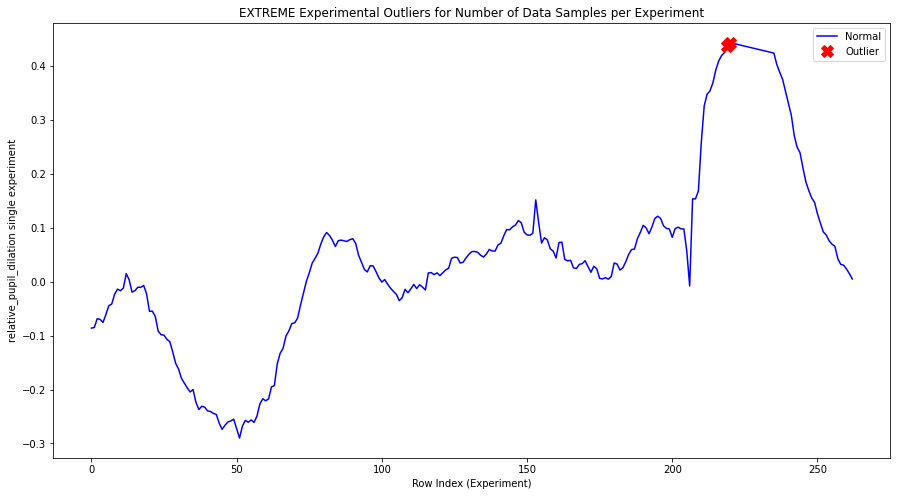



experiment index:  61


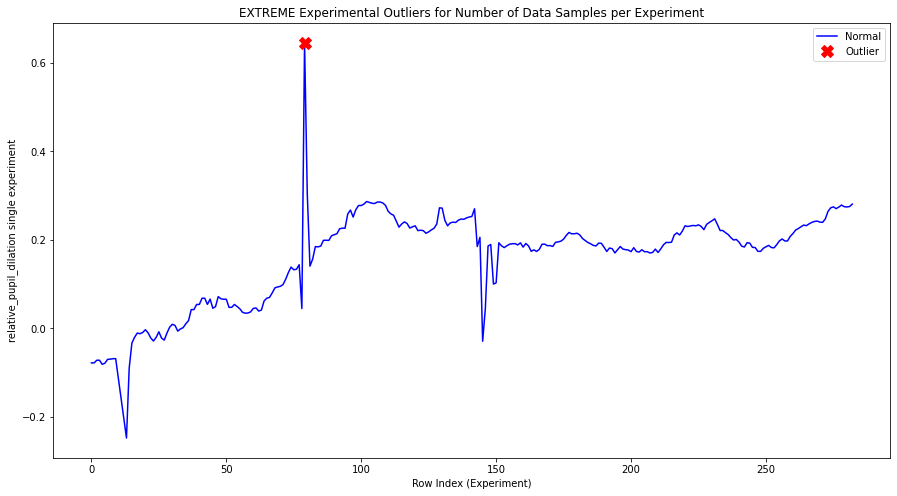



experiment index:  86


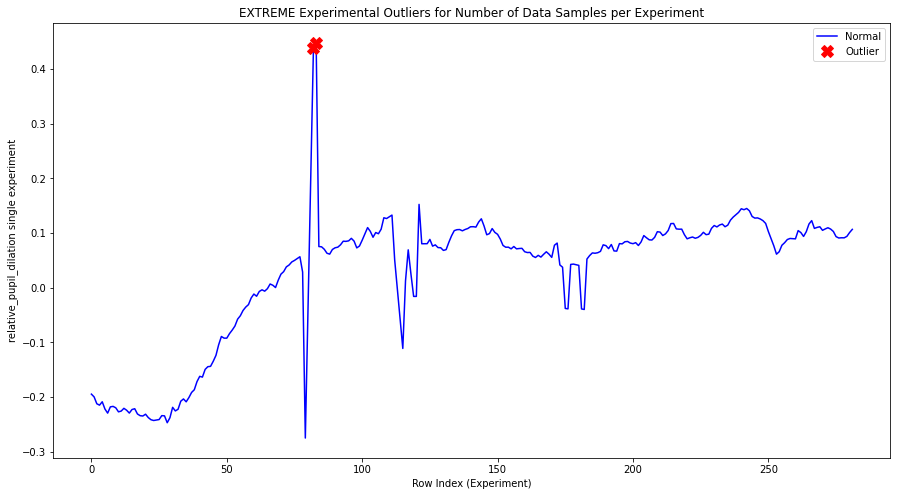



experiment index:  112


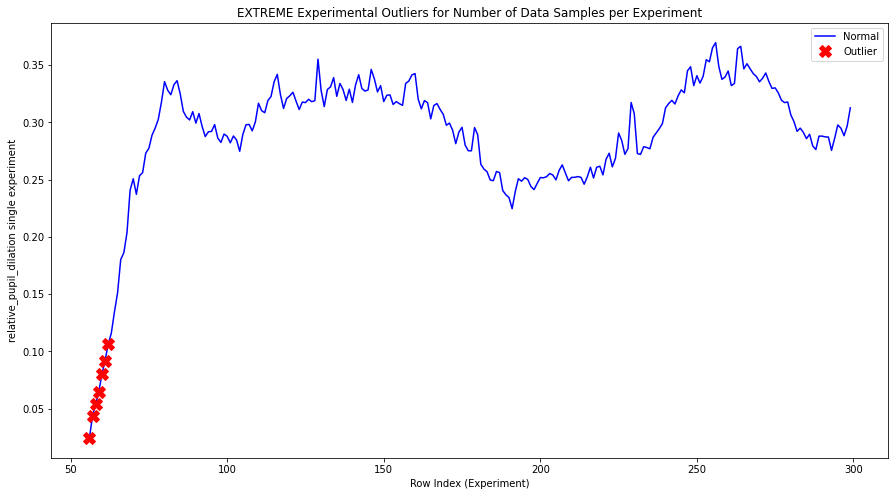



experiment index:  184


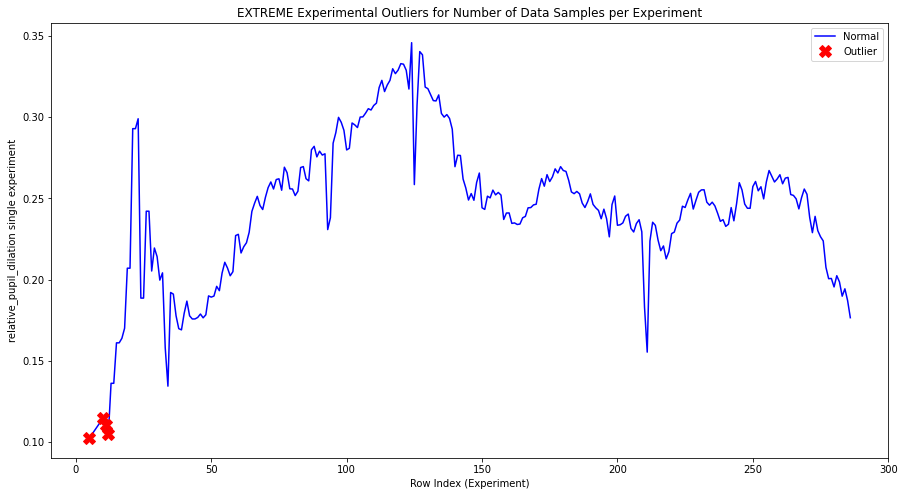



experiment index:  194


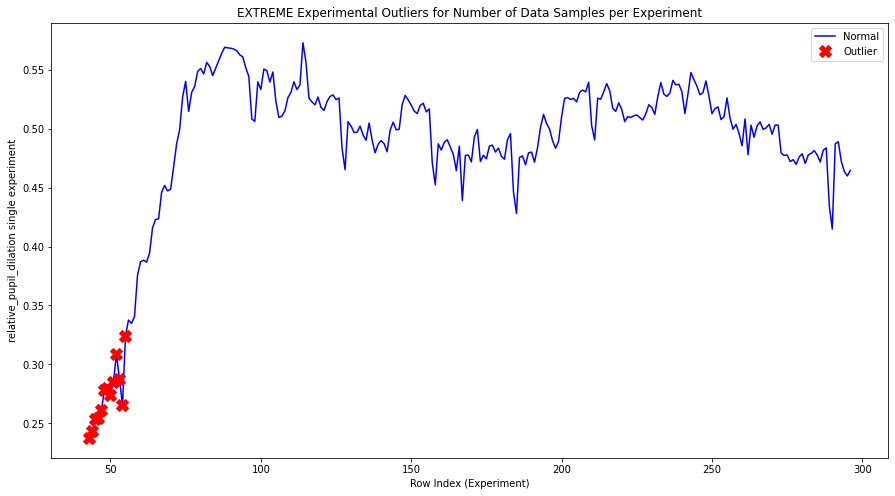



experiment index:  203


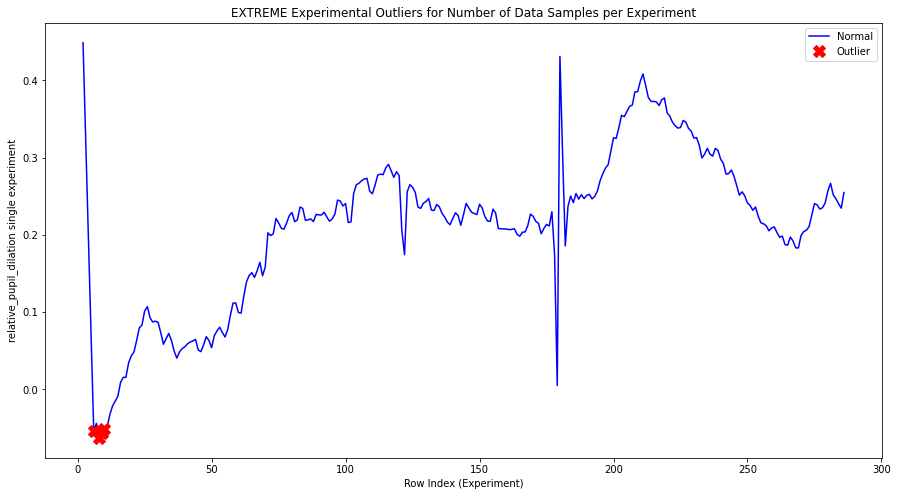



experiment index:  204


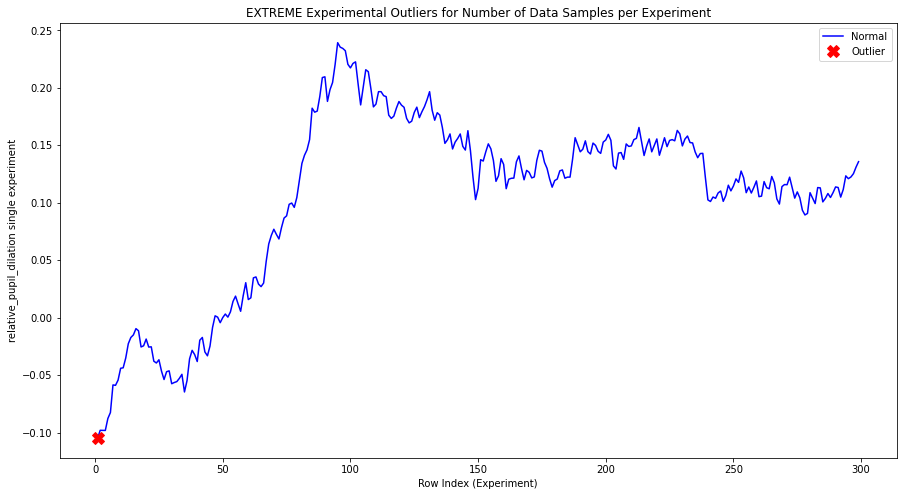



experiment index:  209


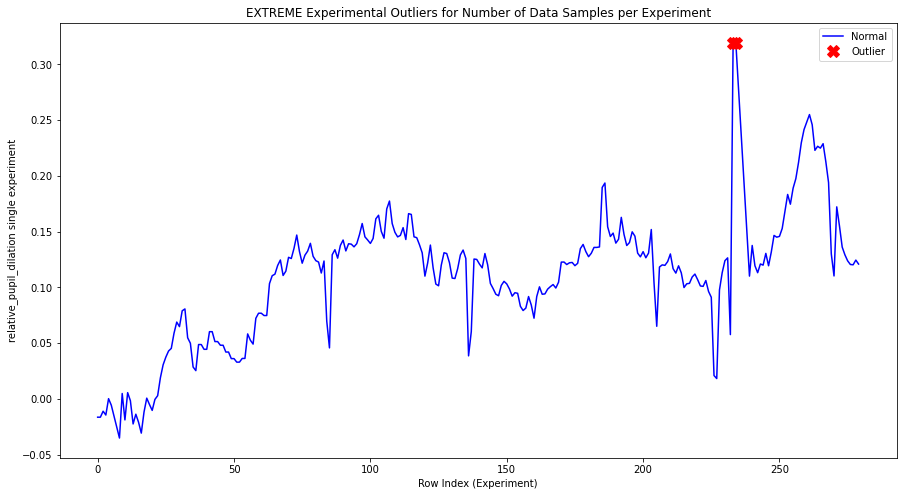



experiment index:  263


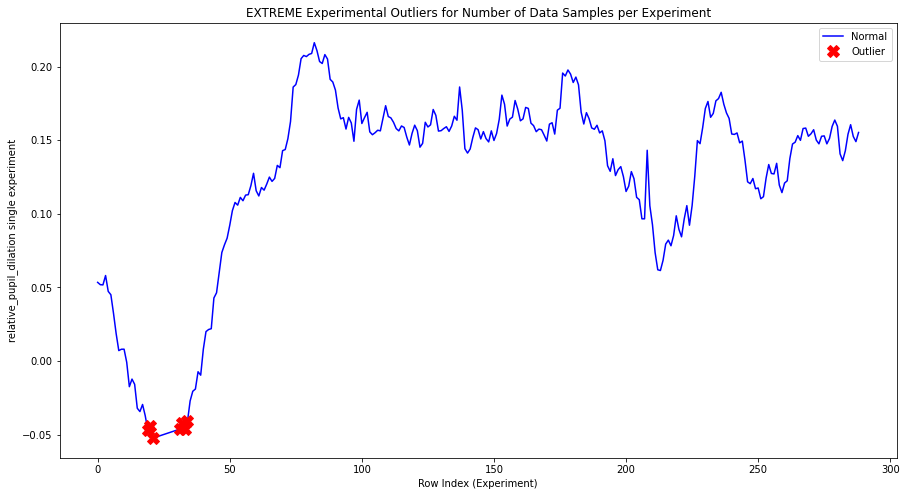



experiment index:  266


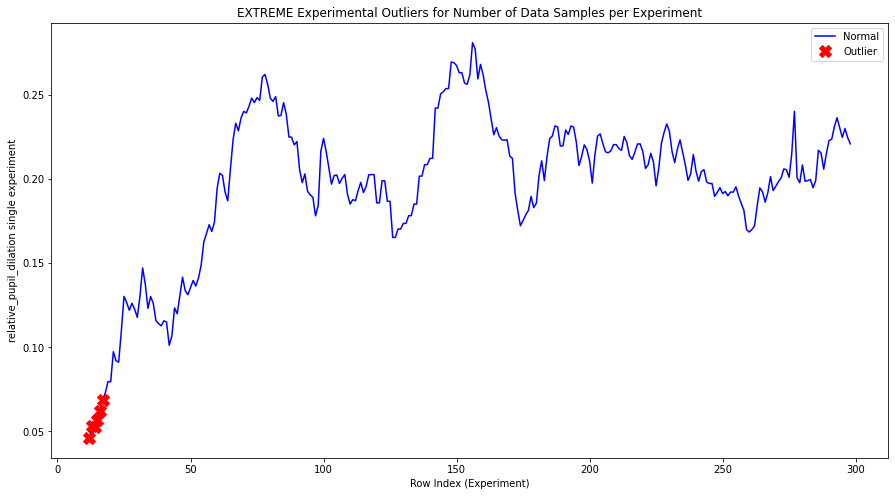



experiment index:  274


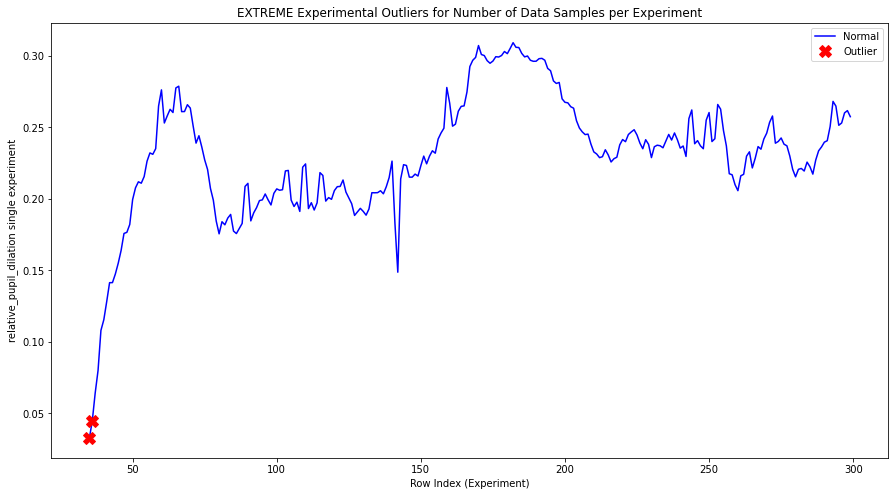



experiment index:  310


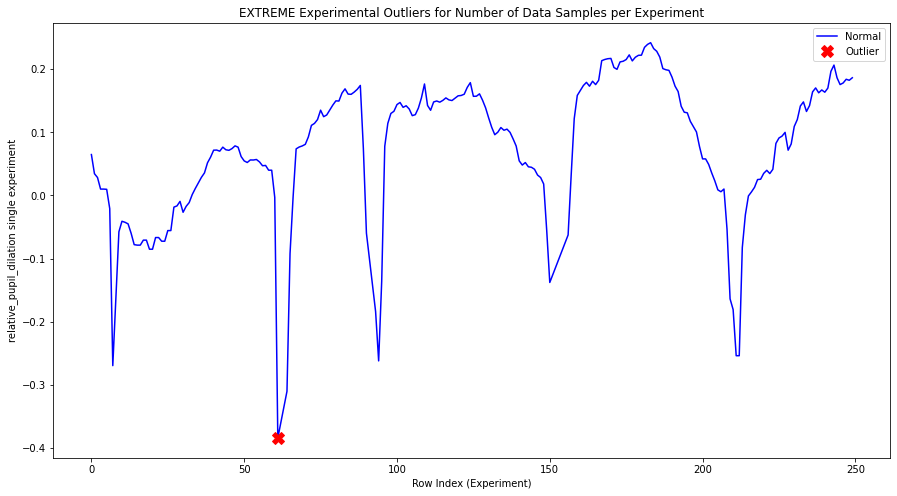



experiment index:  318


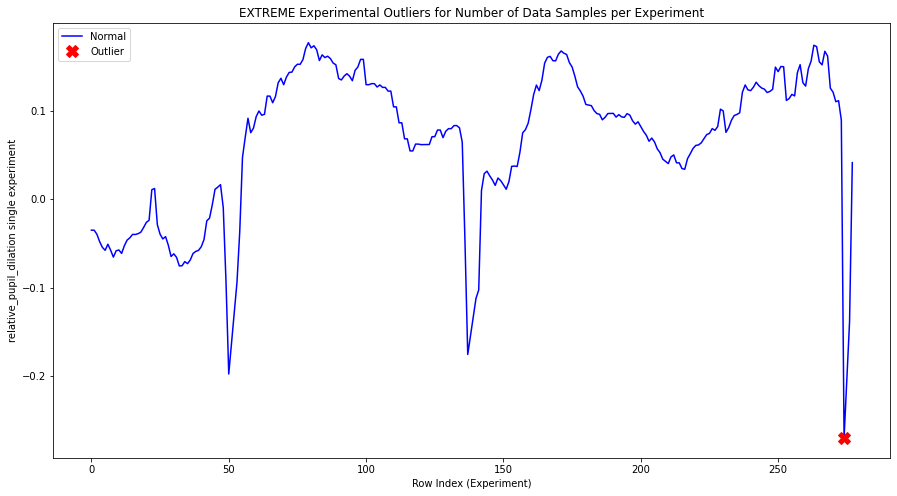



experiment index:  333


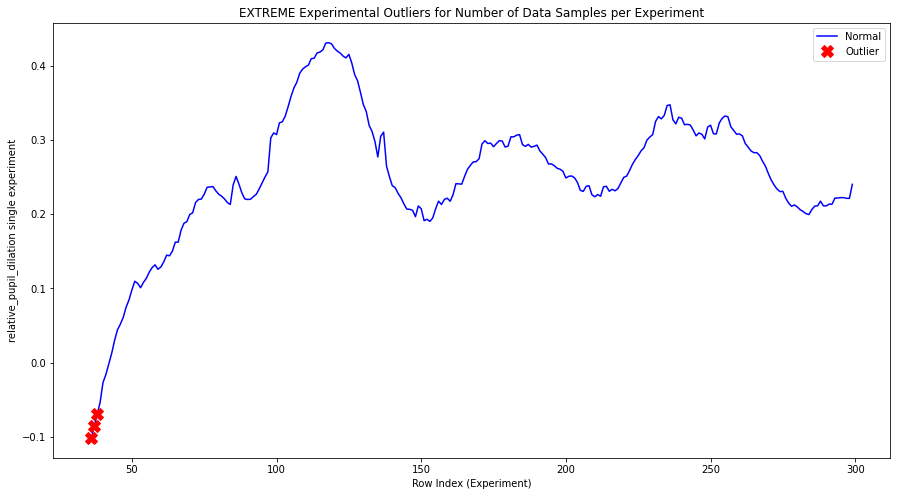



experiment index:  386


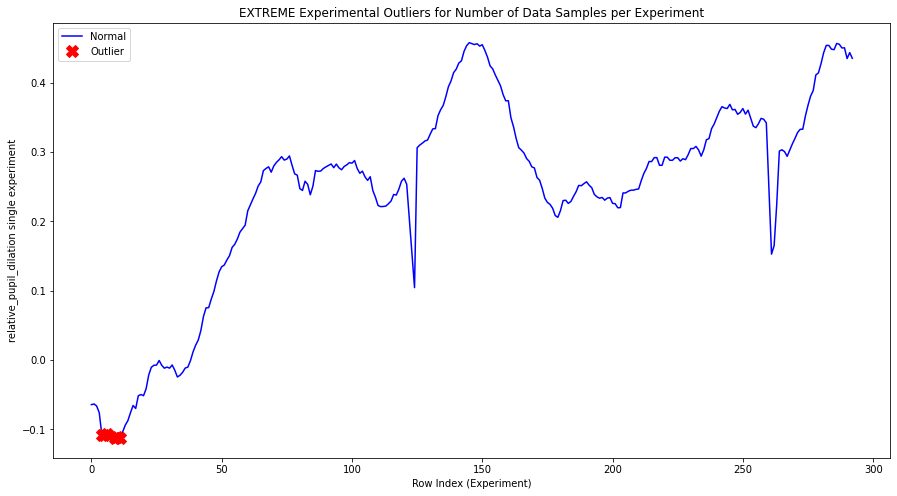



experiment index:  436


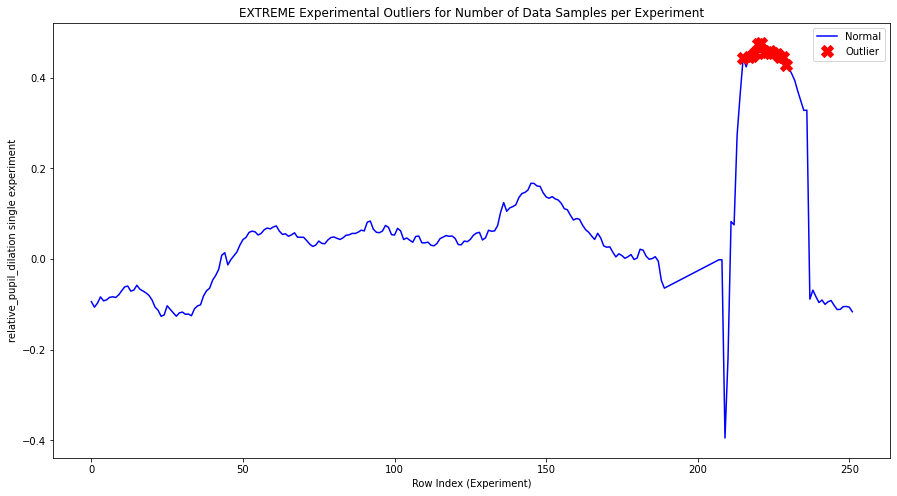



experiment index:  462


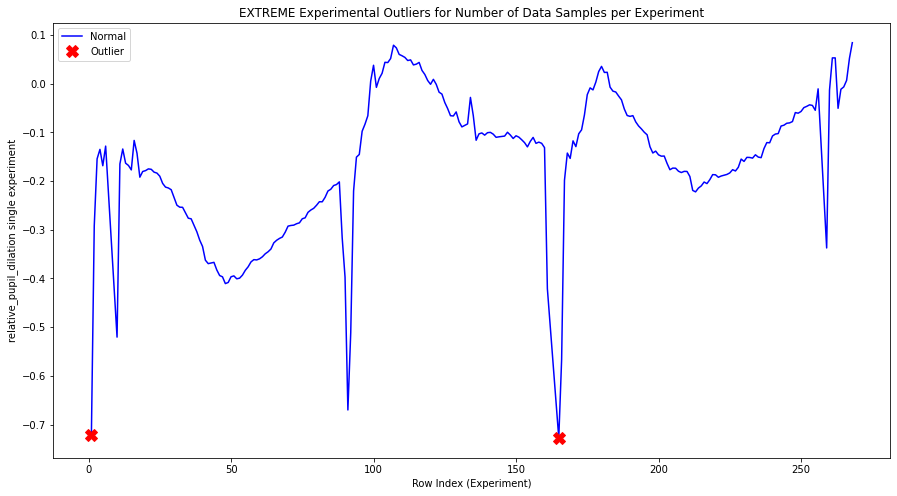

{'0': 137912, '1': 78}
max_outlier:  [14, 436]


In [ ]:
outliers_count = {'0':0, '1':0}
max_outlier = [0, 0]

for ix, single in enumerate(df_new['relative_pupil_dilation']):
  df_single = pd.DataFrame(single)
  df_single.columns = ['reading']
  df_single = IQR(df_single, 3, 'reading', 'outlier')

  outliers_count['0'] += dict(df_single.outlier.value_counts())[0]
  try:
    outliers_count['1'] += dict(df_single.outlier.value_counts())[1]

    if dict(df_single.outlier.value_counts())[1] > max_outlier[0]:
      max_outlier[0] = dict(df_single.outlier.value_counts())[1]
      max_outlier[1] = ix

    a = df_single[df_single['outlier'] == 1]  # anomaly
    _ = plt.figure(figsize=(15,8))
    _ = plt.plot(df_single['reading'], color='blue', label='Normal')
    _ = plt.plot(a['reading'], linestyle='none', marker='X', color='red', markersize=12, label='Outlier')
    _ = plt.xlabel('Row Index (Experiment)')
    _ = plt.ylabel('relative_pupil_dilation single experiment')
    _ = plt.title('EXTREME Experimental Outliers for Number of Data Samples per Experiment')
    _ = plt.legend(loc='best')
    print("\n\nexperiment index: ", ix)
    plt.show();
  except KeyError:
    pass
print(outliers_count)
print("max_outlier: ", max_outlier)

In [ ]:
# let's remove all of this outliers UNTIL THERE ARE NONE, and then normalize by value and lenght

def count_outliers(df_target):
  outliers_count = {'0':0, '1':0}
  for ix, single in enumerate(df_target['relative_pupil_dilation']):
    df_single = pd.DataFrame(single)
    df_single.columns = ['reading']
    df_single = IQR(df_single, 3, 'reading', 'outlier')
    outliers_count['0'] += dict(df_single.outlier.value_counts())[0]
    try:
      outliers_count['1'] += dict(df_single.outlier.value_counts())[1]
    except KeyError:
      pass
  return outliers_count


df_new_iter = df.copy(deep=True)
for i in range(6):
  outliers_count = {'0':0, '1':0}
  max_outlier = [0, 0]
  for ix, single in enumerate(df_new_iter['relative_pupil_dilation']):
    df_single = pd.DataFrame(single)
    df_single.columns = ['reading']
    df_single = IQR(df_single, 3, 'reading', 'outlier')
    outliers_count['0'] += dict(df_single.outlier.value_counts())[0]
    try:
      outliers_count['1'] += dict(df_single.outlier.value_counts())[1]

      if dict(df_single.outlier.value_counts())[1] > max_outlier[0]:
        max_outlier[0] = dict(df_single.outlier.value_counts())[1]
        max_outlier[1] = ix

      # print("in: ", dict(df_single.outlier.value_counts())[1])
      # remove outliers
      df_single = df_single[df_single['outlier'] == 0]
      # replace in original
      df_new_iter['relative_pupil_dilation'][ix] = df_single['reading']
    except KeyError:
      pass
  print(f"_________new round {i}__________")
  print("current: ", count_outliers(df_new_iter))
  print()

print(outliers_count)
print("max_outlier: ", max_outlier)
df_new_iter

# 644 (1round) + 100(5+rounds)

<ipython-input-88-26410e25ea95>:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



_________new round 0__________
current:  {'0': 137912, '1': 78}

_________new round 1__________
current:  {'0': 137896, '1': 16}

_________new round 2__________
current:  {'0': 137893, '1': 3}

_________new round 3__________
current:  {'0': 137892, '1': 1}

_________new round 4__________
current:  {'0': 137890, '1': 2}

_________new round 5__________
current:  {'0': 137890, '1': 0}

{'0': 137890, '1': 2}
max_outlier:  [2, 263]


,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,8,"[3.23388671875, 3.230926513671875, 3.237411499...","[3.482681274414062, 3.470260620117188, 3.47026...","[-0.08764099806882042, -0.09060120314694542, -...",3.321528,299,89,2.0
1,23,"[3.346038818359375, 3.34320068359375, 3.256164...","[3.319122314453125, 3.329864501953125, 3.34054...","[-0.0207672119140625, -0.0236053466796875, -0....",3.366806,299,89,3.0
2,4,"[3.611862182617188, 3.616348266601562, 3.62803...","[3.671844482421875, 3.66632080078125, 3.669601...","[0.01179400357333149, 0.016280087557705603, 0....",3.600068,300,88,3.0
3,2,"[3.448638916015625, 3.44091796875, 3.447143554...","[3.578582763671875, 3.578582763671875, 3.56745...","[0.003875732421875, -0.00384521484375, 0.00238...",3.444763,300,89,2.0
4,18,"[3.37921142578125, 3.373687744140625, 3.374557...","[3.63482666015625, 3.629974365234375, 3.627380...","[-0.07874923877501772, -0.08427292041564272, -...",3.457961,299,89,4.0
...,...,...,...,...,...,...,...,...
475,17,"[3.64678955078125, 3.65069580078125, 3.6457366...","[3.855117797851562, 3.856155395507812, 3.86544...","[-0.1878942795741705, -0.1839880295741705, -0....",3.834684,299,90,1.0
476,10,"[3.54608154296875, 3.522750854492188, 3.506439...","[3.776016235351562, 3.781356811523438, 3.77351...","[-0.15740007672991085, -0.1807307652064729, -0...",3.703482,300,89,3.0
477,20,"[3.638427734375, 3.641860961914062, 3.64276123...","[3.80377197265625, 3.80255126953125, 3.7984924...",0 -0.130010 1 -0.126577 2 -0.12567...,3.768438,300,89,3.0
478,9,"[3.444442749023438, 3.458206176757812, 3.46366...","[3.644729614257812, 3.633026123046875, 3.62728...","[-0.07840540501978444, -0.06464197728541032, -...",3.522848,300,89,4.0


##### Lenghts

In [ ]:
# detect outliers in len of series with the IQR

df = IQR(df, 3, 'len_pupil_dilation', 'outlier_len_pupil_dilation')
df = IQR(df, 3, 'len_baseline', 'outlier_len_baseline')
#   df = IQR(df, 3, 'len_baseline', 'outlier_len_baseline')
df

,trial_id,pupil_dilation,baseline,rating,len_pupil_dilation,len_baseline,outlier_len_pupil_dilation,outlier_len_baseline
0,17,"[3.31005859375, 3.3174703846807065, 3.32203572...","[3.485794067382812, 3.4509303060810215, 3.4480...",4.0,299,88,0,0
1,3,"[3.301620483398438, 3.3174669654871702, 3.3175...","[3.439163208007812, 3.4388960934756847, 3.4413...",3.0,299,89,0,0
2,19,"[3.434951782226562, 3.424545288085938, 3.41592...","[3.42718505859375, 3.42718505859375, 3.4330881...",3.0,300,88,0,0
3,2,"[3.276077270507812, 3.270965576171875, 3.26144...","[3.465362548828125, 3.4614401828037225, 3.4611...",2.0,300,89,0,0
4,21,"[3.311080932617188, 3.3065185546875, 3.3068084...","[3.408721923828125, 3.4054850031820574, 3.4051...",4.0,300,89,0,0
...,...,...,...,...,...,...,...,...
475,2,"[3.267868041992188, 3.2707622107056076, 3.2697...","[2.5794677734375, 2.9013416418868507, 3.260211...",1.0,300,89,0,0
476,30,"[3.318038940429688, 3.3247230555301526, 3.3294...","[3.407821655273438, 3.407821655273438, 3.39605...",2.0,300,89,0,0
477,14,"[3.055023193359375, 3.066853858156746, 3.06778...","[3.249359130859375, 3.249359130859375, 3.24698...",2.0,300,88,0,0
478,8,"[3.354644775390625, 3.356231689453125, 3.35678...","[3.309097290039062, 3.296844482421875, 3.29371...",1.0,300,90,0,0


In [ ]:
df.describe()

,rating,len_pupil_dilation,len_baseline,outlier_len_pupil_dilation,outlier_len_baseline
count,480.000000,480.000000,480.000000,480.0,480.000000
mean,2.556250,299.652083,88.229167,0.0,0.008333
std,0.921197,0.494010,1.143915,0.0,0.091001
min,0.000000,298.000000,80.000000,0.0,0.000000
25%,2.000000,299.000000,88.000000,0.0,0.000000
50%,3.000000,300.000000,89.000000,0.0,0.000000
75%,3.000000,300.000000,89.000000,0.0,0.000000
max,4.000000,300.000000,90.000000,0.0,1.000000


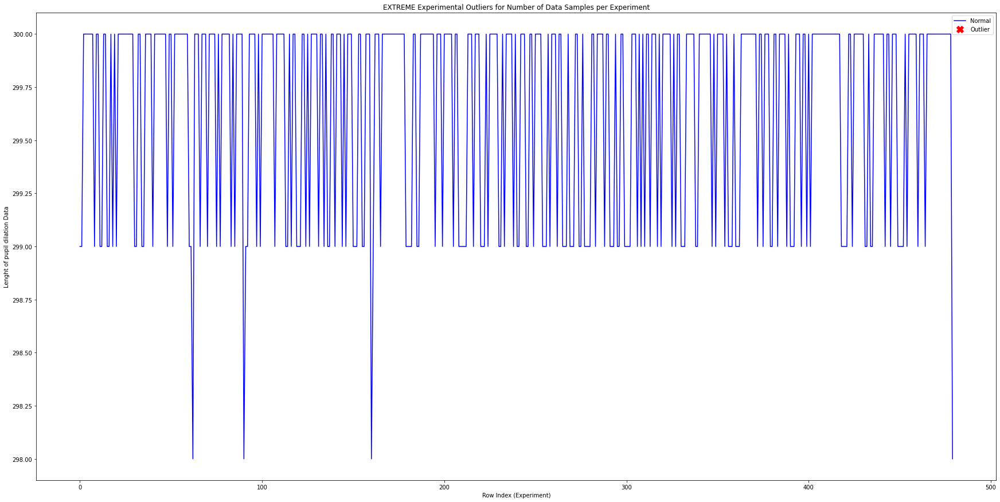

In [ ]:
# Let's plot the outliers from pc1(len(ts_distance)) on top of the data and see where they occured in the time series
a = df[df['outlier_len_pupil_dilation'] == 1]  # anomaly
_ = plt.figure(figsize=(30,15))
_ = plt.plot(df['len_pupil_dilation'], color='blue', label='Normal')
_ = plt.plot(a['len_pupil_dilation'], linestyle='none', marker='X', color='red', markersize=12, label='Outlier')
_ = plt.xlabel('Row Index (Experiment)')
_ = plt.ylabel('Lenght of pupil dilation Data')
_ = plt.title('EXTREME Experimental Outliers for Number of Data Samples per Experiment')
_ = plt.legend(loc='best')
plt.show();

# no outliers for pupil dilation

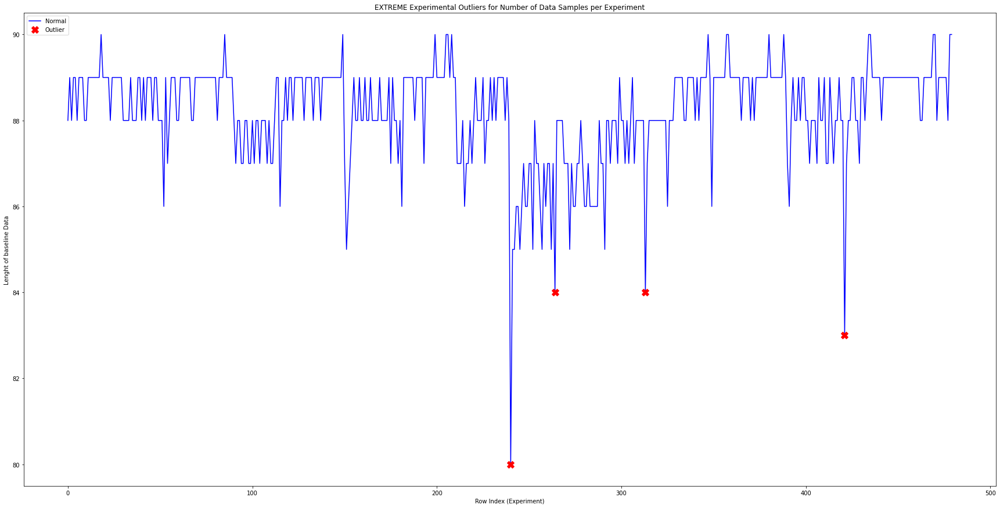

In [ ]:
# Let's plot the outliers from pc1(len(ts_distance)) on top of the data and see where they occured in the time series
a = df[df['outlier_len_baseline'] == 1]  # anomaly
_ = plt.figure(figsize=(30,15))
_ = plt.plot(df['len_baseline'], color='blue', label='Normal')
_ = plt.plot(a['len_baseline'], linestyle='none', marker='X', color='red', markersize=12, label='Outlier')
_ = plt.xlabel('Row Index (Experiment)')
_ = plt.ylabel('Lenght of baseline Data')
_ = plt.title('EXTREME Experimental Outliers for Number of Data Samples per Experiment')
_ = plt.legend(loc='best')
plt.show();

#### OUTLIER DETECTION USING MAD

In [ ]:
#MAD method
from scipy import stats

def mad_method(df, variable_name):
    #Takes two parameters: dataframe & variable of interest as string
    columns = df.columns
    med = np.median(df, axis = 0)
    mad = np.abs(stats.median_abs_deviation(df))
    threshold = 3
    outlier = []
    index=0
    for item in range(len(columns)):
        if columns[item] == variable_name:
            index == item
    for i, v in enumerate(df.loc[:,variable_name]):
        t = (v-med[index])/mad[index]
        if t > threshold:
            outlier.append(i)
        else:
            continue
    return outlier

In [ ]:
df_new = df.copy(deep=True)
outliers_count = {'0':0, '1':0}
max_outlier = [0, 0]
total_number_of_data_points_pre, total_number_of_data_points_post = 0, 0

for ix, single in enumerate(df['relative_pupil_dilation']):
  df_single = pd.DataFrame(single)
  df_single.columns = ['reading']
  total_number_of_data_points_pre+=len(df_single)
  outlier_ids = mad_method(df_single, "reading")
  outliers_count['1']+=len(outlier_ids)
  update_df = df_single.drop([df_single.index[out_id] for out_id in outlier_ids])

  df_new['relative_pupil_dilation'][ix] = update_df['reading']

  if outlier_ids:
    if len(update_df) >= len(df_single):
      raise Exception("the removal went wrong...")
  outlier_ids = mad_method(update_df, "reading")
  if outlier_ids:
    pass
  total_number_of_data_points_post+=len(update_df)
print("total number of data points in df: ", total_number_of_data_points_pre)
print("total number of outliers: ", outliers_count['1'])
print("total number of data points in df after outlier removal: ", total_number_of_data_points_post)
if total_number_of_data_points_pre - total_number_of_data_points_post != outliers_count['1']:
   raise Exception("the removal went wrong...")

<ipython-input-59-028161a50af4>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



total number of data points in df:  144000
total number of outliers:  2977
total number of data points in df after outlier removal:  141023


In [ ]:
number_of_data_points_rp = len([d for ser in df_new['relative_pupil_dilation'] for d in ser])
no = len([d for ser in df['relative_pupil_dilation'] for d in ser])
print("percentaje of data points removed = ", no-number_of_data_points_rp, f"{((no-number_of_data_points_rp)/no)*100}%")
number_of_data_points_rp

percentaje of data points removed =  2977 2.067361111111111%


141023

In [ ]:
# (DONE) compare how mnay remove with each method in one round (# 644 (1round) + 100(5+rounds))
# (DONE) run iwr method just one round not like 6...
# (DONE) save mad df and plot original and after gazedefy transformation
# which one has better acc (compare 2 of the 3 (iqr6round and or 1qr1round vs mad1round))
  # run mad1round
# ad time series transformer

#### NORMALIZATION

In [ ]:
# lenght

df = df_new.copy(deep=True)
df.pupil_dilation = normalize_lenghts(df.pupil_dilation.tolist())
df['baseline'] = normalize_lenghts(df.baseline.tolist())
df['relative_pupil_dilation'] = normalize_lenghts(df.relative_pupil_dilation.tolist())
df

max_lenght:  300
max_lenght:  90
max_lenght:  300


,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,17,"[3.161224365234375, 3.1543808748889526, 3.1583...","[3.173110961914062, 3.1741578177119907, 3.1702...","[0.004154073780980649, -0.0024834252162516243,...",3.157070,299,87,3.0
1,3,"[3.470809936523438, 3.470809936523438, 3.47135...","[3.197723388671875, 3.197723388671875, 3.20873...","[0.16125506024028002, 0.16125506024028002, 0.1...",3.309555,299,86,4.0
2,13,"[3.403854370117188, 3.4050511899201763, 3.4061...","[3.50897216796875, 3.50897216796875, 3.4962499...","[-0.016981818459250064, -0.01586505349258207, ...",3.420836,299,88,0.0
3,10,"[3.73724365234375, 3.73724365234375, 3.7342413...","[3.719680786132812, 3.722215459587868, 3.72224...","[-0.03614275642995102, -0.03614275642995102, -...",3.773386,300,89,3.0
4,6,"[3.293930053710938, 3.3001535983388646, 3.3015...","[3.168869018554688, 3.168869018554688, 2.61075...","[-0.06267227665070507, -0.05644873202277865, -...",3.356602,300,88,3.0
...,...,...,...,...,...,...,...,...
475,2,"[2.64227294921875, 2.64227294921875, 2.6389055...","[1.946334838867188, 1.946334838867188, 2.36054...","[-0.1572053328804346, -0.1572053328804346, -0....",2.799478,300,89,3.0
476,9,"[3.054656982421875, 3.054656982421875, 3.04473...","[2.756729125976562, 2.7879534089163447, 2.8038...","[0.1556734751506026, 0.1556734751506026, 0.145...",2.898984,300,89,3.0
477,8,"[2.870376586914062, 2.884113324525763, 2.88726...","[2.910888671875, 2.915620610955056, 2.91590949...","[-0.022272369008006, -0.008811284993864322, -0...",2.892649,300,88,3.0
478,17,"[2.849151611328125, 2.85937806196436, 2.859408...","[2.693389892578125, 2.693389892578125, 2.77293...","[-0.15018357496995183, -0.14074377438265803, -...",2.999335,299,89,2.0


In [ ]:
# # by resolution in floats
df['pupil_dilation'] =  [[round(float(fl), FLOAT_RESOLUTION) for fl in series] for series in df['pupil_dilation'].tolist()]
df['relative_pupil_dilation'] =  [[round(float(fl), FLOAT_RESOLUTION) for fl in series] for series in df['relative_pupil_dilation'].tolist()]
df['baseline'] =  [[round(float(fl), FLOAT_RESOLUTION) for fl in series] for series in df['baseline'].tolist()]
df['baseline_mean'] =  [round(float(m), FLOAT_RESOLUTION)for m in df['baseline_mean'].tolist()]
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,17,"[3.1612, 3.1544, 3.1584, 3.1703, 3.1695, 3.163...","[3.1731, 3.1742, 3.1702, 3.1777, 3.1782, 3.179...","[0.0042, -0.0025, 0.0011, 0.0122, 0.0125, 0.00...",3.1571,299,87,3.0
1,3,"[3.4708, 3.4708, 3.4714, 3.46, 3.4578, 3.4672,...","[3.1977, 3.1977, 3.2087, 3.2254, 3.2263, 3.228...","[0.1613, 0.1613, 0.1618, 0.1504, 0.1483, 0.157...",3.3096,299,86,4.0
2,13,"[3.4039, 3.4051, 3.4062, 3.4017, 3.4111, 3.419...","[3.509, 3.509, 3.4962, 3.4912, 3.489, 3.4898, ...","[-0.017, -0.0159, -0.0148, -0.0183, -0.0122, -...",3.4208,299,88,0.0
3,10,"[3.7372, 3.7372, 3.7342, 3.7421, 3.7434, 3.742...","[3.7197, 3.7222, 3.7222, 3.7197, 3.7219, 3.721...","[-0.0361, -0.0361, -0.0384, -0.034, -0.0306, -...",3.7734,300,89,3.0
4,6,"[3.2939, 3.3002, 3.3015, 3.3039, 3.3089, 3.315...","[3.1689, 3.1689, 2.6108, 1.6637, 1.6637, 2.357...","[-0.0627, -0.0564, -0.0551, -0.0527, -0.0477, ...",3.3566,300,88,3.0
...,...,...,...,...,...,...,...,...
475,2,"[2.6423, 2.6423, 2.6389, 2.6493, 2.6568, 2.654...","[1.9463, 1.9463, 2.3605, 2.7307, 2.7424, 2.902...","[-0.1572, -0.1572, -0.159, -0.1574, -0.1496, -...",2.7995,300,89,3.0
476,9,"[3.0547, 3.0547, 3.0447, 3.0543, 3.0402, 2.988...","[2.7567, 2.788, 2.8039, 2.8004, 2.814, 2.8188,...","[0.1557, 0.1557, 0.1458, 0.1553, 0.1412, 0.089...",2.8990,300,89,3.0
477,8,"[2.8704, 2.8841, 2.8873, 2.8631, 2.7499, 2.736...","[2.9109, 2.9156, 2.9159, 2.9191, 2.9257, 2.936...","[-0.0223, -0.0088, -0.0055, -0.0281, -0.1336, ...",2.8926,300,88,3.0
478,17,"[2.8492, 2.8594, 2.8594, 2.8605, 2.871, 2.8691...","[2.6934, 2.6934, 2.7729, 2.8812, 2.9097, 2.928...","[-0.1502, -0.1407, -0.1399, -0.1391, -0.1316, ...",2.9993,299,89,2.0


In [ ]:
# save without norm by value and with binary rating
df['binary_rating'] = df['rating'].map(lambda i: 1 if i >2 else 0)
# df.to_csv("arup_relative_binary_nonormvalue_outliersout.csv")

In [ ]:
df['binary_rating'] = df['rating'].map(lambda i: i if i > 3 or i < 2 else "ambiguous")

In [ ]:
# by value
# try except AttributeError
df.pupil_dilation = df.pupil_dilation.apply(normalize)
df.relative_pupil_dilation = df.relative_pupil_dilation.apply(normalize)
df.baseline = df.baseline.apply(normalize)
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
0,17,"[-1.7525855134693722, -1.8190913589770397, -1....","[0.7060067223977682, 0.7544404175799361, 0.578...","[-1.7925605348079714, -1.862228782024836, -1.8...",3.1571,299,87,3.0,ambiguous
1,3,"[1.2176156041707895, 1.2176156041707895, 1.225...","[-1.3581746672507147, -1.3581746672507147, -1....","[1.2182770853433815, 1.2182770853433815, 1.224...",3.3096,299,86,4.0,4.0
2,13,"[-0.5506886754289532, -0.5366002622909243, -0....","[1.8180811769336225, 1.8180811769336225, 1.554...","[-0.46670598813629544, -0.4524440747854006, -0...",3.4208,299,88,0.0,0.0
3,10,"[-0.13038092980576416, -0.13038092980576416, -...","[-1.2916430707342805, -1.2314957776105555, -1....","[0.10674645047056029, 0.10674645047056029, 0.0...",3.7734,300,89,3.0,ambiguous
4,6,"[-1.6005059921193285, -1.5309189351513088, -1....","[-0.6095257863465066, -0.6095257863465066, -2....","[-1.600462017709065, -1.5308746315330315, -1.5...",3.3566,300,88,3.0,ambiguous
...,...,...,...,...,...,...,...,...,...
475,2,"[-1.8129066034959178, -1.8129066034959178, -1....","[-3.5637418558531917, -3.5637418558531917, -1....","[-2.524357250296459, -2.524357250296459, -2.54...",2.7995,300,89,3.0,ambiguous
476,9,"[-1.1973382049271195, -1.1973382049271195, -1....","[-2.2034706823234536, -1.718773547936069, -1.4...","[-1.1975734885131353, -1.1975734885131353, -1....",2.8990,300,89,3.0,ambiguous
477,8,"[-1.3698019305498126, -1.1948917661508176, -1....","[0.43410491382689886, 0.5459699022818387, 0.55...","[-1.3740868493914669, -1.196170869071207, -1.1...",2.8926,300,88,3.0,ambiguous
478,17,"[-1.6573140775979731, -1.5165131725682883, -1....","[-2.7415844286867963, -2.7415844286867963, -2....","[-1.830750300258553, -1.6683067420766, -1.6546...",2.9993,299,89,2.0,ambiguous


In [ ]:
df = df[df['binary_rating'] != "ambiguous"]
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
1,3,"[1.2176156041707895, 1.2176156041707895, 1.225...","[-1.3581746672507147, -1.3581746672507147, -1....","[1.2182770853433815, 1.2182770853433815, 1.224...",3.3096,299,86,4.0,4.0
2,13,"[-0.5506886754289532, -0.5366002622909243, -0....","[1.8180811769336225, 1.8180811769336225, 1.554...","[-0.46670598813629544, -0.4524440747854006, -0...",3.4208,299,88,0.0,0.0
6,15,"[-0.39132386508686584, -0.39132386508686584, -...","[1.2670939693332208, 1.3338825450780827, 1.270...","[-0.3909166678503027, -0.3909166678503027, -0....",3.3131,299,89,4.0,4.0
12,19,"[0.6351771978966128, 0.6262027505065682, 0.627...","[-1.3145890774594577, -1.2724450768823985, -1....","[0.9117965708939963, 0.9012202866819958, 0.901...",3.3432,300,87,4.0,4.0
14,1,"[-0.477727338213554, -0.48012821939866557, -0....","[-2.2553288793867763, -1.8253483754831041, -1....","[-0.3688873693888079, -0.37091902312780006, -0...",3.2648,300,88,4.0,4.0
...,...,...,...,...,...,...,...,...,...
424,15,"[-0.18742027920784232, -0.18742027920784232, -...","[0.4693581018697239, 0.4693581018697239, 0.472...","[-0.18720841471451935, -0.18720841471451935, -...",2.4805,300,86,4.0,4.0
429,9,"[1.022746164060147, 1.0161250478539556, 1.1114...","[-0.26998151043413754, -0.3891786452836412, -0...","[1.1177305425596133, 1.112201374480071, 1.2048...",2.7379,299,86,4.0,4.0
430,13,"[-0.06783408426371859, -0.06783408426371859, -...","[0.9726623236107941, 1.057089982014295, 1.0768...","[-0.06751332911392094, -0.06751332911392094, -...",2.6844,300,87,4.0,4.0
431,26,"[-1.2653224251758979, -1.2653224251758979, -1....","[-0.4255251056978093, -0.4255251056978093, -4....","[-1.2646154068448152, -1.2646154068448152, -1....",2.6360,300,87,4.0,4.0


In [ ]:
number_of_data_points_final = len([d for ser in df.relative_pupil_dilation for d in ser])
number_of_data_points_final

39600

In [ ]:
# round float values once more
df['pupil_dilation'] =  [[round(float(fl), FLOAT_RESOLUTION) for fl in series] for series in df['pupil_dilation'].tolist()]
df['relative_pupil_dilation'] =  [[round(float(fl), FLOAT_RESOLUTION) for fl in series] for series in df['relative_pupil_dilation'].tolist()]
df['baseline'] =  [[round(float(fl), FLOAT_RESOLUTION) for fl in series] for series in df['baseline'].tolist()]
df['baseline_mean'] =  [round(float(m), FLOAT_RESOLUTION)for m in df['baseline_mean'].tolist()]
df

<ipython-input-23-cb843b5b028d>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-23-cb843b5b028d>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-23-cb843b5b028d>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-23-cb843b5

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
4,1,"[-0.3565, -0.3565, -0.3464, -0.3592, -0.4445, ...","[-1.5802, -1.5802, -1.6196, -1.7651, -1.6401, ...","[-0.3153, -0.3153, -0.3046, -0.3167, -0.3976, ...",3.2742,299,89,4.0,4.0
6,19,"[-0.3151, 0.3373, 0.7393, 0.8382, 0.89, 0.9478...","[1.7322, 1.7906, 1.8521, 1.8433, 1.8228, 1.805...","[-0.3152, 0.3373, 0.7393, 0.8382, 0.89, 0.9478...",3.3728,300,88,1.0,1.0
10,2,"[0.0674, 0.0674, -0.0219, -0.0304, -0.059, -0....","[-0.0458, -0.0458, 0.2335, 0.2016, 0.2296, 0.5...","[0.1563, 0.1563, 0.0782, 0.0562, 0.0342, 0.031...",3.2766,299,88,1.0,1.0
13,8,"[-0.0811, -0.0811, -0.2045, -0.2982, -0.3385, ...","[0.0106, -0.0117, -0.0188, -0.0188, -0.0184, -...","[-0.0811, -0.0811, -0.2045, -0.2982, -0.3386, ...",3.2729,300,89,1.0,1.0
18,16,"[0.6868, 0.682, 0.626, 0.6812, 0.7274, 0.6455,...","[1.8809, 1.8939, 1.8899, 1.8339, 1.7669, 1.722...","[0.6868, 0.6819, 0.626, 0.6811, 0.7273, 0.6454...",3.2533,299,89,1.0,1.0
...,...,...,...,...,...,...,...,...,...
462,30,"[-2.3485, -2.3439, -2.2964, -2.2552, -2.2342, ...","[1.4693, 1.5409, 1.5642, 1.5476, 1.496, 1.4635...","[-2.4216, -2.4167, -2.3715, -2.3282, -2.3036, ...",2.7762,300,88,1.0,1.0
465,13,"[-2.0049, -1.9824, -2.0558, -2.0108, -2.0558, ...","[1.3932, 1.3679, 1.2593, 1.2684, 1.4366, 1.581...","[-2.0307, -2.0087, -2.0796, -2.0392, -2.0796, ...",2.9799,300,89,4.0,4.0
466,11,"[-0.2462, -0.3986, -0.0733, -0.1234, -0.1507, ...","[1.0495, 1.004, 0.9584, 0.8885, 0.8232, 0.8885...","[-0.2282, -0.3823, -0.0579, -0.1022, -0.1302, ...",3.1498,300,89,4.0,4.0
468,19,"[-1.4679, -1.5208, -1.43, -1.5587, -1.727, -1....","[1.3113, 1.3113, 1.3626, 1.3776, 1.3739, 1.372...","[-1.4674, -1.5204, -1.4296, -1.5582, -1.7266, ...",3.0612,300,89,1.0,1.0


In [ ]:
df.describe()

,baseline_mean,len_pupil_dilation,len_baseline,rating
count,132.000000,132.000000,132.000000,132.00000
mean,3.210005,299.651515,88.401515,2.50000
std,0.308596,0.509226,0.995101,1.56537
min,2.366700,298.000000,85.000000,0.00000
25%,3.126950,299.000000,88.000000,1.00000
50%,3.252450,300.000000,89.000000,4.00000
75%,3.373700,300.000000,89.000000,4.00000
max,3.972400,300.000000,90.000000,4.00000


In [ ]:
df.to_csv("arup_relative_norm_binary_extremes_nooutliers.csv")

#### PLOT NORMALIZED

In [ ]:
pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.pupil_dilation)]
relative_pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.relative_pupil_dilation)]
baseline_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.baseline)]

In [ ]:
HTML(plot_collection(4, pupil_collection).to_html())

total number of graphs:  132
plots:  68


/usr/local/lib/python3.8/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




#### SAVE DATAFRAME TO ML-READY

In [ ]:
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
4,1,"[-0.3565, -0.3565, -0.3464, -0.3592, -0.4445, ...","[-1.5802, -1.5802, -1.6196, -1.7651, -1.6401, ...","[-0.3153, -0.3153, -0.3046, -0.3167, -0.3976, ...",3.2742,299,89,4.0,4.0
6,19,"[-0.3151, 0.3373, 0.7393, 0.8382, 0.89, 0.9478...","[1.7322, 1.7906, 1.8521, 1.8433, 1.8228, 1.805...","[-0.3152, 0.3373, 0.7393, 0.8382, 0.89, 0.9478...",3.3728,300,88,1.0,1.0
10,2,"[0.0674, 0.0674, -0.0219, -0.0304, -0.059, -0....","[-0.0458, -0.0458, 0.2335, 0.2016, 0.2296, 0.5...","[0.1563, 0.1563, 0.0782, 0.0562, 0.0342, 0.031...",3.2766,299,88,1.0,1.0
13,8,"[-0.0811, -0.0811, -0.2045, -0.2982, -0.3385, ...","[0.0106, -0.0117, -0.0188, -0.0188, -0.0184, -...","[-0.0811, -0.0811, -0.2045, -0.2982, -0.3386, ...",3.2729,300,89,1.0,1.0
18,16,"[0.6868, 0.682, 0.626, 0.6812, 0.7274, 0.6455,...","[1.8809, 1.8939, 1.8899, 1.8339, 1.7669, 1.722...","[0.6868, 0.6819, 0.626, 0.6811, 0.7273, 0.6454...",3.2533,299,89,1.0,1.0
...,...,...,...,...,...,...,...,...,...
462,30,"[-2.3485, -2.3439, -2.2964, -2.2552, -2.2342, ...","[1.4693, 1.5409, 1.5642, 1.5476, 1.496, 1.4635...","[-2.4216, -2.4167, -2.3715, -2.3282, -2.3036, ...",2.7762,300,88,1.0,1.0
465,13,"[-2.0049, -1.9824, -2.0558, -2.0108, -2.0558, ...","[1.3932, 1.3679, 1.2593, 1.2684, 1.4366, 1.581...","[-2.0307, -2.0087, -2.0796, -2.0392, -2.0796, ...",2.9799,300,89,4.0,4.0
466,11,"[-0.2462, -0.3986, -0.0733, -0.1234, -0.1507, ...","[1.0495, 1.004, 0.9584, 0.8885, 0.8232, 0.8885...","[-0.2282, -0.3823, -0.0579, -0.1022, -0.1302, ...",3.1498,300,89,4.0,4.0
468,19,"[-1.4679, -1.5208, -1.43, -1.5587, -1.727, -1....","[1.3113, 1.3113, 1.3626, 1.3776, 1.3739, 1.372...","[-1.4674, -1.5204, -1.4296, -1.5582, -1.7266, ...",3.0612,300,89,1.0,1.0


In [ ]:
# save df

df_version_1 = df.copy(deep=True).loc[:, ["pupil_dilation", "relative_pupil_dilation", "binary_rating"]]
df_version_1.columns = ["pupil_dilation", "relative_pupil_dilation", "rating"]

df_version_1.to_csv("arup_ml_ready_binary_norm_extremes_nooutliers_MAD.csv")
df_version_1

,pupil_dilation,relative_pupil_dilation,rating
4,"[-0.3565, -0.3565, -0.3464, -0.3592, -0.4445, ...","[-0.3153, -0.3153, -0.3046, -0.3167, -0.3976, ...",4.0
6,"[-0.3151, 0.3373, 0.7393, 0.8382, 0.89, 0.9478...","[-0.3152, 0.3373, 0.7393, 0.8382, 0.89, 0.9478...",1.0
10,"[0.0674, 0.0674, -0.0219, -0.0304, -0.059, -0....","[0.1563, 0.1563, 0.0782, 0.0562, 0.0342, 0.031...",1.0
13,"[-0.0811, -0.0811, -0.2045, -0.2982, -0.3385, ...","[-0.0811, -0.0811, -0.2045, -0.2982, -0.3386, ...",1.0
18,"[0.6868, 0.682, 0.626, 0.6812, 0.7274, 0.6455,...","[0.6868, 0.6819, 0.626, 0.6811, 0.7273, 0.6454...",1.0
...,...,...,...
462,"[-2.3485, -2.3439, -2.2964, -2.2552, -2.2342, ...","[-2.4216, -2.4167, -2.3715, -2.3282, -2.3036, ...",1.0
465,"[-2.0049, -1.9824, -2.0558, -2.0108, -2.0558, ...","[-2.0307, -2.0087, -2.0796, -2.0392, -2.0796, ...",4.0
466,"[-0.2462, -0.3986, -0.0733, -0.1234, -0.1507, ...","[-0.2282, -0.3823, -0.0579, -0.1022, -0.1302, ...",4.0
468,"[-1.4679, -1.5208, -1.43, -1.5587, -1.727, -1....","[-1.4674, -1.5204, -1.4296, -1.5582, -1.7266, ...",1.0


In [ ]:
df_version_1.to_csv("arup_normal_binary.csv")